In [1]:
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
import matplotlib
from matplotlib.lines import Line2D
import statsmodels.api as sm
import glob
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix, multilabel_confusion_matrix, average_precision_score, roc_curve, r2_score
from sklearn.calibration import calibration_curve 
from sklearn.linear_model import LinearRegression
import seaborn as sns
from functools import reduce
import warnings
from scipy.stats import wilcoxon
from itertools import permutations

warnings.filterwarnings("error")
np.set_printoptions(suppress=True)

In [2]:
save_figures = False

In [3]:
# Customize font familiy to use one similar to LateX
matplotlib.rcParams.update(
    {
        'text.usetex': False,
        'font.family': 'stixgeneral',
        'mathtext.fontset': 'stix',
    }
)

# ECE Python functions

In [4]:
def calibration(y, p_mean, num_bins=10):
  """Compute the calibration.
  References:
  https://arxiv.org/abs/1706.04599
  https://arxiv.org/abs/1807.00263
  Args:
    y: one-hot encoding of the true classes, size (?, num_classes)
    p_mean: numpy array, size (?, num_classes)
           containing the mean output predicted probabilities
    num_bins: number of bins
  Returns:
    ece: Expected Calibration Error
    mce: Maximum Calibration Error
  """
  # Compute for every test sample x, the predicted class.
  class_pred = np.argmax(p_mean, axis=1)
  # and the confidence (probability) associated with it.
  conf = np.max(p_mean, axis=1)
  # Convert y from one-hot encoding to the number of the class
  # y = np.argmax(y, axis=1)
  # Storage
  acc_tab = np.zeros(num_bins)  # empirical (true) confidence
  mean_conf = np.zeros(num_bins)  # predicted confidence
  nb_items_bin = np.zeros(num_bins)  # number of items in the bins
  tau_tab = np.linspace(0, 1, num_bins+1)  # confidence bins
  for i in np.arange(num_bins):  # iterate over the bins
    # select the items where the predicted max probability falls in the bin
    # [tau_tab[i], tau_tab[i + 1)]
    sec = (tau_tab[i + 1] > conf) & (conf >= tau_tab[i])
    nb_items_bin[i] = np.sum(sec)  # Number of items in the bin
    # select the predicted classes, and the true classes
    class_pred_sec, y_sec = class_pred[sec], y[sec]
    # average of the predicted max probabilities
    mean_conf[i] = np.mean(conf[sec]) if nb_items_bin[i] > 0 else np.nan
    # compute the empirical confidence
    acc_tab[i] = np.mean(
        class_pred_sec == y_sec) if nb_items_bin[i] > 0 else np.nan

  # Cleaning
  mean_conf = mean_conf[nb_items_bin > 0]
  acc_tab = acc_tab[nb_items_bin > 0]
  nb_items_bin = nb_items_bin[nb_items_bin > 0]

  # Expected Calibration Error
  ece = np.average(
      np.absolute(mean_conf - acc_tab),
      weights=nb_items_bin.astype(float) / np.sum(nb_items_bin))
  # Maximum Calibration Error
  mce = np.max(np.absolute(mean_conf - acc_tab))
  return ece, mce

# Setup matplotlib plots sizes
Simply to improve visuals of plots

In [5]:
SMALL_SIZE = 8
MEDIUM_SIZE = 16
BIGGER_SIZE = 24

plt.rc('font', size=BIGGER_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=BIGGER_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=BIGGER_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

# Load npz files for thresholds and preds. Setup dict and labels. ****

In [6]:
data_folder_inference_data = "../laboratory/data/MedFuse/inference_data" # Set up path to where the trained model pkl files are located

label_titles = {
    0 : "Acute and unspecified renal failure",
    1 : "Acute cerebrovascular disease",
    2 : "Acute myocardial infarction",
    3 : "Cardiac dysrhythmias",
    4 : "Chronic kidney disease",
    5 : "Chronic obstructive pulmonary disease",
    6 : "Complications of surgical procedures",
    7 : "Conduction disorders",
    8 : "Congestive heart failure",
    9 : "Coronary atherosclerosis",
    10 : "Diabetes mellitus with complications",
    11 : "Diabetes mellitus without complication",
    12 : "Disorders of lipid metabolism",
    13 : "Essential hypertension",
    14 : "Fluid and electrolyte disorders",
    15 : "Gastrointestinal hemorrhage",
    16 : "Hypertension with complications",
    17 : "Other liver diseases",
    18 : "Other lower respiratory disease",
    19 : "Other upper respiratory disease",
    20 : "Pleurisy; pneumothorax",
    21 : "Pneumonia",
    22 : "Respiratory failure",
    23 : "Septicemia",
    24 : "Shock"
}

# For simplified visualization in 25 grid plots
short_titles = {
 0: "Acute Renal Failure",
 1: "Cerebrovascular Dis.",
 2: "Myocardial Infarc.",
 3: "Cardiac Dysrhythmias",
 4: "Chronic Kidney Dis.",
 5: "COPD",
 6: "Surgical Complic.",
 7: "Conduction Disorders",
 8: "Heart Failure",
 9: "Coronary Atheroscl.",
 10: "Diabetes w/ Complic.",
 11: "Diabetes no Complic.",
 12: "Lipid Disorders",
 13: "Hypertension",
 14: "Electrolyte Disorders",
 15: "GI Hemorrhage",
 16: "Hypertension w/ Complic.",
 17: "Liver Diseases",
 18: "Lower Resp. Dis.",
 19: "Upper Resp. Dis.",
 20: "Pleurisy / Pneumoth.",
 21: "Pneumonia",
 22: "Resp. Failure",
 23: "Septicemia",
 24: "Shock"
}

# Processing Selective Threshold Methods Masks

In [7]:
seeds = list(range(5))

models = [
    "unimodal_ehr",
    "unimodal_cxr",
    "medfuse", 
    "medfuse_gap",
]

model_titles = {
    0: "EHR",
    1: "CXR",
    2: "MedFuse",
    3: "MedFuse + GAP",
    
}

metric_colors = {
    "auroc": "#008000",
    "auprc": "#d90429",
    "sel_auroc": "#a7c957",
    "sel_auprc": "#ff758f",
    "standard_ece": "#ff9500",
    "positive_ece": "#0096c7",
    "negative_ece": "#023e8a",
}

# We obtain the condition prevalence beforehand
npz_data = np.load(f"{data_folder_inference_data}/medfuse_phenotyping_seed_0.npz")
targets = npz_data["targets"]
prevalence = targets.mean(axis=0)

miscalibration_metrics = {}
selective_prediction_masks = {}

for model in models:
    miscalibration_metrics[model] = dict()
    selective_prediction_masks[model] = dict()
    for seed in seeds:
        miscalibration_metrics[model][seed] = dict()
        selective_prediction_masks[model][seed] = dict()

miscalibration_metrics, selective_prediction_masks

({'unimodal_ehr': {0: {}, 1: {}, 2: {}, 3: {}, 4: {}},
  'unimodal_cxr': {0: {}, 1: {}, 2: {}, 3: {}, 4: {}},
  'medfuse': {0: {}, 1: {}, 2: {}, 3: {}, 4: {}},
  'medfuse_gap': {0: {}, 1: {}, 2: {}, 3: {}, 4: {}}},
 {'unimodal_ehr': {0: {}, 1: {}, 2: {}, 3: {}, 4: {}},
  'unimodal_cxr': {0: {}, 1: {}, 2: {}, 3: {}, 4: {}},
  'medfuse': {0: {}, 1: {}, 2: {}, 3: {}, 4: {}},
  'medfuse_gap': {0: {}, 1: {}, 2: {}, 3: {}, 4: {}}})

In [8]:
# Computation of entropy scores for each individual prediction
for model in models:
    for seed in seeds:
        npz_data = np.load(f"{data_folder_inference_data}/{model}_phenotyping_seed_{seed}.npz")
        
        preds = npz_data["preds"]
        
        all_scores = - (preds * np.log(preds + 0.00000001)) # Entropy computation

        selective_prediction_masks[model][seed]["scores"] = all_scores  

In [9]:
# Processing selective threshold masks for each individual label based on entropy

# We generate 100 thresholds for selection which defines the max value of entropy 
# predictions can have in order to be retained.

# retained.
thresholds = np.linspace(start=100, stop=0, num=100)
for model in models:
    print(f"Obtaining masks for MODEL: {model}")
    for seed in seeds:
        print(f"     SEED: {seed}")
        all_scores = selective_prediction_masks[model][seed]["scores"]  
        n_patients = all_scores.shape[0]
        all_label_masks = np.ones((n_patients, 25, 100))
        
        for label in range(25):
            scores = all_scores[:, label]
            for i, threshold in enumerate(thresholds):
                p = np.percentile(scores, threshold)
                mask = np.array(scores <= p)
                all_label_masks[:, label, i] = mask
        # This generates a mask for each condition/prediction to make the subset of predictions.
        selective_prediction_masks[model][seed]["all_masks"] = all_label_masks
    print("Done\n")

Obtaining masks for MODEL: unimodal_ehr
     SEED: 0
     SEED: 1
     SEED: 2
     SEED: 3
     SEED: 4
Done

Obtaining masks for MODEL: unimodal_cxr
     SEED: 0
     SEED: 1
     SEED: 2
     SEED: 3
     SEED: 4
Done

Obtaining masks for MODEL: medfuse
     SEED: 0
     SEED: 1
     SEED: 2
     SEED: 3
     SEED: 4
Done

Obtaining masks for MODEL: medfuse_gap
     SEED: 0
     SEED: 1
     SEED: 2
     SEED: 3
     SEED: 4
Done



# Computing Selective Evaluation Metrics: AUROC, AUPRC, ECE

In [10]:
auroc_cutoff_thresholds = dict()
n_models = len(models)
n_seeds = len(seeds)

miscalibration_auroc = np.zeros((n_seeds, n_models, 25, 100))
miscalibration_auroc_failure = np.zeros((n_seeds, n_models, 25))
miscalibration_auprc = np.zeros((n_seeds, n_models, 25, 100))

miscalibration_ece = np.zeros((n_seeds, n_models, 25, 100))
miscalibration_pos_ece = np.zeros((n_seeds, n_models, 25, 100))
miscalibration_neg_ece = np.zeros((n_seeds, n_models, 25, 100))

for model_idx, model in enumerate(models):
    for seed in seeds:
        print(f"Processing MODEL {model} | SEED: {seed}")
        all_label_masks = selective_prediction_masks[model][seed]["all_masks"]
        npz_data = np.load(f"{data_folder_inference_data}/{model}_phenotyping_seed_{seed}.npz")
        
        for label in list(range(25)):
            print(f"     Processing label {label+1}: {label_titles[label]}")
            auroc_cutoff_threshold = 99 # Initialize variable for the threshold cutoff at which AUROC fails
            miscalibration_metrics[model][seed][label] = {}
            
            label_masks = all_label_masks[:, label,:]
            
            preds = npz_data["preds"][:,label]
            targets = npz_data["targets"][:,label]
            length = 100
            
            auroc_array = np.ones(length,)
            auprc_array = np.ones(length,)
            ece_array = np.ones(length,)
            pos_ece_array = np.ones(length,)
            neg_ece_array = np.ones(length,)
                
            for threshold in range(length):
    
                mask = label_masks[:, threshold]
                mask = mask.astype(bool)
                
                preds_subset = preds[mask]
                targets_subset = targets[mask]
                
                # ECE
                ece_preds = np.column_stack((1-preds_subset, preds_subset))
                try:
                    ece, _ = calibration(targets_subset, ece_preds, num_bins=10)
                except Exception as e:
                    print(f"    {e} Label {label} threshold {threshold} ECE")
                    ece = 1

                # Positive samples ECE
                pos_samples = (targets_subset == 1)
                try:
                    pos_ece, _ = calibration(targets_subset[pos_samples], ece_preds[pos_samples], num_bins=10)
                except Exception as e:
                    # print(f"    {e} Label {label} threshold {threshold} Pos ECE")
                    pos_ece = 1

                # Negative samples ECE
                neg_samples = (targets_subset == 0)
                try:
                    neg_ece, _ = calibration(targets_subset[neg_samples], ece_preds[neg_samples], num_bins=10)
                except Exception as e:
                    # print(f"    {e} Label {label} threshold {threshold} Neg ECE")
                    neg_ece = 1
    
                # AUROC
                try:
                    auroc = roc_auc_score(targets_subset, preds_subset, average=None)
                except Exception as e:
                    # print(f"    {e} Label {label} threshold {threshold} AUROC")
                    if auroc_cutoff_threshold == 99:
                        auroc_cutoff_threshold = threshold-1 # We add the -1 because we want the threshold previous to the one at which AUROC failed.
                    # auroc = auroc_array.mean()
                    auroc = 0
                
                # AUPRC   
                try:
                    auprc = average_precision_score(targets_subset, preds_subset, average=None)
                except Exception as e:
                    # print(f"   {e} Label {label} threshold {threshold} AUPRC, value {auprc}")
                    # auprc = auprc_array.mean()
                    auprc = 0
    
                auroc_array[threshold] = auroc
                auprc_array[threshold] = auprc
                ece_array[threshold] = ece
                pos_ece_array[threshold] = pos_ece
                neg_ece_array[threshold] = neg_ece
            
            miscalibration_auroc[seed][model_idx][label] = auroc_array
            miscalibration_auroc_failure[seed][model_idx][label] = auroc_cutoff_threshold
            miscalibration_auprc[seed][model_idx][label] = auprc_array
            
            miscalibration_ece[seed][model_idx][label] = ece_array
            miscalibration_pos_ece[seed][model_idx][label] = pos_ece_array
            miscalibration_neg_ece[seed][model_idx][label] = neg_ece_array

        print("\n\n")

Processing MODEL unimodal_ehr | SEED: 0
     Processing label 1: Acute and unspecified renal failure
     Processing label 2: Acute cerebrovascular disease
     Processing label 3: Acute myocardial infarction
     Processing label 4: Cardiac dysrhythmias
     Processing label 5: Chronic kidney disease
     Processing label 6: Chronic obstructive pulmonary disease
     Processing label 7: Complications of surgical procedures
     Processing label 8: Conduction disorders
     Processing label 9: Congestive heart failure
     Processing label 10: Coronary atherosclerosis
     Processing label 11: Diabetes mellitus with complications
     Processing label 12: Diabetes mellitus without complication
     Processing label 13: Disorders of lipid metabolism
     Processing label 14: Essential hypertension
     Processing label 15: Fluid and electrolyte disorders
     Processing label 16: Gastrointestinal hemorrhage
     Processing label 17: Hypertension with complications
     Processing label 

# Plots Analysis:  Selective AUROC, AUPRC and ECE trends

## Unimodal CXR

### Condition Classification Grid

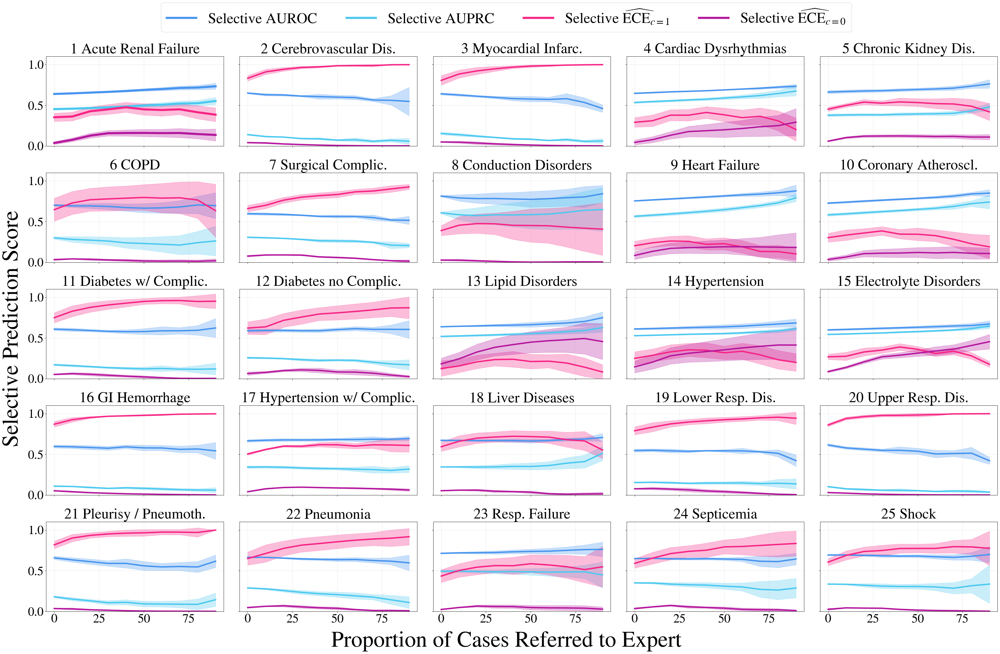

In [11]:
model_i = models.index("unimodal_cxr")

rows, cols = 5,5
fig, axs = plt.subplots(rows, cols, figsize=(40, 25), sharex=True, sharey=True)
fig.tight_layout(rect=(0.025, 0.025, 1, 0.95))

axs = axs.flatten()  # Flatten 5x5 array into 1D so we can loop easily

fig.supxlabel("Proportion of Cases Referred to Expert", y=-0.0125, fontsize=64)
fig.supylabel("Selective Prediction Score",  fontsize=64, x=0)


metric_colors_special = {
    "sel_auroc": "#4895EF",
    "sel_auprc": "#4CC9F0",
    "positive_ece": "#F72585",
    "negative_ece": "#B5179E"
}

n_plot_steps = 10
label = 0

for ax in axs:
    ax.set_title(f"{label+1} {short_titles[label]}", fontsize=42)

    mean_auroc = miscalibration_auroc[:, model_i, :, :].mean(axis=0)[label, :][::n_plot_steps]
    std_auroc = miscalibration_auroc[:, model_i, :, :].std(axis=0)[label, :][::n_plot_steps]
    failure_threshold_auroc = int(miscalibration_auroc_failure[:, model_i, :].max(axis=0)[label])
    ax.plot(range(0, 100, n_plot_steps), mean_auroc, label=f"AUROC: {mean_auroc.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['sel_auroc']}")
    ax.fill_between(range(0, 100, n_plot_steps), mean_auroc - std_auroc, mean_auroc + std_auroc, alpha=0.3, color=f"{metric_colors_special['sel_auroc']}")

    mean_auprc = miscalibration_auprc[:, model_i, :, :].mean(axis=0)[label, :][::n_plot_steps]
    std_auprc = miscalibration_auprc[:, model_i, :, :].std(axis=0)[label, :][::n_plot_steps]
    ax.plot(range(0, 100, n_plot_steps), mean_auprc, label=f"AUPRC: {mean_auprc.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['sel_auprc']}")
    ax.fill_between(range(0, 100, n_plot_steps), mean_auprc - std_auprc, mean_auprc + std_auprc, alpha=0.3, color=f"{metric_colors_special['sel_auprc']}")

    mean_pos_ece = miscalibration_pos_ece[:, model_i, :, :].mean(axis=0)[label, :][::n_plot_steps]
    std_pos_ece = miscalibration_pos_ece[:, model_i, :, :].std(axis=0)[label, :][::n_plot_steps]
    ax.plot(range(0, 100, n_plot_steps), mean_pos_ece, label=f"Positive ECE: {mean_pos_ece.mean()*100:0.2f}", linewidth=2, color=f"{metric_colors_special['positive_ece']}")
    ax.fill_between(range(0, 100, n_plot_steps), mean_pos_ece - std_pos_ece, mean_pos_ece + std_pos_ece, alpha=0.3, color=f"{metric_colors_special['positive_ece']}")

    mean_neg_ece = miscalibration_neg_ece[:, model_i, :, :].mean(axis=0)[label, :][::n_plot_steps]
    std_neg_ece = miscalibration_neg_ece[:, model_i, :, :].std(axis=0)[label, :][::n_plot_steps]
    ax.plot(range(0, 100, n_plot_steps), mean_neg_ece, label=f"Negative ECE: {mean_neg_ece.mean()*100:0.2f}", linewidth=2, color=f"{metric_colors_special['negative_ece']}")
    ax.fill_between(range(0, 100, n_plot_steps), mean_neg_ece - std_neg_ece, mean_neg_ece + std_neg_ece, alpha=0.3, color=f"{metric_colors_special['negative_ece']}")

    # Get handles/labels only for this subplot
    handles, labels_legend = ax.get_legend_handles_labels()
    
    for h in handles:
        h.set_linewidth(4)

    ax.grid(which='major', axis='both', alpha=0.3)
    ax.tick_params(axis='y', labelsize=36)
    ax.tick_params(axis='x', labelsize=36)
    label += 1

plt.ylim([0, 1.1])
fig.subplots_adjust(hspace=0.3)  # Add vertical space for legends

# Collect handles and labels from the whole figure
handles, labels_legend = fig.axes[0].get_legend_handles_labels()

for h in handles:
    h.set_linewidth(6)

fig.legend(
    handles, ["Selective AUROC", "Selective AUPRC", "Selective $\\widehat{\\mathrm{ECE}}_{c=1}$", "Selective $\\widehat{\\mathrm{ECE}}_{c=0}$"],
    loc="upper center",           # position the legend
    bbox_to_anchor=(0.5, 1.03),   # center above all subplots
    fontsize=42,                  # legend text size
    ncol=4,                       # number of columns (adjust as needed)
)

if save_figures:
    plt.savefig("figures/cxr_class_level_grid.pdf", bbox_inches="tight")
plt.show()


### ECE trend

In [12]:
global_auroc = np.ones((5,25))
global_auprc = np.ones((5,25))

for seed in range(5):
    npz_data = np.load(f"{data_folder_inference_data}/unimodal_cxr_phenotyping_seed_{seed}.npz")
    preds = npz_data["preds"]
    targets = npz_data["targets"]
    seed_auroc = roc_auc_score(targets, preds, average=None)
    seed_auprc = average_precision_score(targets, preds, average=None)
    global_auroc[seed, :] = seed_auroc
    global_auprc[seed, :] = seed_auprc

global_auroc = global_auroc.mean(axis=0)
global_auprc = global_auprc.mean(axis=0)
global_auroc, global_auprc, global_auroc.mean(), global_auprc.mean()

(array([0.63878978, 0.65007314, 0.64023394, 0.64686866, 0.66212606,
        0.70176971, 0.597362  , 0.81413479, 0.75500717, 0.72751235,
        0.60820002, 0.58938517, 0.6376582 , 0.61079798, 0.59952231,
        0.59683716, 0.66556519, 0.67160109, 0.5466081 , 0.61506676,
        0.65828661, 0.6650872 , 0.71359729, 0.64916319, 0.69264871]),
 array([0.4532149 , 0.13938736, 0.15325973, 0.53432627, 0.37763332,
        0.3005821 , 0.30787084, 0.6080174 , 0.56502488, 0.58311946,
        0.17090094, 0.25691619, 0.51919801, 0.52870001, 0.54420409,
        0.10923053, 0.34321627, 0.34489795, 0.15379323, 0.10283892,
        0.17928723, 0.28809786, 0.49315991, 0.350435  , 0.3356801 ]),
 np.float64(0.654156102707317),
 np.float64(0.34971969997826635))

In [13]:
auroc_over_thresholds = np.ones((5, 25))
auroc_over_seeds = miscalibration_auroc[:, model_i, :, :]

auprc_over_thresholds = np.ones((5, 25))
auprc_over_seeds = miscalibration_auprc[:, model_i, :, :]

for seed in range(5):
    for label in range(25):
        auroc_label_threshold_values = auroc_over_seeds[seed, label, :]
        auroc_non_zero_elements = auroc_label_threshold_values[auroc_label_threshold_values != 0]
        # Calculate the mean of the non-zero elements
        auroc_mean_of_non_zero = np.mean(auroc_non_zero_elements)
        auroc_over_thresholds[seed, label] = auroc_mean_of_non_zero
    
        auprc_label_threshold_values = auprc_over_seeds[seed, label, :]
        auprc_non_zero_elements = auprc_label_threshold_values[auprc_label_threshold_values != 0]
        # Calculate the mean of the non-zero elements
        auprc_mean_of_non_zero = np.mean(auprc_non_zero_elements)
        auprc_over_thresholds[seed, label] = auprc_mean_of_non_zero

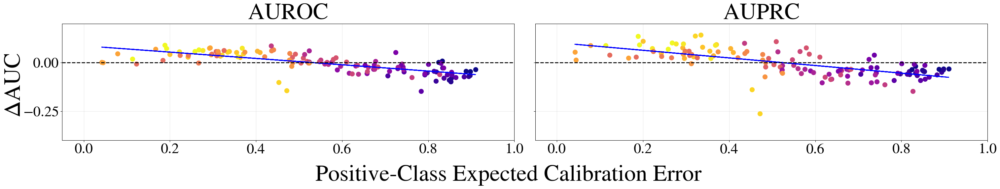

In [14]:
model_i = models.index("unimodal_cxr")

rows, cols = 1, 2
fig, axs = plt.subplots(rows, cols, figsize=(30, 5), sharex=True, sharey=True)
fig.tight_layout(rect=(0.025, 0.025, 1, 0.95))

fig.supxlabel("Positive-Class Expected Calibration Error", fontsize=50, y=-0.12)
fig.supylabel("ΔAUC", fontsize=50, x=-0.01)

axs[0].set_title("AUROC", fontsize=50)
axs[1].set_title("AUPRC", fontsize=50)

n_labels = 25
n_seeds = 5

# ---- Build label colors (yellow -> purple), 25 discrete steps) ----
# Average ECE across thresholds (and seeds, so color doesn't depend on seed)
pos_mean_over_thr = miscalibration_pos_ece[:, model_i, :, :].mean(axis=(0, 2))  # shape: (labels,)
neg_mean_over_thr = miscalibration_neg_ece[:, model_i, :, :].mean(axis=(0, 2))  # shape: (labels,)
label_ece_score   = 0.5 * (pos_mean_over_thr + neg_mean_over_thr)               # shape: (labels,)

# Rank labels by their score and assign evenly spaced colors
rank = np.argsort(label_ece_score)                     # lowest -> highest

cmap = plt.cm.plasma_r                                 # yellow -> purple
palette = cmap(np.linspace(0, 1, n_labels))            # 25 discrete colors

label_colors = np.empty((n_labels, 4))
label_colors[rank] = palette                           # color index follows rank order

# ---- Plot: color by LABEL, 5 points per color (the 5 seeds) ----
for lbl in range(n_labels):
    c = label_colors[lbl]
    for seed in range(n_seeds):
        mean_pos_ece = miscalibration_pos_ece[seed, model_i, lbl, :]
        pos_ece_avg  = mean_pos_ece[0]

        delta_auroc = auroc_over_thresholds[seed, lbl] - global_auroc[lbl]
        delta_auprc = auprc_over_thresholds[seed, lbl] - global_auprc[lbl]

        # same label color for all 4 subplots
        axs[0].scatter(pos_ece_avg, delta_auroc, s=100, color=c)

        axs[1].scatter(pos_ece_avg, delta_auprc, s=100, color=c)

# ---- Ax cosmetics ----

x1 = miscalibration_pos_ece[:, model_i, :, 0].flatten()
y1 = (auroc_over_thresholds - global_auroc).flatten()
y2 = (auprc_over_thresholds - global_auprc).flatten()

coef = np.polyfit(x1, y1, 1) 
poly1d_fn = np.poly1d(coef) 
axs[0].plot(x1, poly1d_fn(x1), color="blue", linewidth=2) #'--k'=blue dashed line, 'yo' = yellow circle marker

coef = np.polyfit(x1, y2, 1) 
poly1d_fn = np.poly1d(coef) 
axs[1].plot(x1, poly1d_fn(x1), color="blue", linewidth=2) #'--k'=blue dashed line, 'yo' = yellow circle marker

axs = axs.flatten()
for ax in axs:
    ax.axhline(0, linewidth=2, color="black", linestyle="dashed")
    ax.grid(which="major", axis="both", alpha=0.3)
    ax.set_xlim(-0.05, 1)
    ax.set_ylim(-0.4, 0.2)
    ax.tick_params(axis='y', labelsize=32)
    ax.tick_params(axis='x', labelsize=32)
    
if save_figures:
    plt.savefig("figures/pos_ece_trend_cxr.svg", bbox_inches="tight")
plt.show()

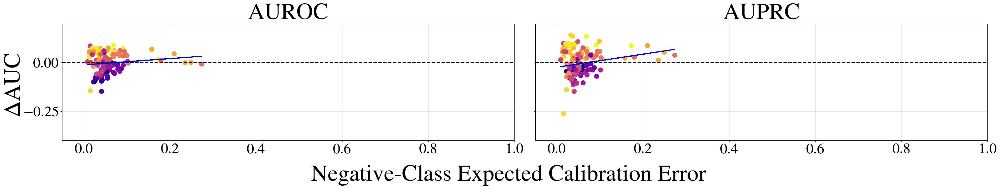

In [15]:
model_i = models.index("unimodal_cxr")

rows, cols = 1, 2
fig, axs = plt.subplots(rows, cols, figsize=(30, 5), sharex=True, sharey=True)
fig.tight_layout(rect=(0.025, 0.025, 1, 0.95))

fig.supxlabel("Negative-Class Expected Calibration Error", fontsize=50, y=-0.12)
fig.supylabel("ΔAUC", fontsize=50, x=-0.01)

axs[0].set_title("AUROC", fontsize=50)
axs[1].set_title("AUPRC", fontsize=50)

n_labels = 25
n_seeds = 5

# ---- Build label colors (yellow -> purple), 25 discrete steps) ----
# Average ECE across thresholds (and seeds, so color doesn't depend on seed)
pos_mean_over_thr = miscalibration_pos_ece[:, model_i, :, :].mean(axis=(0, 2))  # shape: (labels,)
neg_mean_over_thr = miscalibration_neg_ece[:, model_i, :, :].mean(axis=(0, 2))  # shape: (labels,)
label_ece_score   = 0.5 * (pos_mean_over_thr + neg_mean_over_thr)               # shape: (labels,)

# Rank labels by their score and assign evenly spaced colors
rank = np.argsort(label_ece_score)                     # lowest -> highest

cmap = plt.cm.plasma_r                                 # yellow -> purple
palette = cmap(np.linspace(0, 1, n_labels))            # 25 discrete colors

label_colors = np.empty((n_labels, 4))
label_colors[rank] = palette                           # color index follows rank order

# ---- Plot: color by LABEL, 5 points per color (the 5 seeds) ----
for lbl in range(n_labels):
    c = label_colors[lbl]
    for seed in range(n_seeds):

        mean_neg_ece = miscalibration_neg_ece[seed, model_i, lbl, :]
        neg_ece_avg  = mean_neg_ece[0]

        delta_auroc = auroc_over_thresholds[seed, lbl] - global_auroc[lbl]
        delta_auprc = auprc_over_thresholds[seed, lbl] - global_auprc[lbl]

        # same label color for all 4 subplots
        axs[0].scatter(neg_ece_avg, delta_auroc, s=100, color=c)

        axs[1].scatter(neg_ece_avg, delta_auprc, s=100, color=c)

# ---- Ax cosmetics ----

x1 = miscalibration_neg_ece[:, model_i, :, 0].flatten()
y1 = (auroc_over_thresholds - global_auroc).flatten()
y2 = (auprc_over_thresholds - global_auprc).flatten()

coef = np.polyfit(x1, y1, 1) 
poly1d_fn = np.poly1d(coef) 
axs[0].plot(x1, poly1d_fn(x1), color="blue", linewidth=2) #'--k'=blue dashed line, 'yo' = yellow circle marker

coef = np.polyfit(x1, y2, 1) 
poly1d_fn = np.poly1d(coef) 
axs[1].plot(x1, poly1d_fn(x1), color="blue", linewidth=2) #'--k'=blue dashed line, 'yo' = yellow circle marker

axs = axs.flatten()
for ax in axs:
    ax.axhline(0, linewidth=2, color="black", linestyle="dashed")
    ax.grid(which="major", axis="both", alpha=0.3)
    ax.set_xlim(-0.05, 1)
    ax.set_ylim(-0.4, 0.2)
    ax.tick_params(axis='y', labelsize=32)
    ax.tick_params(axis='x', labelsize=32)
    
if save_figures:
    plt.savefig("figures/neg_ece_trend_cxr.svg", bbox_inches="tight")
plt.show()

## Unimodal EHR

### Condition Classification Grid

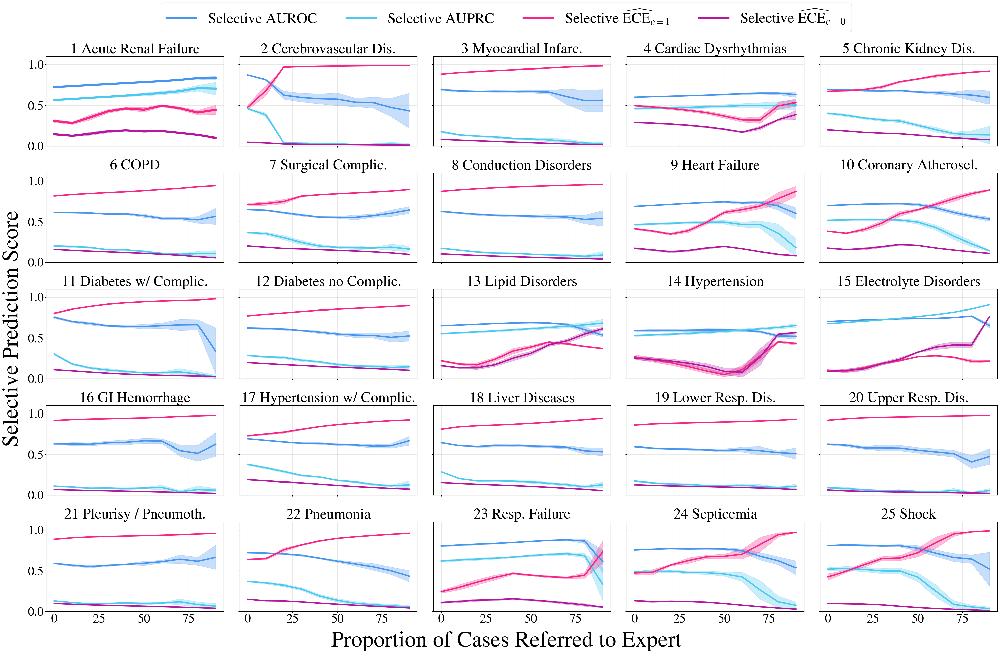

In [16]:
model_i = models.index("unimodal_ehr")

rows, cols = 5,5
fig, axs = plt.subplots(rows, cols, figsize=(40, 25), sharex=True, sharey=True)
fig.tight_layout(rect=(0.025, 0.025, 1, 0.95))

axs = axs.flatten()  # Flatten 5x5 array into 1D so we can loop easily

fig.supxlabel("Proportion of Cases Referred to Expert", y=-0.0125, fontsize=64)
fig.supylabel("Selective Prediction Score",  fontsize=64, x=0)


metric_colors_special = {
    "sel_auroc": "#4895EF",
    "sel_auprc": "#4CC9F0",
    "positive_ece": "#F72585",
    "negative_ece": "#B5179E"
}

n_plot_steps = 10
label = 0

for ax in axs:
    ax.set_title(f"{label+1} {short_titles[label]}", fontsize=42)

    mean_auroc = miscalibration_auroc[:, model_i, :, :].mean(axis=0)[label, :][::n_plot_steps]
    std_auroc = miscalibration_auroc[:, model_i, :, :].std(axis=0)[label, :][::n_plot_steps]
    failure_threshold_auroc = int(miscalibration_auroc_failure[:, model_i, :].max(axis=0)[label])
    ax.plot(range(0, 100, n_plot_steps), mean_auroc, label=f"AUROC: {mean_auroc.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['sel_auroc']}")
    ax.fill_between(range(0, 100, n_plot_steps), mean_auroc - std_auroc, mean_auroc + std_auroc, alpha=0.3, color=f"{metric_colors_special['sel_auroc']}")

    mean_auprc = miscalibration_auprc[:, model_i, :, :].mean(axis=0)[label, :][::n_plot_steps]
    std_auprc = miscalibration_auprc[:, model_i, :, :].std(axis=0)[label, :][::n_plot_steps]
    ax.plot(range(0, 100, n_plot_steps), mean_auprc, label=f"AUPRC: {mean_auprc.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['sel_auprc']}")
    ax.fill_between(range(0, 100, n_plot_steps), mean_auprc - std_auprc, mean_auprc + std_auprc, alpha=0.3, color=f"{metric_colors_special['sel_auprc']}")

    mean_pos_ece = miscalibration_pos_ece[:, model_i, :, :].mean(axis=0)[label, :][::n_plot_steps]
    std_pos_ece = miscalibration_pos_ece[:, model_i, :, :].std(axis=0)[label, :][::n_plot_steps]
    ax.plot(range(0, 100, n_plot_steps), mean_pos_ece, label=f"Positive ECE: {mean_pos_ece.mean()*100:0.2f}", linewidth=2, color=f"{metric_colors_special['positive_ece']}")
    ax.fill_between(range(0, 100, n_plot_steps), mean_pos_ece - std_pos_ece, mean_pos_ece + std_pos_ece, alpha=0.3, color=f"{metric_colors_special['positive_ece']}")

    mean_neg_ece = miscalibration_neg_ece[:, model_i, :, :].mean(axis=0)[label, :][::n_plot_steps]
    std_neg_ece = miscalibration_neg_ece[:, model_i, :, :].std(axis=0)[label, :][::n_plot_steps]
    ax.plot(range(0, 100, n_plot_steps), mean_neg_ece, label=f"Negative ECE: {mean_neg_ece.mean()*100:0.2f}", linewidth=2, color=f"{metric_colors_special['negative_ece']}")
    ax.fill_between(range(0, 100, n_plot_steps), mean_neg_ece - std_neg_ece, mean_neg_ece + std_neg_ece, alpha=0.3, color=f"{metric_colors_special['negative_ece']}")

    # Get handles/labels only for this subplot
    handles, labels_legend = ax.get_legend_handles_labels()
    
    for h in handles:
        h.set_linewidth(4)

    ax.grid(which='major', axis='both', alpha=0.3)
    ax.tick_params(axis='y', labelsize=36)
    ax.tick_params(axis='x', labelsize=36)
    label += 1

plt.ylim([0, 1.1])
fig.subplots_adjust(hspace=0.3)  # Add vertical space for legends

# Collect handles and labels from the whole figure
handles, labels_legend = fig.axes[0].get_legend_handles_labels()

for h in handles:
    h.set_linewidth(6)

fig.legend(
    handles, ["Selective AUROC", "Selective AUPRC", "Selective $\\widehat{\\mathrm{ECE}}_{c=1}$", "Selective $\\widehat{\\mathrm{ECE}}_{c=0}$"],
    loc="upper center",           # position the legend
    bbox_to_anchor=(0.5, 1.03),   # center above all subplots
    fontsize=42,                  # legend text size
    ncol=4,                       # number of columns (adjust as needed)
)

if save_figures:
    plt.savefig("figures/ehr_class_level_grid.pdf", bbox_inches="tight")
plt.show()


### ECE trend

In [17]:
global_auroc = np.ones((5,25))
global_auprc = np.ones((5,25))

for seed in range(5):
    npz_data = np.load(f"{data_folder_inference_data}/unimodal_ehr_phenotyping_seed_{seed}.npz")
    preds = npz_data["preds"]
    targets = npz_data["targets"]
    seed_auroc = roc_auc_score(targets, preds, average=None)
    seed_auprc = average_precision_score(targets, preds, average=None)
    global_auroc[seed, :] = seed_auroc
    global_auprc[seed, :] = seed_auprc

global_auroc = global_auroc.mean(axis=0)
global_auprc = global_auprc.mean(axis=0)
global_auroc, global_auprc, global_auroc.mean(), global_auprc.mean()

(array([0.723711  , 0.8726606 , 0.69336498, 0.59806131, 0.69600568,
        0.61248973, 0.64920414, 0.62716992, 0.68622082, 0.69680891,
        0.75534365, 0.62261973, 0.65022201, 0.59095553, 0.70280534,
        0.62839134, 0.690396  , 0.64313689, 0.59436145, 0.62335181,
        0.59114672, 0.7222953 , 0.80267057, 0.7539259 , 0.80806624]),
 array([0.56393297, 0.45913374, 0.1749614 , 0.46177215, 0.40185488,
        0.20330157, 0.3653388 , 0.17384536, 0.46303886, 0.51683532,
        0.30372222, 0.28626358, 0.5530899 , 0.52908993, 0.6759256 ,
        0.11107559, 0.37716882, 0.28516263, 0.17191986, 0.09063427,
        0.12869821, 0.36795928, 0.61959218, 0.48325433, 0.51855294]),
 np.float64(0.6814154226364413),
 np.float64(0.371444974705711))

In [18]:
auroc_over_thresholds = np.ones((5, 25))
auroc_over_seeds = miscalibration_auroc[:, model_i, :, :]

auprc_over_thresholds = np.ones((5, 25))
auprc_over_seeds = miscalibration_auprc[:, model_i, :, :]

for seed in range(5):
    for label in range(25):
        auroc_label_threshold_values = auroc_over_seeds[seed, label, :]
        auroc_non_zero_elements = auroc_label_threshold_values[auroc_label_threshold_values != 0]
        # Calculate the mean of the non-zero elements
        auroc_mean_of_non_zero = np.mean(auroc_non_zero_elements)
        auroc_over_thresholds[seed, label] = auroc_mean_of_non_zero
    
        auprc_label_threshold_values = auprc_over_seeds[seed, label, :]
        auprc_non_zero_elements = auprc_label_threshold_values[auprc_label_threshold_values != 0]
        # Calculate the mean of the non-zero elements
        auprc_mean_of_non_zero = np.mean(auprc_non_zero_elements)
        auprc_over_thresholds[seed, label] = auprc_mean_of_non_zero

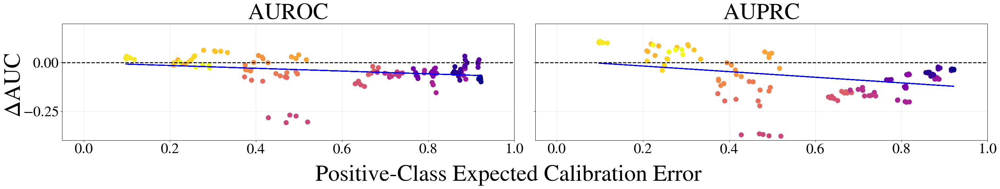

In [19]:
model_i = models.index("unimodal_ehr")

rows, cols = 1, 2
fig, axs = plt.subplots(rows, cols, figsize=(30, 5), sharex=True, sharey=True)
fig.tight_layout(rect=(0.025, 0.025, 1, 0.95))

fig.supxlabel("Positive-Class Expected Calibration Error", fontsize=50, y=-0.12)
fig.supylabel("ΔAUC", fontsize=50, x=-0.01)

axs[0].set_title("AUROC", fontsize=50)
axs[1].set_title("AUPRC", fontsize=50)

n_labels = 25
n_seeds = 5

# ---- Build label colors (yellow -> purple), 25 discrete steps) ----
# Average ECE across thresholds (and seeds, so color doesn't depend on seed)
pos_mean_over_thr = miscalibration_pos_ece[:, model_i, :, :].mean(axis=(0, 2))  # shape: (labels,)
neg_mean_over_thr = miscalibration_neg_ece[:, model_i, :, :].mean(axis=(0, 2))  # shape: (labels,)
label_ece_score   = 0.5 * (pos_mean_over_thr + neg_mean_over_thr)               # shape: (labels,)

# Rank labels by their score and assign evenly spaced colors
rank = np.argsort(label_ece_score)                     # lowest -> highest

cmap = plt.cm.plasma_r                                 # yellow -> purple
palette = cmap(np.linspace(0, 1, n_labels))            # 25 discrete colors

label_colors = np.empty((n_labels, 4))
label_colors[rank] = palette                           # color index follows rank order

# ---- Plot: color by LABEL, 5 points per color (the 5 seeds) ----
for lbl in range(n_labels):
    c = label_colors[lbl]
    for seed in range(n_seeds):
        mean_pos_ece = miscalibration_pos_ece[seed, model_i, lbl, :]
        pos_ece_avg  = mean_pos_ece[0]

        delta_auroc = auroc_over_thresholds[seed, lbl] - global_auroc[lbl]
        delta_auprc = auprc_over_thresholds[seed, lbl] - global_auprc[lbl]

        # same label color for all 4 subplots
        axs[0].scatter(pos_ece_avg, delta_auroc, s=100, color=c)

        axs[1].scatter(pos_ece_avg, delta_auprc, s=100, color=c)

# ---- Ax cosmetics ----

x1 = miscalibration_pos_ece[:, model_i, :, 0].flatten()
y1 = (auroc_over_thresholds - global_auroc).flatten()
y2 = (auprc_over_thresholds - global_auprc).flatten()

coef = np.polyfit(x1, y1, 1) 
poly1d_fn = np.poly1d(coef) 
axs[0].plot(x1, poly1d_fn(x1), color="blue", linewidth=2) #'--k'=blue dashed line, 'yo' = yellow circle marker

coef = np.polyfit(x1, y2, 1) 
poly1d_fn = np.poly1d(coef) 
axs[1].plot(x1, poly1d_fn(x1), color="blue", linewidth=2) #'--k'=blue dashed line, 'yo' = yellow circle marker

axs = axs.flatten()
for ax in axs:
    ax.axhline(0, linewidth=2, color="black", linestyle="dashed")
    ax.grid(which="major", axis="both", alpha=0.3)
    ax.set_xlim(-0.05, 1)
    ax.set_ylim(-0.4, 0.2)
    ax.tick_params(axis='y', labelsize=32)
    ax.tick_params(axis='x', labelsize=32)
    
if save_figures:
    plt.savefig("figures/final/pos_ece_trend_ehr.svg", bbox_inches="tight")
plt.show()

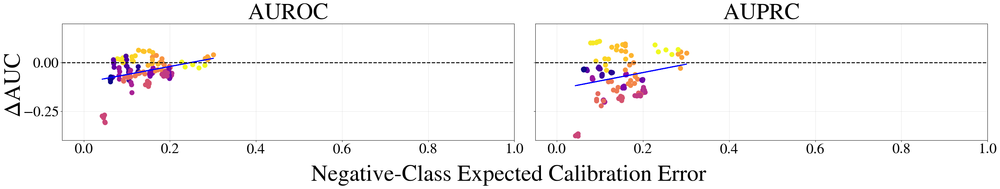

In [20]:
model_i = models.index("unimodal_ehr")

rows, cols = 1, 2
fig, axs = plt.subplots(rows, cols, figsize=(30, 5), sharex=True, sharey=True)
fig.tight_layout(rect=(0.025, 0.025, 1, 0.95))

fig.supxlabel("Negative-Class Expected Calibration Error", fontsize=50, y=-0.12)
fig.supylabel("ΔAUC", fontsize=50, x=-0.01)

axs[0].set_title("AUROC", fontsize=50)
axs[1].set_title("AUPRC", fontsize=50)

n_labels = 25
n_seeds = 5

# ---- Build label colors (yellow -> purple), 25 discrete steps) ----
# Average ECE across thresholds (and seeds, so color doesn't depend on seed)
pos_mean_over_thr = miscalibration_pos_ece[:, model_i, :, :].mean(axis=(0, 2))  # shape: (labels,)
neg_mean_over_thr = miscalibration_neg_ece[:, model_i, :, :].mean(axis=(0, 2))  # shape: (labels,)
label_ece_score   = 0.5 * (pos_mean_over_thr + neg_mean_over_thr)               # shape: (labels,)

# Rank labels by their score and assign evenly spaced colors
rank = np.argsort(label_ece_score)                     # lowest -> highest

cmap = plt.cm.plasma_r                                 # yellow -> purple
palette = cmap(np.linspace(0, 1, n_labels))            # 25 discrete colors

label_colors = np.empty((n_labels, 4))
label_colors[rank] = palette                           # color index follows rank order

# ---- Plot: color by LABEL, 5 points per color (the 5 seeds) ----
for lbl in range(n_labels):
    c = label_colors[lbl]
    for seed in range(n_seeds):

        mean_neg_ece = miscalibration_neg_ece[seed, model_i, lbl, :]
        neg_ece_avg  = mean_neg_ece[0]

        delta_auroc = auroc_over_thresholds[seed, lbl] - global_auroc[lbl]
        delta_auprc = auprc_over_thresholds[seed, lbl] - global_auprc[lbl]

        # same label color for all 4 subplots
        axs[0].scatter(neg_ece_avg, delta_auroc, s=100, color=c)

        axs[1].scatter(neg_ece_avg, delta_auprc, s=100, color=c)

# ---- Ax cosmetics ----

x1 = miscalibration_neg_ece[:, model_i, :, 0].flatten()
y1 = (auroc_over_thresholds - global_auroc).flatten()
y2 = (auprc_over_thresholds - global_auprc).flatten()

coef = np.polyfit(x1, y1, 1) 
poly1d_fn = np.poly1d(coef) 
axs[0].plot(x1, poly1d_fn(x1), color="blue", linewidth=2) #'--k'=blue dashed line, 'yo' = yellow circle marker

coef = np.polyfit(x1, y2, 1) 
poly1d_fn = np.poly1d(coef) 
axs[1].plot(x1, poly1d_fn(x1), color="blue", linewidth=2) #'--k'=blue dashed line, 'yo' = yellow circle marker

axs = axs.flatten()
for ax in axs:
    ax.axhline(0, linewidth=2, color="black", linestyle="dashed")
    ax.grid(which="major", axis="both", alpha=0.3)
    ax.set_xlim(-0.05, 1)
    ax.set_ylim(-0.4, 0.2)
    ax.tick_params(axis='y', labelsize=32)
    ax.tick_params(axis='x', labelsize=32)
    
if save_figures:
    plt.savefig("figures/final/neg_ece_trend_ehr.svg", bbox_inches="tight")
plt.show()

## MedFuse

### Condition Classification Grid

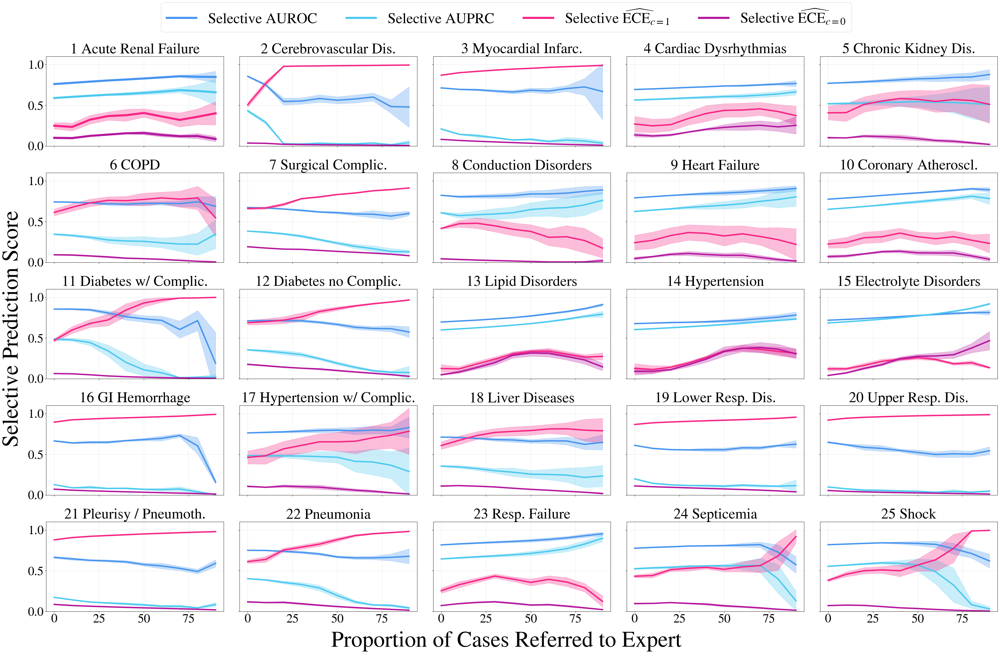

In [21]:
model_i = models.index("medfuse")

rows, cols = 5,5
fig, axs = plt.subplots(rows, cols, figsize=(40, 25), sharex=True, sharey=True)
fig.tight_layout(rect=(0.025, 0.025, 1, 0.95))

axs = axs.flatten()  # Flatten 5x5 array into 1D so we can loop easily

fig.supxlabel("Proportion of Cases Referred to Expert", y=-0.0125, fontsize=64)
fig.supylabel("Selective Prediction Score",  fontsize=64, x=0)


metric_colors_special = {
    "sel_auroc": "#4895EF",
    "sel_auprc": "#4CC9F0",
    "positive_ece": "#F72585",
    "negative_ece": "#B5179E"
}

n_plot_steps = 10
label = 0

for ax in axs:
    ax.set_title(f"{label+1} {short_titles[label]}", fontsize=42)

    mean_auroc = miscalibration_auroc[:, model_i, :, :].mean(axis=0)[label, :][::n_plot_steps]
    std_auroc = miscalibration_auroc[:, model_i, :, :].std(axis=0)[label, :][::n_plot_steps]
    failure_threshold_auroc = int(miscalibration_auroc_failure[:, model_i, :].max(axis=0)[label])
    ax.plot(range(0, 100, n_plot_steps), mean_auroc, label=f"AUROC: {mean_auroc.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['sel_auroc']}")
    ax.fill_between(range(0, 100, n_plot_steps), mean_auroc - std_auroc, mean_auroc + std_auroc, alpha=0.3, color=f"{metric_colors_special['sel_auroc']}")

    mean_auprc = miscalibration_auprc[:, model_i, :, :].mean(axis=0)[label, :][::n_plot_steps]
    std_auprc = miscalibration_auprc[:, model_i, :, :].std(axis=0)[label, :][::n_plot_steps]
    ax.plot(range(0, 100, n_plot_steps), mean_auprc, label=f"AUPRC: {mean_auprc.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['sel_auprc']}")
    ax.fill_between(range(0, 100, n_plot_steps), mean_auprc - std_auprc, mean_auprc + std_auprc, alpha=0.3, color=f"{metric_colors_special['sel_auprc']}")

    mean_pos_ece = miscalibration_pos_ece[:, model_i, :, :].mean(axis=0)[label, :][::n_plot_steps]
    std_pos_ece = miscalibration_pos_ece[:, model_i, :, :].std(axis=0)[label, :][::n_plot_steps]
    ax.plot(range(0, 100, n_plot_steps), mean_pos_ece, label=f"Positive ECE: {mean_pos_ece.mean()*100:0.2f}", linewidth=2, color=f"{metric_colors_special['positive_ece']}")
    ax.fill_between(range(0, 100, n_plot_steps), mean_pos_ece - std_pos_ece, mean_pos_ece + std_pos_ece, alpha=0.3, color=f"{metric_colors_special['positive_ece']}")

    mean_neg_ece = miscalibration_neg_ece[:, model_i, :, :].mean(axis=0)[label, :][::n_plot_steps]
    std_neg_ece = miscalibration_neg_ece[:, model_i, :, :].std(axis=0)[label, :][::n_plot_steps]
    ax.plot(range(0, 100, n_plot_steps), mean_neg_ece, label=f"Negative ECE: {mean_neg_ece.mean()*100:0.2f}", linewidth=2, color=f"{metric_colors_special['negative_ece']}")
    ax.fill_between(range(0, 100, n_plot_steps), mean_neg_ece - std_neg_ece, mean_neg_ece + std_neg_ece, alpha=0.3, color=f"{metric_colors_special['negative_ece']}")

    # Get handles/labels only for this subplot
    handles, labels_legend = ax.get_legend_handles_labels()
    
    for h in handles:
        h.set_linewidth(4)

    ax.grid(which='major', axis='both', alpha=0.3)
    ax.tick_params(axis='y', labelsize=36)
    ax.tick_params(axis='x', labelsize=36)
    label += 1

plt.ylim([0, 1.1])
fig.subplots_adjust(hspace=0.3)  # Add vertical space for legends

# Collect handles and labels from the whole figure
handles, labels_legend = fig.axes[0].get_legend_handles_labels()

for h in handles:
    h.set_linewidth(6)

fig.legend(
    handles, ["Selective AUROC", "Selective AUPRC", "Selective $\\widehat{\\mathrm{ECE}}_{c=1}$", "Selective $\\widehat{\\mathrm{ECE}}_{c=0}$"],
    loc="upper center",           # position the legend
    bbox_to_anchor=(0.5, 1.03),   # center above all subplots
    fontsize=42,                  # legend text size
    ncol=4,                       # number of columns (adjust as needed)
)

if save_figures:
    plt.savefig("figures/det_class_level_grid.pdf", bbox_inches="tight")
plt.show()

### ECE trend

In [22]:
global_auroc = np.ones((5,25))
global_auprc = np.ones((5,25))

for seed in range(5):
    npz_data = np.load(f"{data_folder_inference_data}/medfuse_phenotyping_seed_{seed}.npz")
    preds = npz_data["preds"]
    targets = npz_data["targets"]
    seed_auroc = roc_auc_score(targets, preds, average=None)
    seed_auprc = average_precision_score(targets, preds, average=None)
    global_auroc[seed, :] = seed_auroc
    global_auprc[seed, :] = seed_auprc

global_auroc = global_auroc.mean(axis=0)
global_auprc = global_auprc.mean(axis=0)
global_auroc, global_auprc, global_auroc.mean(), global_auprc.mean()

(array([0.76069611, 0.85569186, 0.71346069, 0.69372592, 0.77009525,
        0.74244318, 0.67342233, 0.82355295, 0.79246867, 0.77567272,
        0.85454032, 0.71141354, 0.69639901, 0.67629807, 0.71826374,
        0.66539335, 0.76332073, 0.71191716, 0.61055597, 0.64869751,
        0.6634367 , 0.75028029, 0.81692718, 0.77623724, 0.81951982]),
 array([0.58923949, 0.43169387, 0.20923839, 0.56481169, 0.51857841,
        0.34539557, 0.3827537 , 0.60853236, 0.62484338, 0.65129035,
        0.485424  , 0.35483382, 0.59942183, 0.6025242 , 0.68506836,
        0.12795416, 0.48190675, 0.35572068, 0.19920408, 0.09833521,
        0.17241761, 0.40167538, 0.64450502, 0.52470668, 0.5544335 ]),
 np.float64(0.7393772116611755),
 np.float64(0.4485803395450466))

In [23]:
auroc_over_thresholds = np.ones((5, 25))
auroc_over_seeds = miscalibration_auroc[:, model_i, :, :]

auprc_over_thresholds = np.ones((5, 25))
auprc_over_seeds = miscalibration_auprc[:, model_i, :, :]

for seed in range(5):
    for label in range(25):
        auroc_label_threshold_values = auroc_over_seeds[seed, label, :]
        auroc_non_zero_elements = auroc_label_threshold_values[auroc_label_threshold_values != 0]
        # Calculate the mean of the non-zero elements
        auroc_mean_of_non_zero = np.mean(auroc_non_zero_elements)
        auroc_over_thresholds[seed, label] = auroc_mean_of_non_zero
    
    
        auprc_label_threshold_values = auprc_over_seeds[seed, label, :]
        auprc_non_zero_elements = auprc_label_threshold_values[auprc_label_threshold_values != 0]
        # Calculate the mean of the non-zero elements
        auprc_mean_of_non_zero = np.mean(auprc_non_zero_elements)
        auprc_over_thresholds[seed, label] = auprc_mean_of_non_zero

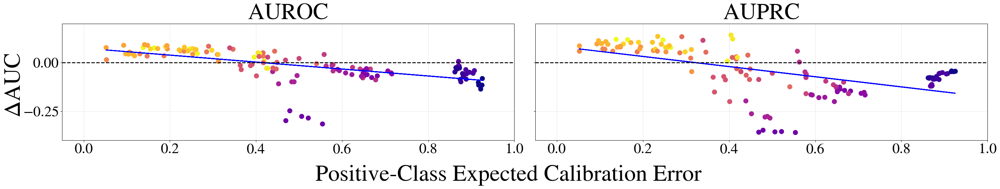

In [24]:
rows, cols = 1, 2
fig, axs = plt.subplots(rows, cols, figsize=(30, 5), sharex=True, sharey=True)
fig.tight_layout(rect=(0.025, 0.025, 1, 0.95))

fig.supxlabel("Positive-Class Expected Calibration Error", fontsize=50, y=-0.12)
fig.supylabel("ΔAUC", fontsize=50, x=-0.01)
model_i = models.index("medfuse")

axs[0].set_title("AUROC", fontsize=50)
axs[1].set_title("AUPRC", fontsize=50)

n_labels = 25
n_seeds = 5

# ---- Build label colors (yellow -> purple), 25 discrete steps) ----
# Average ECE across thresholds (and seeds, so color doesn't depend on seed)
pos_mean_over_thr = miscalibration_pos_ece[:, model_i, :, :].mean(axis=(0, 2))  # shape: (labels,)
neg_mean_over_thr = miscalibration_neg_ece[:, model_i, :, :].mean(axis=(0, 2))  # shape: (labels,)
label_ece_score   = 0.5 * (pos_mean_over_thr + neg_mean_over_thr)               # shape: (labels,)

# Rank labels by their score and assign evenly spaced colors
rank = np.argsort(label_ece_score)                     # lowest -> highest

cmap = plt.cm.plasma_r                                 # yellow -> purple
palette = cmap(np.linspace(0, 1, n_labels))            # 25 discrete colors

label_colors = np.empty((n_labels, 4))
label_colors[rank] = palette                           # color index follows rank order

# ---- Plot: color by LABEL, 5 points per color (the 5 seeds) ----
for lbl in range(n_labels):
    c = label_colors[lbl]
    for seed in range(n_seeds):
        mean_pos_ece = miscalibration_pos_ece[seed, model_i, lbl, :]
        pos_ece_avg  = mean_pos_ece[0]

        delta_auroc = auroc_over_thresholds[seed, lbl] - global_auroc[lbl]
        delta_auprc = auprc_over_thresholds[seed, lbl] - global_auprc[lbl]

        # same label color for all 4 subplots
        axs[0].scatter(pos_ece_avg, delta_auroc, s=100, color=c)

        axs[1].scatter(pos_ece_avg, delta_auprc, s=100, color=c)

# ---- Ax cosmetics ----

x1 = miscalibration_pos_ece[:, model_i, :, 0].flatten()
y1 = (auroc_over_thresholds - global_auroc).flatten()
y2 = (auprc_over_thresholds - global_auprc).flatten()

coef = np.polyfit(x1, y1, 1) 
poly1d_fn = np.poly1d(coef) 
axs[0].plot(x1, poly1d_fn(x1), color="blue", linewidth=2) #'--k'=blue dashed line, 'yo' = yellow circle marker

coef = np.polyfit(x1, y2, 1) 
poly1d_fn = np.poly1d(coef) 
axs[1].plot(x1, poly1d_fn(x1), color="blue", linewidth=2) #'--k'=blue dashed line, 'yo' = yellow circle marker

axs = axs.flatten()
for ax in axs:
    ax.axhline(0, linewidth=2, color="black", linestyle="dashed")
    ax.grid(which="major", axis="both", alpha=0.3)
    ax.set_xlim(-0.05, 1)
    ax.set_ylim(-0.4, 0.2)
    ax.tick_params(axis='y', labelsize=32)
    ax.tick_params(axis='x', labelsize=32)
    
if save_figures:
    plt.savefig("figures/pos_ece_trend_det.svg", bbox_inches="tight")
plt.show()

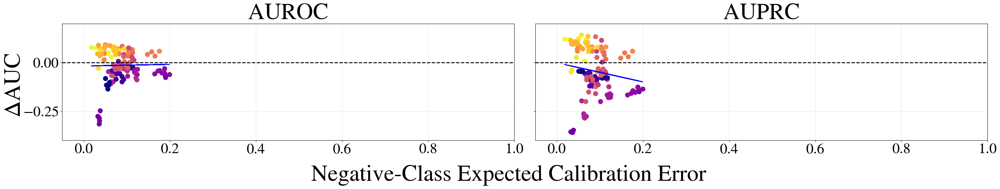

In [25]:
model_i = models.index("medfuse")

rows, cols = 1, 2
fig, axs = plt.subplots(rows, cols, figsize=(30, 5), sharex=True, sharey=True)
fig.tight_layout(rect=(0.025, 0.025, 1, 0.95))

fig.supxlabel("Negative-Class Expected Calibration Error", fontsize=50, y=-0.12)
fig.supylabel("ΔAUC", fontsize=50, x=-0.01)

axs[0].set_title("AUROC", fontsize=50)
axs[1].set_title("AUPRC", fontsize=50)

n_labels = 25
n_seeds = 5

# ---- Build label colors (yellow -> purple), 25 discrete steps) ----
# Average ECE across thresholds (and seeds, so color doesn't depend on seed)
pos_mean_over_thr = miscalibration_pos_ece[:, model_i, :, :].mean(axis=(0, 2))  # shape: (labels,)
neg_mean_over_thr = miscalibration_neg_ece[:, model_i, :, :].mean(axis=(0, 2))  # shape: (labels,)
label_ece_score   = 0.5 * (pos_mean_over_thr + neg_mean_over_thr)               # shape: (labels,)

# Rank labels by their score and assign evenly spaced colors
rank = np.argsort(label_ece_score)                     # lowest -> highest

cmap = plt.cm.plasma_r                                 # yellow -> purple
palette = cmap(np.linspace(0, 1, n_labels))            # 25 discrete colors

label_colors = np.empty((n_labels, 4))
label_colors[rank] = palette                           # color index follows rank order

# ---- Plot: color by LABEL, 5 points per color (the 5 seeds) ----
for lbl in range(n_labels):
    c = label_colors[lbl]
    for seed in range(n_seeds):

        mean_neg_ece = miscalibration_neg_ece[seed, model_i, lbl, :]
        neg_ece_avg  = mean_neg_ece[0]

        delta_auroc = auroc_over_thresholds[seed, lbl] - global_auroc[lbl]
        delta_auprc = auprc_over_thresholds[seed, lbl] - global_auprc[lbl]

        # same label color for all 4 subplots
        axs[0].scatter(neg_ece_avg, delta_auroc, s=100, color=c)

        axs[1].scatter(neg_ece_avg, delta_auprc, s=100, color=c)

# ---- Ax cosmetics ----

x1 = miscalibration_neg_ece[:, model_i, :, 0].flatten()
y1 = (auroc_over_thresholds - global_auroc).flatten()
y2 = (auprc_over_thresholds - global_auprc).flatten()

coef = np.polyfit(x1, y1, 1) 
poly1d_fn = np.poly1d(coef) 
axs[0].plot(x1, poly1d_fn(x1), color="blue", linewidth=2) #'--k'=blue dashed line, 'yo' = yellow circle marker

coef = np.polyfit(x1, y2, 1) 
poly1d_fn = np.poly1d(coef) 
axs[1].plot(x1, poly1d_fn(x1), color="blue", linewidth=2) #'--k'=blue dashed line, 'yo' = yellow circle marker

axs = axs.flatten()
for ax in axs:
    ax.axhline(0, linewidth=2, color="black", linestyle="dashed")
    ax.grid(which="major", axis="both", alpha=0.3)
    ax.set_xlim(-0.05, 1)
    ax.set_ylim(-0.4, 0.2)
    ax.tick_params(axis='y', labelsize=32)
    ax.tick_params(axis='x', labelsize=32)
    
# if save_figures:
plt.savefig("figures/neg_ece_trend_det.pdf", bbox_inches="tight")
plt.show()

## MedFuse + GAP

### Condition Classification Grid

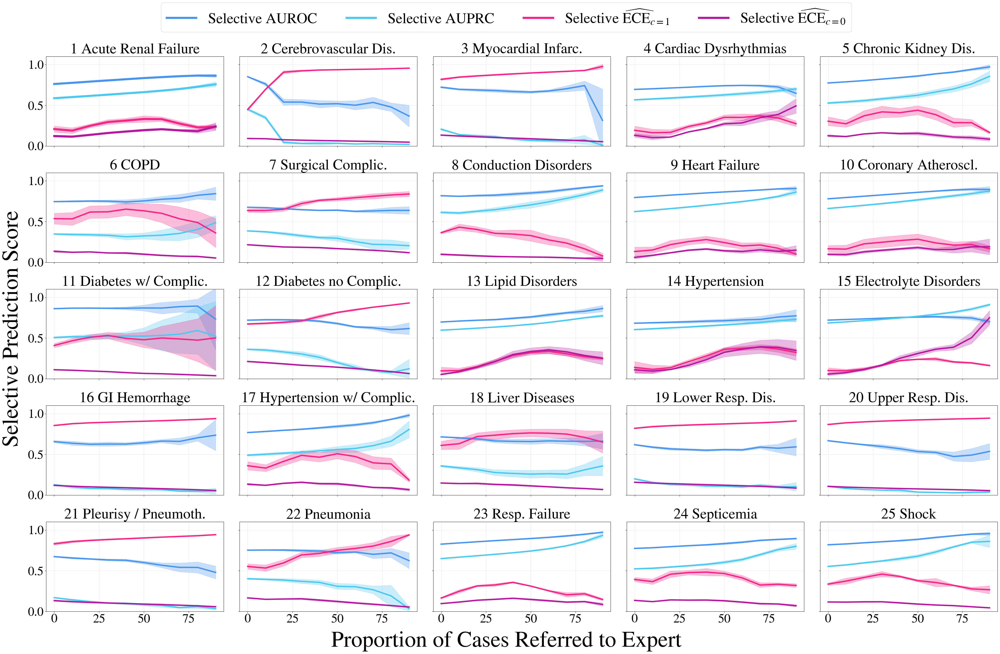

In [26]:
model_i = models.index("medfuse_gap")

rows, cols = 5,5
fig, axs = plt.subplots(rows, cols, figsize=(40, 25), sharex=True, sharey=True)
fig.tight_layout(rect=(0.025, 0.025, 1, 0.95))

axs = axs.flatten()  # Flatten 5x5 array into 1D so we can loop easily

fig.supxlabel("Proportion of Cases Referred to Expert", y=-0.0125, fontsize=64)
fig.supylabel("Selective Prediction Score",  fontsize=64, x=0)


metric_colors_special = {
    "sel_auroc": "#4895EF",
    "sel_auprc": "#4CC9F0",
    "positive_ece": "#F72585",
    "negative_ece": "#B5179E"
}

n_plot_steps = 10
label = 0

for ax in axs:
    ax.set_title(f"{label+1} {short_titles[label]}", fontsize=42)

    mean_auroc = miscalibration_auroc[:, model_i, :, :].mean(axis=0)[label, :][::n_plot_steps]
    std_auroc = miscalibration_auroc[:, model_i, :, :].std(axis=0)[label, :][::n_plot_steps]
    failure_threshold_auroc = int(miscalibration_auroc_failure[:, model_i, :].max(axis=0)[label])
    ax.plot(range(0, 100, n_plot_steps), mean_auroc, label=f"AUROC: {mean_auroc.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['sel_auroc']}")
    ax.fill_between(range(0, 100, n_plot_steps), mean_auroc - std_auroc, mean_auroc + std_auroc, alpha=0.3, color=f"{metric_colors_special['sel_auroc']}")

    mean_auprc = miscalibration_auprc[:, model_i, :, :].mean(axis=0)[label, :][::n_plot_steps]
    std_auprc = miscalibration_auprc[:, model_i, :, :].std(axis=0)[label, :][::n_plot_steps]
    ax.plot(range(0, 100, n_plot_steps), mean_auprc, label=f"AUPRC: {mean_auprc.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['sel_auprc']}")
    ax.fill_between(range(0, 100, n_plot_steps), mean_auprc - std_auprc, mean_auprc + std_auprc, alpha=0.3, color=f"{metric_colors_special['sel_auprc']}")

    mean_pos_ece = miscalibration_pos_ece[:, model_i, :, :].mean(axis=0)[label, :][::n_plot_steps]
    std_pos_ece = miscalibration_pos_ece[:, model_i, :, :].std(axis=0)[label, :][::n_plot_steps]
    ax.plot(range(0, 100, n_plot_steps), mean_pos_ece, label=f"Positive ECE: {mean_pos_ece.mean()*100:0.2f}", linewidth=2, color=f"{metric_colors_special['positive_ece']}")
    ax.fill_between(range(0, 100, n_plot_steps), mean_pos_ece - std_pos_ece, mean_pos_ece + std_pos_ece, alpha=0.3, color=f"{metric_colors_special['positive_ece']}")

    mean_neg_ece = miscalibration_neg_ece[:, model_i, :, :].mean(axis=0)[label, :][::n_plot_steps]
    std_neg_ece = miscalibration_neg_ece[:, model_i, :, :].std(axis=0)[label, :][::n_plot_steps]
    ax.plot(range(0, 100, n_plot_steps), mean_neg_ece, label=f"Negative ECE: {mean_neg_ece.mean()*100:0.2f}", linewidth=2, color=f"{metric_colors_special['negative_ece']}")
    ax.fill_between(range(0, 100, n_plot_steps), mean_neg_ece - std_neg_ece, mean_neg_ece + std_neg_ece, alpha=0.3, color=f"{metric_colors_special['negative_ece']}")

    # Get handles/labels only for this subplot
    handles, labels_legend = ax.get_legend_handles_labels()
    
    for h in handles:
        h.set_linewidth(4)

    ax.grid(which='major', axis='both', alpha=0.3)
    ax.tick_params(axis='y', labelsize=36)
    ax.tick_params(axis='x', labelsize=36)
    label += 1

plt.ylim([0, 1.1])
fig.subplots_adjust(hspace=0.3)  # Add vertical space for legends

# Collect handles and labels from the whole figure
handles, labels_legend = fig.axes[0].get_legend_handles_labels()

for h in handles:
    h.set_linewidth(6)

fig.legend(
    handles, ["Selective AUROC", "Selective AUPRC", "Selective $\\widehat{\\mathrm{ECE}}_{c=1}$", "Selective $\\widehat{\\mathrm{ECE}}_{c=0}$"],
    loc="upper center",           # position the legend
    bbox_to_anchor=(0.5, 1.03),   # center above all subplots
    fontsize=42,                  # legend text size
    ncol=4,                       # number of columns (adjust as needed)
)

if save_figures:
    plt.savefig("figures/gap_class_level_grid.pdf", bbox_inches="tight")
plt.show()

### ECE trend

In [27]:
global_auroc = np.ones((5,25))
global_auprc = np.ones((5,25))

for seed in range(5):
    npz_data = np.load(f"{data_folder_inference_data}/medfuse_gap_phenotyping_seed_{seed}.npz")
    preds = npz_data["preds"]
    targets = npz_data["targets"]
    seed_auroc = roc_auc_score(targets, preds, average=None)
    seed_auprc = average_precision_score(targets, preds, average=None)
    global_auroc[seed, :] = seed_auroc
    global_auprc[seed, :] = seed_auprc

global_auroc = global_auroc.mean(axis=0)
global_auprc = global_auprc.mean(axis=0)
global_auroc, global_auprc, global_auroc.mean(), global_auprc.mean()

(array([0.76138693, 0.85092263, 0.72208499, 0.6950739 , 0.77395475,
        0.7458856 , 0.6763697 , 0.81859834, 0.79604614, 0.78053004,
        0.86034708, 0.71873255, 0.69618739, 0.68175913, 0.71946893,
        0.65656967, 0.76801323, 0.71447065, 0.61842467, 0.66763524,
        0.67329726, 0.75204672, 0.82630284, 0.7738452 , 0.8185792 ]),
 array([0.58686249, 0.45031608, 0.20538684, 0.56695684, 0.52759138,
        0.3475879 , 0.38600008, 0.61359655, 0.62319342, 0.66129999,
        0.50568973, 0.36136524, 0.59556758, 0.60305377, 0.68438324,
        0.12784388, 0.48984505, 0.35713643, 0.19882182, 0.10543834,
        0.16931362, 0.4016406 , 0.64881879, 0.52283736, 0.55268415]),
 np.float64(0.7426613112042247),
 np.float64(0.45172924592148095))

In [28]:
auroc_over_thresholds = np.ones((5, 25))
auroc_over_seeds = miscalibration_auroc[:, model_i, :, :]

auprc_over_thresholds = np.ones((5, 25))
auprc_over_seeds = miscalibration_auprc[:, model_i, :, :]

for seed in range(5):
    for label in range(25):
        auroc_label_threshold_values = auroc_over_seeds[seed, label, :]
        auroc_non_zero_elements = auroc_label_threshold_values[auroc_label_threshold_values != 0]
        # Calculate the mean of the non-zero elements
        auroc_mean_of_non_zero = np.mean(auroc_non_zero_elements)
        auroc_over_thresholds[seed, label] = auroc_mean_of_non_zero
    
        auprc_label_threshold_values = auprc_over_seeds[seed, label, :]
        auprc_non_zero_elements = auprc_label_threshold_values[auprc_label_threshold_values != 0]
        # Calculate the mean of the non-zero elements
        auprc_mean_of_non_zero = np.mean(auprc_non_zero_elements)
        auprc_over_thresholds[seed, label] = auprc_mean_of_non_zero

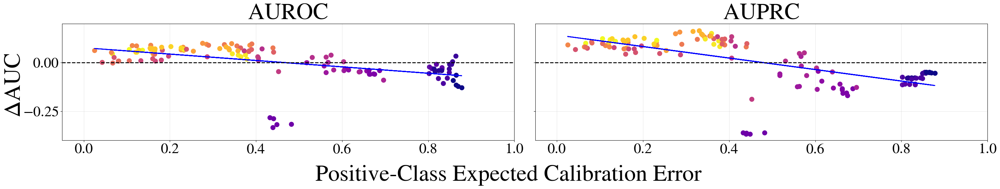

In [29]:
model_i = models.index("medfuse_gap")

rows, cols = 1, 2
fig, axs = plt.subplots(rows, cols, figsize=(30, 5), sharex=True, sharey=True)
fig.tight_layout(rect=(0.025, 0.025, 1, 0.95))

fig.supxlabel("Positive-Class Expected Calibration Error", fontsize=50, y=-0.12)
fig.supylabel("ΔAUC", fontsize=50, x=-0.01)

axs[0].set_title("AUROC", fontsize=50)
axs[1].set_title("AUPRC", fontsize=50)

n_labels = 25
n_seeds = 5

# ---- Build label colors (yellow -> purple), 25 discrete steps) ----
# Average ECE across thresholds (and seeds, so color doesn't depend on seed)
pos_mean_over_thr = miscalibration_pos_ece[:, model_i, :, :].mean(axis=(0, 2))  # shape: (labels,)
neg_mean_over_thr = miscalibration_neg_ece[:, model_i, :, :].mean(axis=(0, 2))  # shape: (labels,)
label_ece_score   = 0.5 * (pos_mean_over_thr + neg_mean_over_thr)               # shape: (labels,)

# Rank labels by their score and assign evenly spaced colors
rank = np.argsort(label_ece_score)                     # lowest -> highest

cmap = plt.cm.plasma_r                                 # yellow -> purple
palette = cmap(np.linspace(0, 1, n_labels))            # 25 discrete colors

label_colors = np.empty((n_labels, 4))
label_colors[rank] = palette                           # color index follows rank order

# ---- Plot: color by LABEL, 5 points per color (the 5 seeds) ----
for lbl in range(n_labels):
    c = label_colors[lbl]
    for seed in range(n_seeds):
        mean_pos_ece = miscalibration_pos_ece[seed, model_i, lbl, :]
        pos_ece_avg  = mean_pos_ece[0]

        delta_auroc = auroc_over_thresholds[seed, lbl] - global_auroc[lbl]
        delta_auprc = auprc_over_thresholds[seed, lbl] - global_auprc[lbl]

        # same label color for all 4 subplots
        axs[0].scatter(pos_ece_avg, delta_auroc, s=100, color=c)

        axs[1].scatter(pos_ece_avg, delta_auprc, s=100, color=c)

# ---- Ax cosmetics ----

x1 = miscalibration_pos_ece[:, model_i, :, 0].flatten()
y1 = (auroc_over_thresholds - global_auroc).flatten()
y2 = (auprc_over_thresholds - global_auprc).flatten()

coef = np.polyfit(x1, y1, 1) 
poly1d_fn = np.poly1d(coef) 
axs[0].plot(x1, poly1d_fn(x1), color="blue", linewidth=2) #'--k'=blue dashed line, 'yo' = yellow circle marker

coef = np.polyfit(x1, y2, 1) 
poly1d_fn = np.poly1d(coef) 
axs[1].plot(x1, poly1d_fn(x1), color="blue", linewidth=2) #'--k'=blue dashed line, 'yo' = yellow circle marker

axs = axs.flatten()
for ax in axs:
    ax.axhline(0, linewidth=2, color="black", linestyle="dashed")
    ax.grid(which="major", axis="both", alpha=0.3)
    ax.set_xlim(-0.05, 1)
    ax.set_ylim(-0.4, 0.2)
    ax.tick_params(axis='y', labelsize=32)
    ax.tick_params(axis='x', labelsize=32)
    
if save_figures:
    plt.savefig("figures/final/pos_ece_trend_gap.svg", bbox_inches="tight")
plt.show()

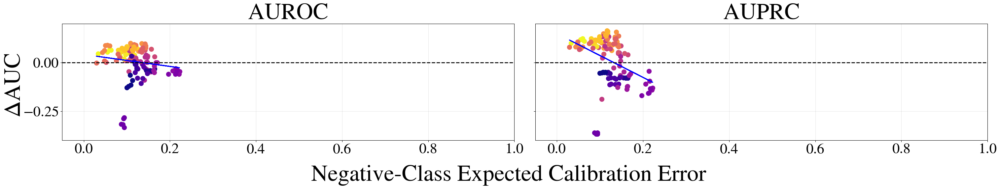

In [30]:
model_i = models.index("medfuse_gap")


rows, cols = 1, 2
fig, axs = plt.subplots(rows, cols, figsize=(30, 5), sharex=True, sharey=True)
fig.tight_layout(rect=(0.025, 0.025, 1, 0.95))

fig.supxlabel("Negative-Class Expected Calibration Error", fontsize=50, y=-0.12)
fig.supylabel("ΔAUC", fontsize=50, x=-0.01)

axs[0].set_title("AUROC", fontsize=50)
axs[1].set_title("AUPRC", fontsize=50)

n_labels = 25
n_seeds = 5

# ---- Build label colors (yellow -> purple), 25 discrete steps) ----
# Average ECE across thresholds (and seeds, so color doesn't depend on seed)
pos_mean_over_thr = miscalibration_pos_ece[:, model_i, :, :].mean(axis=(0, 2))  # shape: (labels,)
neg_mean_over_thr = miscalibration_neg_ece[:, model_i, :, :].mean(axis=(0, 2))  # shape: (labels,)
label_ece_score   = 0.5 * (pos_mean_over_thr + neg_mean_over_thr)               # shape: (labels,)

# Rank labels by their score and assign evenly spaced colors
rank = np.argsort(label_ece_score)                     # lowest -> highest

cmap = plt.cm.plasma_r                                 # yellow -> purple
palette = cmap(np.linspace(0, 1, n_labels))            # 25 discrete colors

label_colors = np.empty((n_labels, 4))
label_colors[rank] = palette                           # color index follows rank order

# ---- Plot: color by LABEL, 5 points per color (the 5 seeds) ----
for lbl in range(n_labels):
    c = label_colors[lbl]
    for seed in range(n_seeds):

        mean_neg_ece = miscalibration_neg_ece[seed, model_i, lbl, :]
        neg_ece_avg  = mean_neg_ece[0]

        delta_auroc = auroc_over_thresholds[seed, lbl] - global_auroc[lbl]
        delta_auprc = auprc_over_thresholds[seed, lbl] - global_auprc[lbl]

        # same label color for all 4 subplots
        axs[0].scatter(neg_ece_avg, delta_auroc, s=100, color=c)

        axs[1].scatter(neg_ece_avg, delta_auprc, s=100, color=c)

# ---- Ax cosmetics ----

x1 = miscalibration_neg_ece[:, model_i, :, 0].flatten()
y1 = (auroc_over_thresholds - global_auroc).flatten()
y2 = (auprc_over_thresholds - global_auprc).flatten()

coef = np.polyfit(x1, y1, 1) 
poly1d_fn = np.poly1d(coef) 
axs[0].plot(x1, poly1d_fn(x1), color="blue", linewidth=2) #'--k'=blue dashed line, 'yo' = yellow circle marker

coef = np.polyfit(x1, y2, 1) 
poly1d_fn = np.poly1d(coef) 
axs[1].plot(x1, poly1d_fn(x1), color="blue", linewidth=2) #'--k'=blue dashed line, 'yo' = yellow circle marker

axs = axs.flatten()
for ax in axs:
    ax.axhline(0, linewidth=2, color="black", linestyle="dashed")
    ax.grid(which="major", axis="both", alpha=0.3)
    ax.set_xlim(-0.05, 1)
    ax.set_ylim(-0.4, 0.2)
    ax.tick_params(axis='y', labelsize=32)
    ax.tick_params(axis='x', labelsize=32)
    
if save_figures:
    plt.savefig("figures/final/neg_ece_trend_gap.svg", bbox_inches="tight")
plt.show()

## Comparison between selected conditions

### Label 2 Acute Cerebrovascular Disease

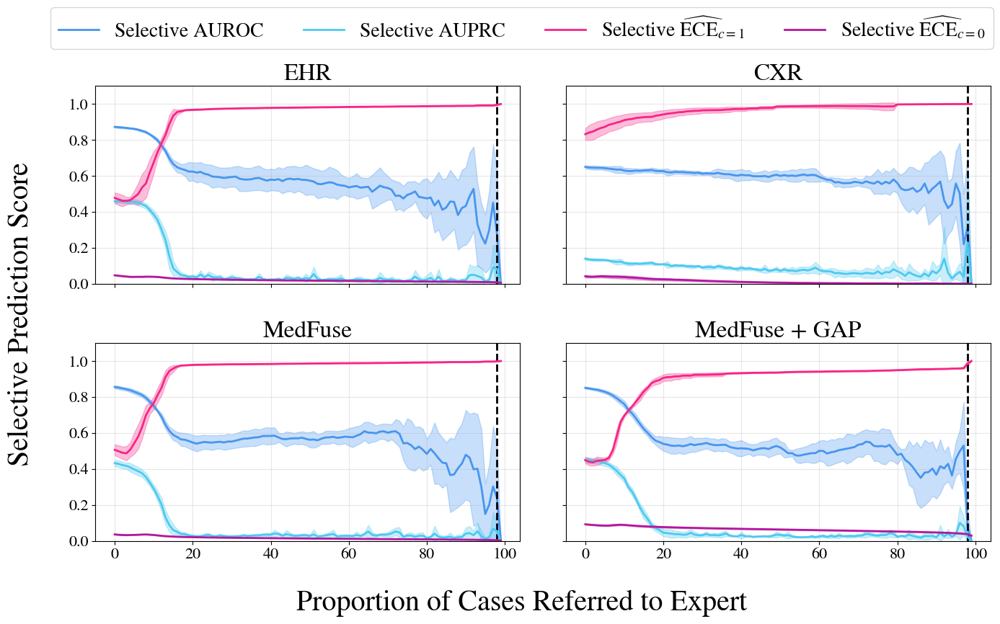

In [31]:
label = 1
rows, cols = 2,2

w_sub = 7   # width per subplot
h_sub = 4   # height per subplot

fig_width = cols * w_sub
fig_height = rows * h_sub

fig, axs = plt.subplots(rows, cols, figsize=(fig_width, fig_height), sharex=True, sharey=True)
fig.tight_layout(rect=(0.025,0.025,1,0.95))


# fig.suptitle(f"Condition {label+1}: {label_titles[label]}", fontsize=30, y=1)
fig.supxlabel("Proportion of Cases Referred to Expert", y=-0.025)
fig.supylabel("Selective Prediction Score", x=-0.01)

model_i = 0

metric_colors_special = {
    "sel_auroc": "#4895EF",
    "sel_auprc": "#4CC9F0",
    "positive_ece": "#F72585",
    "negative_ece": "#B5179E"
}
axs = axs.flatten()  # Flatten 5x5 array into 1D so we can loop easily
for ax in axs:
    # Row 1
    ax.grid(alpha=0.3)
    ax.set_title(f"{model_titles[model_i]}")
    
    mean_auroc = miscalibration_auroc[:, model_i, :, :].mean(axis=0)[label, :]
    std_auroc = miscalibration_auroc[:, model_i, :, :].std(axis=0)[label, :]
    failure_threshold_auroc = int(miscalibration_auroc_failure[:, model_i, :].max(axis=0)[label])
    
    ax.plot(range(100), mean_auroc, label=f"AUROC: {mean_auroc.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['sel_auroc']}")
    ax.fill_between(range(100), mean_auroc - std_auroc, mean_auroc + std_auroc, alpha=0.3, color=f"{metric_colors_special['sel_auroc']}")
    ax.axvline(failure_threshold_auroc, linewidth=2, color="black", linestyle='dashed')

    mean_auprc = miscalibration_auprc[:, model_i, :, :].mean(axis=0)[label, :]
    std_auprc = miscalibration_auprc[:, model_i, :, :].std(axis=0)[label, :]
    ax.plot(range(100), mean_auprc, label=f"AUPRC: {mean_auprc.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['sel_auprc']}")
    ax.fill_between(range(100), mean_auprc - std_auprc, mean_auprc + std_auprc, alpha=0.3, color=f"{metric_colors_special['sel_auprc']}")


    # Row 2

    mean_pos_ece = miscalibration_pos_ece[:, model_i, :, :].mean(axis=0)[label, :]
    std_pos_ece = miscalibration_pos_ece[:, model_i, :, :].std(axis=0)[label, :]
    ax.plot(range(100), mean_pos_ece, label=f"Positive ECE: {mean_pos_ece.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['positive_ece']}")
    ax.fill_between(range(100), mean_pos_ece - std_pos_ece, mean_pos_ece + std_pos_ece, alpha=0.3, color=f"{metric_colors_special['positive_ece']}")


    mean_neg_ece = miscalibration_neg_ece[:, model_i, :, :].mean(axis=0)[label, :]
    std_neg_ece = miscalibration_neg_ece[:, model_i, :, :].std(axis=0)[label, :]
    ax.plot(range(100), mean_neg_ece, label=f"Negative ECE: {mean_neg_ece.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['negative_ece']}")
    ax.fill_between(range(100), mean_neg_ece - std_neg_ece, mean_neg_ece + std_neg_ece, alpha=0.3, color=f"{metric_colors_special['negative_ece']}")


    handles, labels = ax.get_legend_handles_labels()

    model_i += 1

fig.legend(
    handles, ["Selective AUROC", "Selective AUPRC", "Selective $\\widehat{\\mathrm{ECE}}_{c=1}$", "Selective $\\widehat{\\mathrm{ECE}}_{c=0}$"],
    loc="upper center",           # position the legend
    bbox_to_anchor=(0.5, 1.05),   # center above all subplots
    fontsize=20,                  # legend text size
    ncol=4,                       # number of columns (adjust as needed)
)

plt.ylim([0, 1.1])
fig.subplots_adjust(hspace=0.3)  # Add vertical space for legends
# fig.subplots_adjust(wspace=0.6)  # Add vertical space for legends
if save_figures:
    plt.savefig("figures/label_2_comparison.pdf", format="pdf", bbox_inches="tight")
plt.show()

### Label 8 Conduction Disorders

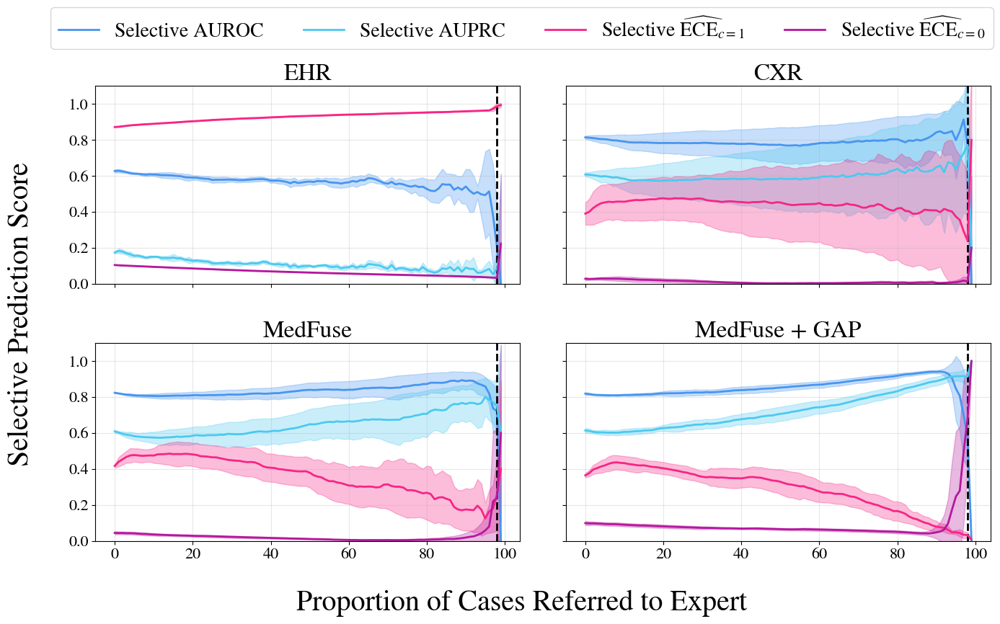

In [32]:
label = 7
rows, cols = 2,2

w_sub = 7   # width per subplot
h_sub = 4   # height per subplot

fig_width = cols * w_sub
fig_height = rows * h_sub

fig, axs = plt.subplots(rows, cols, figsize=(fig_width, fig_height), sharex=True, sharey=True)
fig.tight_layout(rect=(0.025,0.025,1,0.95))


# fig.suptitle(f"Condition {label+1}: {label_titles[label]}", fontsize=30, y=1)
fig.supxlabel("Proportion of Cases Referred to Expert", y=-0.025)
fig.supylabel("Selective Prediction Score", x=-0.01)

model_i = 0

metric_colors_special = {
    "sel_auroc": "#4895EF",
    "sel_auprc": "#4CC9F0",
    "positive_ece": "#F72585",
    "negative_ece": "#B5179E"
}
axs = axs.flatten()  # Flatten 5x5 array into 1D so we can loop easily
for ax in axs:
    # Row 1
    ax.grid(alpha=0.3)
    ax.set_title(f"{model_titles[model_i]}")
    
    mean_auroc = miscalibration_auroc[:, model_i, :, :].mean(axis=0)[label, :]
    std_auroc = miscalibration_auroc[:, model_i, :, :].std(axis=0)[label, :]
    failure_threshold_auroc = int(miscalibration_auroc_failure[:, model_i, :].max(axis=0)[label])
    
    ax.plot(range(100), mean_auroc, label=f"AUROC: {mean_auroc.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['sel_auroc']}")
    ax.fill_between(range(100), mean_auroc - std_auroc, mean_auroc + std_auroc, alpha=0.3, color=f"{metric_colors_special['sel_auroc']}")
    ax.axvline(failure_threshold_auroc, linewidth=2, color="black", linestyle='dashed')

    mean_auprc = miscalibration_auprc[:, model_i, :, :].mean(axis=0)[label, :]
    std_auprc = miscalibration_auprc[:, model_i, :, :].std(axis=0)[label, :]
    ax.plot(range(100), mean_auprc, label=f"AUPRC: {mean_auprc.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['sel_auprc']}")
    ax.fill_between(range(100), mean_auprc - std_auprc, mean_auprc + std_auprc, alpha=0.3, color=f"{metric_colors_special['sel_auprc']}")


    # Row 2

    mean_pos_ece = miscalibration_pos_ece[:, model_i, :, :].mean(axis=0)[label, :]
    std_pos_ece = miscalibration_pos_ece[:, model_i, :, :].std(axis=0)[label, :]
    ax.plot(range(100), mean_pos_ece, label=f"Positive ECE: {mean_pos_ece.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['positive_ece']}")
    ax.fill_between(range(100), mean_pos_ece - std_pos_ece, mean_pos_ece + std_pos_ece, alpha=0.3, color=f"{metric_colors_special['positive_ece']}")


    mean_neg_ece = miscalibration_neg_ece[:, model_i, :, :].mean(axis=0)[label, :]
    std_neg_ece = miscalibration_neg_ece[:, model_i, :, :].std(axis=0)[label, :]
    ax.plot(range(100), mean_neg_ece, label=f"Negative ECE: {mean_neg_ece.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['negative_ece']}")
    ax.fill_between(range(100), mean_neg_ece - std_neg_ece, mean_neg_ece + std_neg_ece, alpha=0.3, color=f"{metric_colors_special['negative_ece']}")


    handles, labels = ax.get_legend_handles_labels()

    model_i += 1

fig.legend(
    handles, ["Selective AUROC", "Selective AUPRC", "Selective $\\widehat{\\mathrm{ECE}}_{c=1}$", "Selective $\\widehat{\\mathrm{ECE}}_{c=0}$"],
    loc="upper center",           # position the legend
    bbox_to_anchor=(0.5, 1.05),   # center above all subplots
    fontsize=20,                  # legend text size
    ncol=4,                       # number of columns (adjust as needed)
)

plt.ylim([0, 1.1])
fig.subplots_adjust(hspace=0.3)  # Add vertical space for legends
# fig.subplots_adjust(wspace=0.6)  # Add vertical space for legends
if save_figures:
    plt.savefig("figures/label_8_comparison.pdf", format="pdf", bbox_inches="tight")
plt.show()

### Label 25 Shock

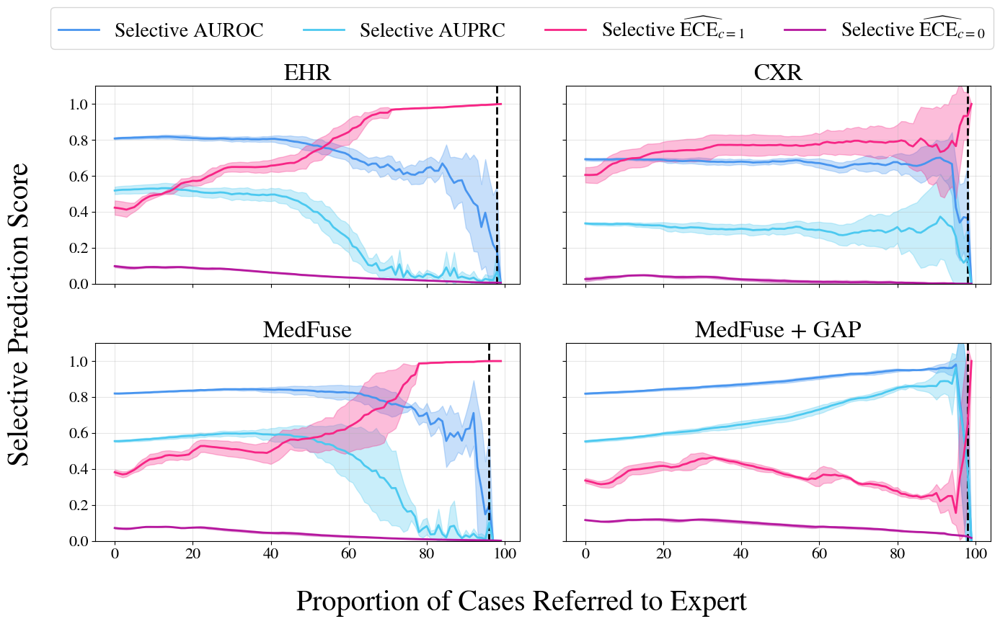

In [33]:
label = 24
rows, cols = 2,2

w_sub = 7   # width per subplot
h_sub = 4   # height per subplot

fig_width = cols * w_sub
fig_height = rows * h_sub

fig, axs = plt.subplots(rows, cols, figsize=(fig_width, fig_height), sharex=True, sharey=True)
fig.tight_layout(rect=(0.025,0.025,1,0.95))


# fig.suptitle(f"Condition {label+1}: {label_titles[label]}", fontsize=30, y=1)
fig.supxlabel("Proportion of Cases Referred to Expert", y=-0.025)
fig.supylabel("Selective Prediction Score", x=-0.01)

model_i = 0

metric_colors_special = {
    "sel_auroc": "#4895EF",
    "sel_auprc": "#4CC9F0",
    "positive_ece": "#F72585",
    "negative_ece": "#B5179E"
}
axs = axs.flatten()  # Flatten 5x5 array into 1D so we can loop easily
for ax in axs:
    # Row 1
    ax.grid(alpha=0.3)
    ax.set_title(f"{model_titles[model_i]}")
    
    mean_auroc = miscalibration_auroc[:, model_i, :, :].mean(axis=0)[label, :]
    std_auroc = miscalibration_auroc[:, model_i, :, :].std(axis=0)[label, :]
    failure_threshold_auroc = int(miscalibration_auroc_failure[:, model_i, :].max(axis=0)[label])
    
    ax.plot(range(100), mean_auroc, label=f"AUROC: {mean_auroc.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['sel_auroc']}")
    ax.fill_between(range(100), mean_auroc - std_auroc, mean_auroc + std_auroc, alpha=0.3, color=f"{metric_colors_special['sel_auroc']}")
    ax.axvline(failure_threshold_auroc, linewidth=2, color="black", linestyle='dashed')

    mean_auprc = miscalibration_auprc[:, model_i, :, :].mean(axis=0)[label, :]
    std_auprc = miscalibration_auprc[:, model_i, :, :].std(axis=0)[label, :]
    ax.plot(range(100), mean_auprc, label=f"AUPRC: {mean_auprc.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['sel_auprc']}")
    ax.fill_between(range(100), mean_auprc - std_auprc, mean_auprc + std_auprc, alpha=0.3, color=f"{metric_colors_special['sel_auprc']}")


    # Row 2

    mean_pos_ece = miscalibration_pos_ece[:, model_i, :, :].mean(axis=0)[label, :]
    std_pos_ece = miscalibration_pos_ece[:, model_i, :, :].std(axis=0)[label, :]
    ax.plot(range(100), mean_pos_ece, label=f"Positive ECE: {mean_pos_ece.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['positive_ece']}")
    ax.fill_between(range(100), mean_pos_ece - std_pos_ece, mean_pos_ece + std_pos_ece, alpha=0.3, color=f"{metric_colors_special['positive_ece']}")


    mean_neg_ece = miscalibration_neg_ece[:, model_i, :, :].mean(axis=0)[label, :]
    std_neg_ece = miscalibration_neg_ece[:, model_i, :, :].std(axis=0)[label, :]
    ax.plot(range(100), mean_neg_ece, label=f"Negative ECE: {mean_neg_ece.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['negative_ece']}")
    ax.fill_between(range(100), mean_neg_ece - std_neg_ece, mean_neg_ece + std_neg_ece, alpha=0.3, color=f"{metric_colors_special['negative_ece']}")


    handles, labels = ax.get_legend_handles_labels()

    model_i += 1

fig.legend(
    handles, ["Selective AUROC", "Selective AUPRC", "Selective $\\widehat{\\mathrm{ECE}}_{c=1}$", "Selective $\\widehat{\\mathrm{ECE}}_{c=0}$"],
    loc="upper center",           # position the legend
    bbox_to_anchor=(0.5, 1.05),   # center above all subplots
    fontsize=20,                  # legend text size
    ncol=4,                       # number of columns (adjust as needed)
)

plt.ylim([0, 1.1])
fig.subplots_adjust(hspace=0.3)  # Add vertical space for legends
# fig.subplots_adjust(wspace=0.6)  # Add vertical space for legends
if save_figures:
    plt.savefig("figures/label_25_comparison.pdf", format="pdf", bbox_inches="tight")
plt.show()

# Linear Regression: ECE vs AUC

## Unimodal CXR

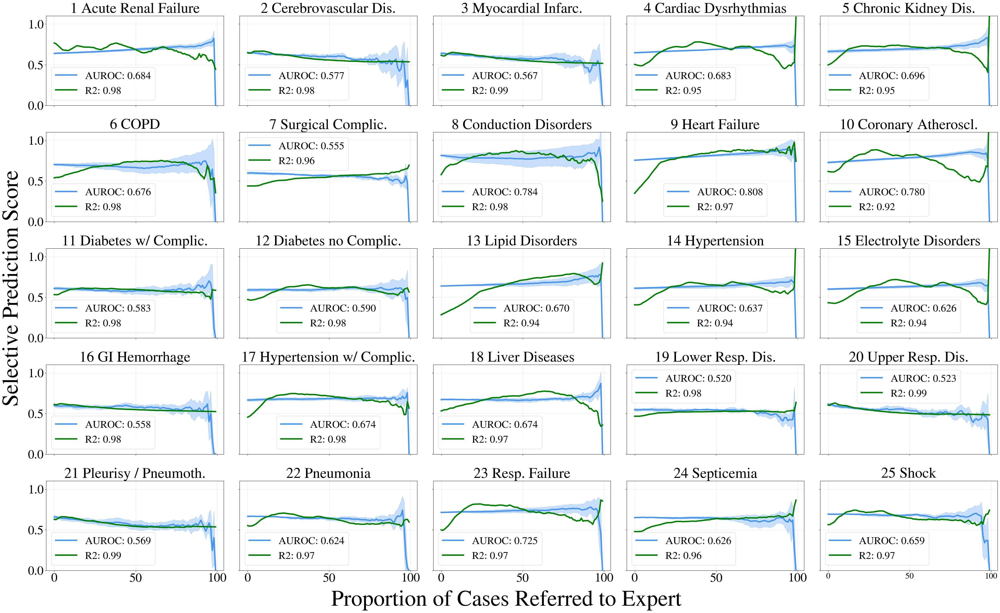

In [34]:
model_i = models.index("unimodal_cxr")

rows, cols = 5,5
fig, axs = plt.subplots(rows, cols, figsize=(40, 25), sharex=True, sharey=True)
fig.tight_layout(rect=(0.025, 0.025, 1, 0.95))

axs = axs.flatten()  # Flatten 5x5 array into 1D so we can loop easily

fig.supxlabel("Proportion of Cases Referred to Expert", y=-0.0125, fontsize=64)
fig.supylabel("Selective Prediction Score",  fontsize=64, x=0)

metric_colors_special = {
    "sel_auroc": "#4895EF",
    "sel_auprc": "#4CC9F0",
    "positive_ece": "#F72585",
    "negative_ece": "#B5179E"
}

label = 0
for ax in axs:
    ax.set_title(f"{label+1} {short_titles[label]}", fontsize=42)


    mean_auroc = miscalibration_auroc[:, model_i, :, :].mean(axis=0)[label, :]
    std_auroc = miscalibration_auroc[:, model_i, :, :].std(axis=0)[label, :]
    ax.plot(range(100), mean_auroc, label=f"AUROC: {mean_auroc.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['sel_auroc']}")
    ax.fill_between(range(100), mean_auroc - std_auroc, mean_auroc + std_auroc, alpha=0.3, color=f"{metric_colors_special['sel_auroc']}")
    
    mean_pos_ece = miscalibration_pos_ece[:, model_i, :, :].mean(axis=0)[label, :]
    std_pos_ece = miscalibration_pos_ece[:, model_i, :, :].std(axis=0)[label, :]

    mean_neg_ece = miscalibration_neg_ece[:, model_i, :, :].mean(axis=0)[label, :]
    std_neg_ece = miscalibration_neg_ece[:, model_i, :, :].std(axis=0)[label, :]


    # Reshape predictors (X) to 2D: [pos_ece, neg_ece]
    X = np.column_stack([mean_pos_ece, mean_neg_ece])
    
    # Dependent variable: AUROC
    y = mean_auroc
    
    # Fit linear regression
    model = sm.OLS(y, X).fit()
    r2 = model.rsquared
    
    ax.plot(range(100), model.predict(X), "g", label=f"R2: {r2:0.2f}")
    

    # Get handles/labels only for this subplot
    handles, labels_legend = ax.get_legend_handles_labels()
    
    for h in handles:
        h.set_linewidth(4)
    
    ax.legend(
        handles, labels_legend,
        loc="best",
        fontsize=30,
        ncol=1
    )

    ax.grid(which='major', axis='both', alpha=0.3)
    ax.tick_params(axis='y', labelsize=36)
    ax.tick_params(axis='x', labelsize=36)
    label += 1

plt.ylim([0, 1.1])
plt.tick_params(axis='x', labelsize=24)
fig.subplots_adjust(hspace=0.3)  # Add vertical space for legends


if save_figures:
    plt.savefig("figures/regression_auroc_ece_cxr.pdf", bbox_inches="tight")
plt.show()

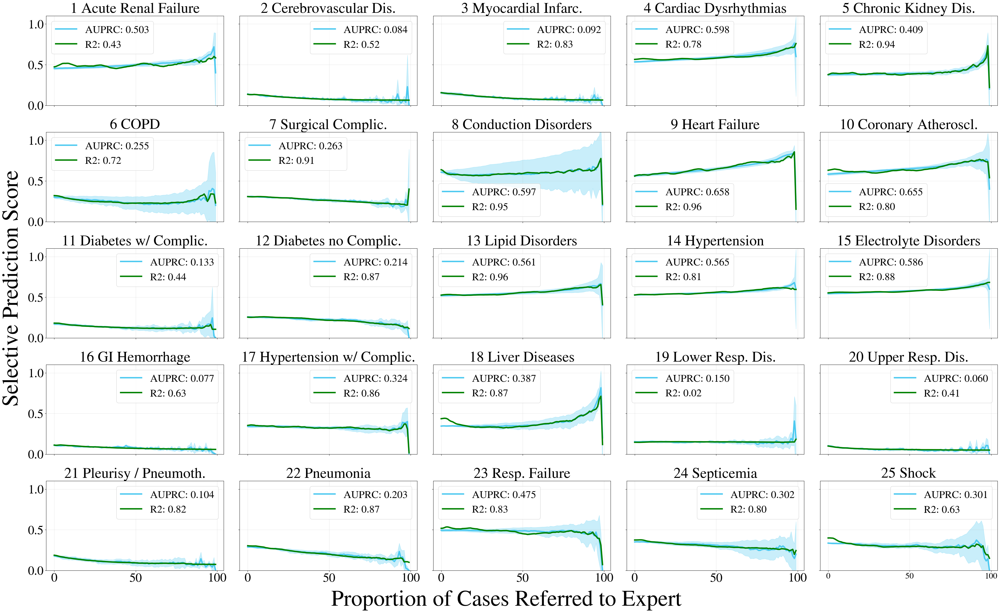

In [35]:
model_i = models.index("unimodal_cxr")

rows, cols = 5,5
fig, axs = plt.subplots(rows, cols, figsize=(40, 25), sharex=True, sharey=True)
fig.tight_layout(rect=(0.025, 0.025, 1, 0.95))

axs = axs.flatten()  # Flatten 5x5 array into 1D so we can loop easily

fig.supxlabel("Proportion of Cases Referred to Expert", y=-0.0125, fontsize=64)
fig.supylabel("Selective Prediction Score",  fontsize=64, x=0)


metric_colors_special = {
    "sel_auroc": "#4895EF",
    "sel_auprc": "#4CC9F0",
    "positive_ece": "#F72585",
    "negative_ece": "#B5179E"
}

label = 0
for ax in axs:
    ax.set_title(f"{label+1} {short_titles[label]}", fontsize=42)

    mean_auprc = miscalibration_auprc[:, model_i, :, :].mean(axis=0)[label, :]
    std_auprc = miscalibration_auprc[:, model_i, :, :].std(axis=0)[label, :]
    ax.plot(range(100), mean_auprc, label=f"AUPRC: {mean_auprc.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['sel_auprc']}")
    ax.fill_between(range(100), mean_auprc - std_auprc, mean_auprc + std_auprc, alpha=0.3, color=f"{metric_colors_special['sel_auprc']}")
    
    mean_pos_ece = miscalibration_pos_ece[:, model_i, :, :].mean(axis=0)[label, :]
    std_pos_ece = miscalibration_pos_ece[:, model_i, :, :].std(axis=0)[label, :]

    mean_neg_ece = miscalibration_neg_ece[:, model_i, :, :].mean(axis=0)[label, :]
    std_neg_ece = miscalibration_neg_ece[:, model_i, :, :].std(axis=0)[label, :]


    # Reshape predictors (X) to 2D: [pos_ece, neg_ece]
    X = np.column_stack([mean_pos_ece, mean_neg_ece])
    X = sm.add_constant(X)
    
    # Dependent variable: AUPRC
    y = mean_auprc

    # Fit linear regression
    model = sm.OLS(y, X).fit()  

    ax.plot(range(100), model.predict(X), "g", label=f"R2: {model.rsquared:0.2f}")

    # Get handles/labels only for this subplot
    handles, labels_legend = ax.get_legend_handles_labels()
    
    for h in handles:
        h.set_linewidth(4)
    
    ax.legend(
        handles, labels_legend,
        loc="best",
        fontsize=30,
        ncol=1
    )

    ax.grid(which='major', axis='both', alpha=0.3)
    ax.tick_params(axis='y', labelsize=36)
    ax.tick_params(axis='x', labelsize=36)
    label += 1

plt.ylim([0, 1.1])
plt.tick_params(axis='x', labelsize=24)
fig.subplots_adjust(hspace=0.3)  # Add vertical space for legends


if save_figures:
    plt.savefig("figures/regression_auprc_ece_cxr.pdf", bbox_inches="tight")
plt.show()

In [36]:
model_i = models.index("unimodal_cxr")

count_neg_sig_pos = 0   # slope for pos ECE < 0 and p < 0.05
count_neg_sig_neg = 0   # slope for neg ECE < 0 and p < 0.05
count_neg_sig_either = 0
r2_list = []

for label in range(25):
    mean_auroc   = miscalibration_auroc[:, model_i, :, :].mean(axis=0)[label, :]   # y (per threshold)
    mean_pos_ece = miscalibration_pos_ece[:, model_i, :, :].mean(axis=0)[label, :]
    mean_neg_ece = miscalibration_neg_ece[:, model_i, :, :].mean(axis=0)[label, :]

    # Design matrix: [const, pos_ECE, neg_ECE]
    X = np.column_stack([mean_pos_ece, mean_neg_ece])
    X = sm.add_constant(X)

    model = sm.OLS(mean_auroc, X).fit()
    r2 = model.rsquared
    r2_list.append(r2)

    # Coeffs (order: const, pos, neg)
    b0, b_pos, b_neg = model.params
    p_pos, p_neg = model.pvalues[1], model.pvalues[2]

    # 95% CIs (optional but handy)
    ci = model.conf_int(alpha=0.05)  # shape: (3, 2) -> rows = [const, pos, neg]

    ci_pos_low, ci_pos_high = ci[1, 0], ci[1, 1]
    ci_neg_low, ci_neg_high = ci[2, 0], ci[2, 1]

    # Flags
    pos_neg_sig = (b_pos < 0) and (p_pos < 0.05)
    neg_neg_sig = (b_neg < 0) and (p_neg < 0.05)
    either_neg_sig = pos_neg_sig or neg_neg_sig

    count_neg_sig_pos += int(pos_neg_sig)
    count_neg_sig_neg += int(neg_neg_sig)
    count_neg_sig_either += int(either_neg_sig)

    print(f"*** Label {label+1:02d} {label_titles[label]} ***")
    print(f"R²={r2:.3f}")
    print(f"  pos_ECE: slope={b_pos:+.4f}, p={p_pos:.3e}, CI95=({ci_pos_low:+.4f}, {ci_pos_high:+.4f})"
          f"  -> {'NEG+SIG' if pos_neg_sig else ''}")
    print(f"  neg_ECE: slope={b_neg:+.4f}, p={p_neg:.3e}, CI95=({ci_neg_low:+.4f}, {ci_neg_high:+.4f})"
          f"  -> {'NEG+SIG' if neg_neg_sig else ''}")
    print()

print("===")
print(f"Mean R² across labels: {np.mean(r2_list):.3f}")
print(f"NEGATIVE & SIGNIFICANT (p<0.05) counts:")
print(f"  pos_ECE: {count_neg_sig_pos}/25")
print(f"  neg_ECE: {count_neg_sig_neg}/25")
print(f"  either (pos or neg): {count_neg_sig_either}/25")


*** Label 01 Acute and unspecified renal failure ***
R²=0.178
  pos_ECE: slope=-0.3411, p=2.672e-01, CI95=(-0.9478, +0.2655)  -> 
  neg_ECE: slope=-0.4301, p=1.835e-01, CI95=(-1.0674, +0.2072)  -> 

*** Label 02 Acute cerebrovascular disease ***
R²=0.259
  pos_ECE: slope=+0.3177, p=6.330e-01, CI95=(-0.9983, +1.6336)  -> 
  neg_ECE: slope=+4.2283, p=3.667e-02, CI95=(+0.2673, +8.1894)  -> 

*** Label 03 Acute myocardial infarction ***
R²=0.318
  pos_ECE: slope=+0.4786, p=2.729e-01, CI95=(-0.3829, +1.3400)  -> 
  neg_ECE: slope=+3.9555, p=2.923e-03, CI95=(+1.3841, +6.5268)  -> 

*** Label 04 Cardiac dysrhythmias ***
R²=0.222
  pos_ECE: slope=-0.4360, p=9.296e-05, CI95=(-0.6482, -0.2238)  -> NEG+SIG
  neg_ECE: slope=-0.3007, p=3.371e-05, CI95=(-0.4378, -0.1635)  -> NEG+SIG

*** Label 05 Chronic kidney disease ***
R²=0.532
  pos_ECE: slope=-0.8796, p=7.034e-11, CI95=(-1.1179, -0.6414)  -> NEG+SIG
  neg_ECE: slope=-0.0135, p=9.769e-01, CI95=(-0.9399, +0.9129)  -> 

*** Label 06 Chronic obstr

In [37]:
model_i = models.index("unimodal_cxr")
# AUPRC
count_neg_sig_pos = 0   # slope for pos ECE < 0 and p < 0.05
count_neg_sig_neg = 0   # slope for neg ECE < 0 and p < 0.05
count_neg_sig_either = 0
r2_list = []

for label in range(25):
    mean_auprc   = miscalibration_auprc[:, model_i, :, :].mean(axis=0)[label, :]   # y (per threshold)
    mean_pos_ece = miscalibration_pos_ece[:, model_i, :, :].mean(axis=0)[label, :]
    mean_neg_ece = miscalibration_neg_ece[:, model_i, :, :].mean(axis=0)[label, :]

    # Design matrix: [const, pos_ECE, neg_ECE]
    X = np.column_stack([mean_pos_ece, mean_neg_ece])
    X = sm.add_constant(X)

    model = sm.OLS(mean_auprc, X).fit()
    r2 = model.rsquared
    r2_list.append(r2)

    # Coeffs (order: const, pos, neg)
    b0, b_pos, b_neg = model.params
    p_pos, p_neg = model.pvalues[1], model.pvalues[2]

    # 95% CIs (optional but handy)
    ci = model.conf_int(alpha=0.05)  # shape: (3, 2) -> rows = [const, pos, neg]

    ci_pos_low, ci_pos_high = ci[1, 0], ci[1, 1]
    ci_neg_low, ci_neg_high = ci[2, 0], ci[2, 1]

    # Flags
    pos_neg_sig = (b_pos < 0) and (p_pos < 0.05)
    neg_neg_sig = (b_neg < 0) and (p_neg < 0.05)
    either_neg_sig = pos_neg_sig or neg_neg_sig

    count_neg_sig_pos += int(pos_neg_sig)
    count_neg_sig_neg += int(neg_neg_sig)
    count_neg_sig_either += int(either_neg_sig)

    print(f"*** Label {label+1:02d} {label_titles[label]} ***")
    print(f"R²={r2:.3f}")
    print(f"  pos_ECE: slope={b_pos:+.4f}, p={p_pos:.3e}, CI95=({ci_pos_low:+.4f}, {ci_pos_high:+.4f})"
          f"  -> {'NEG+SIG' if pos_neg_sig else ''}")
    print(f"  neg_ECE: slope={b_neg:+.4f}, p={p_neg:.3e}, CI95=({ci_neg_low:+.4f}, {ci_neg_high:+.4f})"
          f"  -> {'NEG+SIG' if neg_neg_sig else ''}")
    print()

print("===")
print(f"Mean R² across labels: {np.mean(r2_list):.3f}")
print(f"NEGATIVE & SIGNIFICANT (p<0.05) counts:")
print(f"  pos_ECE: {count_neg_sig_pos}/25")
print(f"  neg_ECE: {count_neg_sig_neg}/25")
print(f"  either (pos or neg): {count_neg_sig_either}/25")


*** Label 01 Acute and unspecified renal failure ***
R²=0.425
  pos_ECE: slope=-1.3027, p=2.669e-13, CI95=(-1.6080, -0.9974)  -> NEG+SIG
  neg_ECE: slope=+1.1914, p=5.591e-11, CI95=(+0.8708, +1.5121)  -> 

*** Label 02 Acute cerebrovascular disease ***
R²=0.520
  pos_ECE: slope=-0.0503, p=7.931e-01, CI95=(-0.4294, +0.3289)  -> 
  neg_ECE: slope=+1.5386, p=8.751e-03, CI95=(+0.3974, +2.6798)  -> 

*** Label 03 Acute myocardial infarction ***
R²=0.830
  pos_ECE: slope=-0.2093, p=1.326e-02, CI95=(-0.3740, -0.0447)  -> NEG+SIG
  neg_ECE: slope=+1.0176, p=8.315e-05, CI95=(+0.5261, +1.5092)  -> 

*** Label 04 Cardiac dysrhythmias ***
R²=0.783
  pos_ECE: slope=-0.3531, p=2.579e-15, CI95=(-0.4276, -0.2786)  -> NEG+SIG
  neg_ECE: slope=+0.3104, p=1.551e-22, CI95=(+0.2623, +0.3586)  -> 

*** Label 05 Chronic kidney disease ***
R²=0.945
  pos_ECE: slope=-1.0801, p=1.610e-58, CI95=(-1.1388, -1.0215)  -> NEG+SIG
  neg_ECE: slope=+1.5532, p=4.860e-24, CI95=(+1.3252, +1.7813)  -> 

*** Label 06 Chroni

## Unimodal EHR

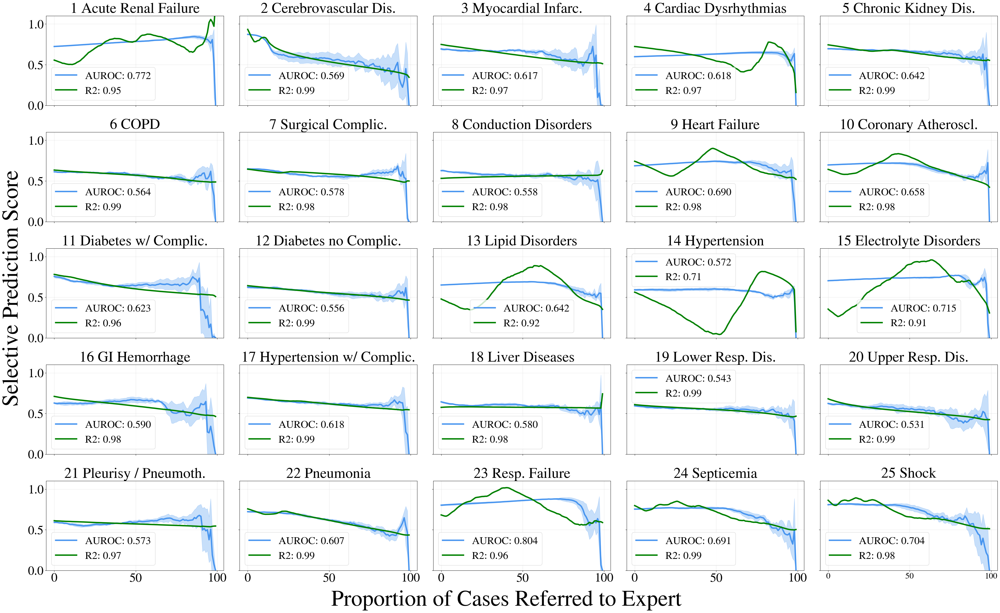

In [38]:
model_i = models.index("unimodal_ehr")

rows, cols = 5,5
fig, axs = plt.subplots(rows, cols, figsize=(40, 25), sharex=True, sharey=True)
fig.tight_layout(rect=(0.025, 0.025, 1, 0.95))

axs = axs.flatten()  # Flatten 5x5 array into 1D so we can loop easily

fig.supxlabel("Proportion of Cases Referred to Expert", y=-0.0125, fontsize=64)
fig.supylabel("Selective Prediction Score",  fontsize=64, x=0)

metric_colors_special = {
    "sel_auroc": "#4895EF",
    "sel_auprc": "#4CC9F0",
    "positive_ece": "#F72585",
    "negative_ece": "#B5179E"
}

label = 0
for ax in axs:
    ax.set_title(f"{label+1} {short_titles[label]}", fontsize=42)


    mean_auroc = miscalibration_auroc[:, model_i, :, :].mean(axis=0)[label, :]
    std_auroc = miscalibration_auroc[:, model_i, :, :].std(axis=0)[label, :]
    ax.plot(range(100), mean_auroc, label=f"AUROC: {mean_auroc.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['sel_auroc']}")
    ax.fill_between(range(100), mean_auroc - std_auroc, mean_auroc + std_auroc, alpha=0.3, color=f"{metric_colors_special['sel_auroc']}")
    
    mean_pos_ece = miscalibration_pos_ece[:, model_i, :, :].mean(axis=0)[label, :]
    std_pos_ece = miscalibration_pos_ece[:, model_i, :, :].std(axis=0)[label, :]

    mean_neg_ece = miscalibration_neg_ece[:, model_i, :, :].mean(axis=0)[label, :]
    std_neg_ece = miscalibration_neg_ece[:, model_i, :, :].std(axis=0)[label, :]


    # Reshape predictors (X) to 2D: [pos_ece, neg_ece]
    X = np.column_stack([mean_pos_ece, mean_neg_ece])
    
    # Dependent variable: AUROC
    y = mean_auroc
    
    # Fit linear regression
    model = sm.OLS(y, X).fit()
    r2 = model.rsquared
    
    ax.plot(range(100), model.predict(X), "g", label=f"R2: {r2:0.2f}")
    

    # Get handles/labels only for this subplot
    handles, labels_legend = ax.get_legend_handles_labels()
    
    for h in handles:
        h.set_linewidth(4)
    
    ax.legend(
        handles, labels_legend,
        loc="best",
        fontsize=30,
        ncol=1
    )

    ax.grid(which='major', axis='both', alpha=0.3)
    ax.tick_params(axis='y', labelsize=36)
    ax.tick_params(axis='x', labelsize=36)
    label += 1

plt.ylim([0, 1.1])
plt.tick_params(axis='x', labelsize=24)
fig.subplots_adjust(hspace=0.3)  # Add vertical space for legends


if save_figures:
    plt.savefig("figures/regression_auroc_ece_ehr.pdf", bbox_inches="tight")
plt.show()

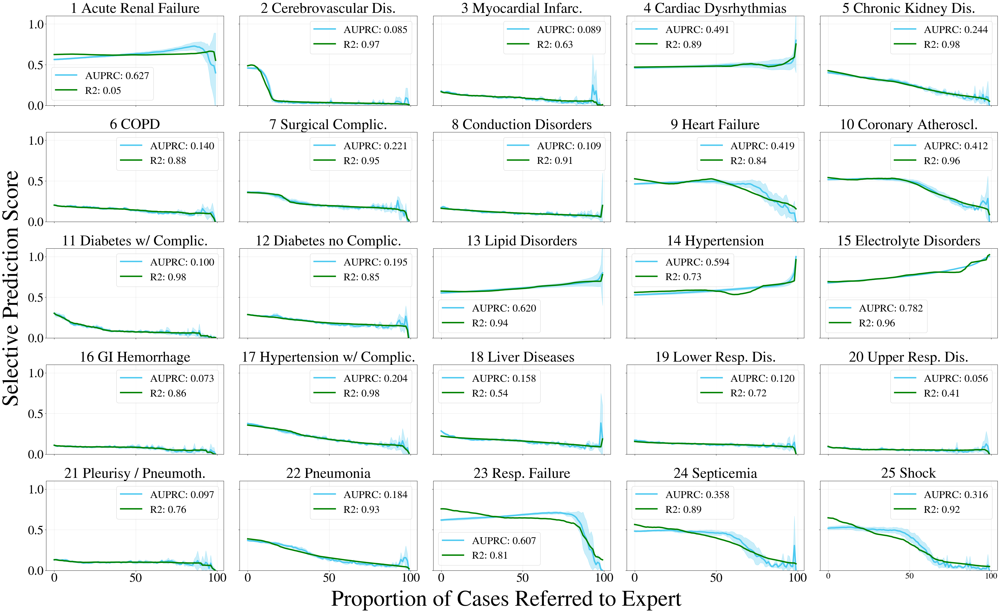

In [39]:
model_i = models.index("unimodal_ehr")

rows, cols = 5,5
fig, axs = plt.subplots(rows, cols, figsize=(40, 25), sharex=True, sharey=True)
fig.tight_layout(rect=(0.025, 0.025, 1, 0.95))

axs = axs.flatten()  # Flatten 5x5 array into 1D so we can loop easily

fig.supxlabel("Proportion of Cases Referred to Expert", y=-0.0125, fontsize=64)
fig.supylabel("Selective Prediction Score",  fontsize=64, x=0)


metric_colors_special = {
    "sel_auroc": "#4895EF",
    "sel_auprc": "#4CC9F0",
    "positive_ece": "#F72585",
    "negative_ece": "#B5179E"
}

label = 0
for ax in axs:
    ax.set_title(f"{label+1} {short_titles[label]}", fontsize=42)

    mean_auprc = miscalibration_auprc[:, model_i, :, :].mean(axis=0)[label, :]
    std_auprc = miscalibration_auprc[:, model_i, :, :].std(axis=0)[label, :]
    ax.plot(range(100), mean_auprc, label=f"AUPRC: {mean_auprc.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['sel_auprc']}")
    ax.fill_between(range(100), mean_auprc - std_auprc, mean_auprc + std_auprc, alpha=0.3, color=f"{metric_colors_special['sel_auprc']}")
    
    mean_pos_ece = miscalibration_pos_ece[:, model_i, :, :].mean(axis=0)[label, :]
    std_pos_ece = miscalibration_pos_ece[:, model_i, :, :].std(axis=0)[label, :]

    mean_neg_ece = miscalibration_neg_ece[:, model_i, :, :].mean(axis=0)[label, :]
    std_neg_ece = miscalibration_neg_ece[:, model_i, :, :].std(axis=0)[label, :]


    # Reshape predictors (X) to 2D: [pos_ece, neg_ece]
    X = np.column_stack([mean_pos_ece, mean_neg_ece])
    X = sm.add_constant(X)
    
    # Dependent variable: AUPRC
    y = mean_auprc

    # Fit linear regression
    model = sm.OLS(y, X).fit()  

    ax.plot(range(100), model.predict(X), "g", label=f"R2: {model.rsquared:0.2f}")

    # Get handles/labels only for this subplot
    handles, labels_legend = ax.get_legend_handles_labels()
    
    for h in handles:
        h.set_linewidth(4)
    
    ax.legend(
        handles, labels_legend,
        loc="best",
        fontsize=30,
        ncol=1
    )

    ax.grid(which='major', axis='both', alpha=0.3)
    ax.tick_params(axis='y', labelsize=36)
    ax.tick_params(axis='x', labelsize=36)
    label += 1

plt.ylim([0, 1.1])
plt.tick_params(axis='x', labelsize=24)
fig.subplots_adjust(hspace=0.3)  # Add vertical space for legends

if save_figures:
    plt.savefig("figures/regression_auprc_ece_ehr.pdf", bbox_inches="tight")
plt.show()

In [40]:
model_i = models.index("unimodal_ehr")

count_neg_sig_pos = 0   # slope for pos ECE < 0 and p < 0.05
count_neg_sig_neg = 0   # slope for neg ECE < 0 and p < 0.05
count_neg_sig_either = 0
r2_list = []

for label in range(25):
    mean_auroc   = miscalibration_auroc[:, model_i, :, :].mean(axis=0)[label, :]   # y (per threshold)
    mean_pos_ece = miscalibration_pos_ece[:, model_i, :, :].mean(axis=0)[label, :]
    mean_neg_ece = miscalibration_neg_ece[:, model_i, :, :].mean(axis=0)[label, :]

    # Design matrix: [const, pos_ECE, neg_ECE]
    X = np.column_stack([mean_pos_ece, mean_neg_ece])
    X = sm.add_constant(X)

    model = sm.OLS(mean_auroc, X).fit()
    r2 = model.rsquared
    r2_list.append(r2)

    # Coeffs (order: const, pos, neg)
    b0, b_pos, b_neg = model.params
    p_pos, p_neg = model.pvalues[1], model.pvalues[2]

    # 95% CIs (optional but handy)
    ci = model.conf_int(alpha=0.05)  # shape: (3, 2) -> rows = [const, pos, neg]

    ci_pos_low, ci_pos_high = ci[1, 0], ci[1, 1]
    ci_neg_low, ci_neg_high = ci[2, 0], ci[2, 1]

    # Flags
    pos_neg_sig = (b_pos < 0) and (p_pos < 0.05)
    neg_neg_sig = (b_neg < 0) and (p_neg < 0.05)
    either_neg_sig = pos_neg_sig or neg_neg_sig

    count_neg_sig_pos += int(pos_neg_sig)
    count_neg_sig_neg += int(neg_neg_sig)
    count_neg_sig_either += int(either_neg_sig)

    print(f"*** Label {label+1:02d} {label_titles[label]} ***")
    print(f"R²={r2:.3f}")
    print(f"  pos_ECE: slope={b_pos:+.4f}, p={p_pos:.3e}, CI95=({ci_pos_low:+.4f}, {ci_pos_high:+.4f})"
          f"  -> {'NEG+SIG' if pos_neg_sig else ''}")
    print(f"  neg_ECE: slope={b_neg:+.4f}, p={p_neg:.3e}, CI95=({ci_neg_low:+.4f}, {ci_neg_high:+.4f})"
          f"  -> {'NEG+SIG' if neg_neg_sig else ''}")
    print()

print("===")
print(f"Mean R² across labels: {np.mean(r2_list):.3f}")
print(f"NEGATIVE & SIGNIFICANT (p<0.05) counts:")
print(f"  pos_ECE: {count_neg_sig_pos}/25")
print(f"  neg_ECE: {count_neg_sig_neg}/25")
print(f"  either (pos or neg): {count_neg_sig_either}/25")


*** Label 01 Acute and unspecified renal failure ***
R²=0.319
  pos_ECE: slope=+0.0125, p=8.892e-01, CI95=(-0.1656, +0.1906)  -> 
  neg_ECE: slope=-1.1767, p=2.006e-09, CI95=(-1.5295, -0.8238)  -> NEG+SIG

*** Label 02 Acute cerebrovascular disease ***
R²=0.842
  pos_ECE: slope=+0.0381, p=6.110e-01, CI95=(-0.1100, +0.1861)  -> 
  neg_ECE: slope=+14.8222, p=7.260e-22, CI95=(+12.4629, +17.1815)  -> 

*** Label 03 Acute myocardial infarction ***
R²=0.829
  pos_ECE: slope=-43.2654, p=6.803e-31, CI95=(-48.3094, -38.2214)  -> NEG+SIG
  neg_ECE: slope=-62.0776, p=3.553e-29, CI95=(-69.7240, -54.4312)  -> NEG+SIG

*** Label 04 Cardiac dysrhythmias ***
R²=0.602
  pos_ECE: slope=+0.3434, p=1.684e-05, CI95=(+0.1930, +0.4939)  -> 
  neg_ECE: slope=-0.6393, p=6.642e-20, CI95=(-0.7493, -0.5294)  -> NEG+SIG

*** Label 05 Chronic kidney disease ***
R²=0.361
  pos_ECE: slope=-0.3587, p=3.828e-01, CI95=(-1.1708, +0.4533)  -> 
  neg_ECE: slope=+0.5065, p=6.148e-01, CI95=(-1.4845, +2.4975)  -> 

*** Label 

In [41]:
model_i = models.index("unimodal_ehr")
# AUPRC
count_neg_sig_pos = 0   # slope for pos ECE < 0 and p < 0.05
count_neg_sig_neg = 0   # slope for neg ECE < 0 and p < 0.05
count_neg_sig_either = 0
r2_list = []

for label in range(25):
    mean_auprc   = miscalibration_auprc[:, model_i, :, :].mean(axis=0)[label, :]   # y (per threshold)
    mean_pos_ece = miscalibration_pos_ece[:, model_i, :, :].mean(axis=0)[label, :]
    mean_neg_ece = miscalibration_neg_ece[:, model_i, :, :].mean(axis=0)[label, :]

    # Design matrix: [const, pos_ECE, neg_ECE]
    X = np.column_stack([mean_pos_ece, mean_neg_ece])
    X = sm.add_constant(X)

    model = sm.OLS(mean_auprc, X).fit()
    r2 = model.rsquared
    r2_list.append(r2)

    # Coeffs (order: const, pos, neg)
    b0, b_pos, b_neg = model.params
    p_pos, p_neg = model.pvalues[1], model.pvalues[2]

    # 95% CIs (optional but handy)
    ci = model.conf_int(alpha=0.05)  # shape: (3, 2) -> rows = [const, pos, neg]

    ci_pos_low, ci_pos_high = ci[1, 0], ci[1, 1]
    ci_neg_low, ci_neg_high = ci[2, 0], ci[2, 1]

    # Flags
    pos_neg_sig = (b_pos < 0) and (p_pos < 0.05)
    neg_neg_sig = (b_neg < 0) and (p_neg < 0.05)
    either_neg_sig = pos_neg_sig or neg_neg_sig

    count_neg_sig_pos += int(pos_neg_sig)
    count_neg_sig_neg += int(neg_neg_sig)
    count_neg_sig_either += int(either_neg_sig)

    print(f"*** Label {label+1:02d} {label_titles[label]} ***")
    print(f"R²={r2:.3f}")
    print(f"  pos_ECE: slope={b_pos:+.4f}, p={p_pos:.3e}, CI95=({ci_pos_low:+.4f}, {ci_pos_high:+.4f})"
          f"  -> {'NEG+SIG' if pos_neg_sig else ''}")
    print(f"  neg_ECE: slope={b_neg:+.4f}, p={p_neg:.3e}, CI95=({ci_neg_low:+.4f}, {ci_neg_high:+.4f})"
          f"  -> {'NEG+SIG' if neg_neg_sig else ''}")
    print()

print("===")
print(f"Mean R² across labels: {np.mean(r2_list):.3f}")
print(f"NEGATIVE & SIGNIFICANT (p<0.05) counts:")
print(f"  pos_ECE: {count_neg_sig_pos}/25")
print(f"  neg_ECE: {count_neg_sig_neg}/25")
print(f"  either (pos or neg): {count_neg_sig_either}/25")


*** Label 01 Acute and unspecified renal failure ***
R²=0.052
  pos_ECE: slope=+0.0479, p=4.810e-01, CI95=(-0.0864, +0.1821)  -> 
  neg_ECE: slope=-0.3068, p=2.429e-02, CI95=(-0.5728, -0.0407)  -> NEG+SIG

*** Label 02 Acute cerebrovascular disease ***
R²=0.969
  pos_ECE: slope=-0.8479, p=7.346e-48, CI95=(-0.9087, -0.7872)  -> NEG+SIG
  neg_ECE: slope=+0.9066, p=6.613e-02, CI95=(-0.0616, +1.8749)  -> 

*** Label 03 Acute myocardial infarction ***
R²=0.625
  pos_ECE: slope=-4.2410, p=2.421e-03, CI95=(-6.9433, -1.5387)  -> NEG+SIG
  neg_ECE: slope=-4.7493, p=2.353e-02, CI95=(-8.8459, -0.6527)  -> NEG+SIG

*** Label 04 Cardiac dysrhythmias ***
R²=0.893
  pos_ECE: slope=-0.3976, p=7.234e-33, CI95=(-0.4412, -0.3540)  -> NEG+SIG
  neg_ECE: slope=+0.4573, p=6.339e-49, CI95=(+0.4254, +0.4891)  -> 

*** Label 05 Chronic kidney disease ***
R²=0.978
  pos_ECE: slope=-0.0449, p=6.293e-01, CI95=(-0.2287, +0.1390)  -> 
  neg_ECE: slope=+2.6355, p=4.835e-20, CI95=(+2.1847, +3.0862)  -> 

*** Label 06

## MedFuse

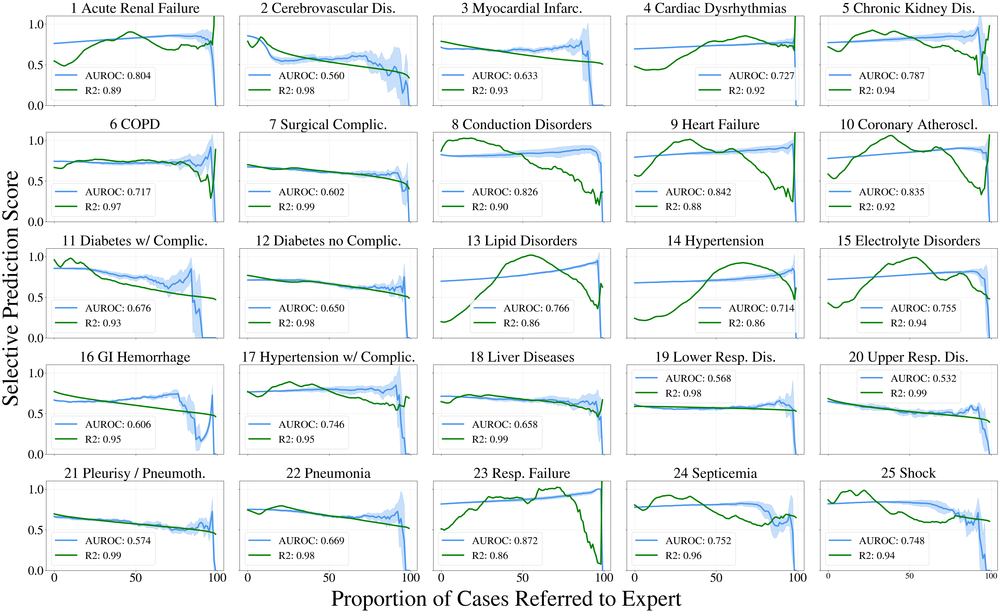

In [42]:
model_i = models.index("medfuse")

rows, cols = 5,5
fig, axs = plt.subplots(rows, cols, figsize=(40, 25), sharex=True, sharey=True)
fig.tight_layout(rect=(0.025, 0.025, 1, 0.95))

axs = axs.flatten()  # Flatten 5x5 array into 1D so we can loop easily

fig.supxlabel("Proportion of Cases Referred to Expert", y=-0.0125, fontsize=64)
fig.supylabel("Selective Prediction Score",  fontsize=64, x=0)

metric_colors_special = {
    "sel_auroc": "#4895EF",
    "sel_auprc": "#4CC9F0",
    "positive_ece": "#F72585",
    "negative_ece": "#B5179E"
}

label = 0
for ax in axs:
    ax.set_title(f"{label+1} {short_titles[label]}", fontsize=42)


    mean_auroc = miscalibration_auroc[:, model_i, :, :].mean(axis=0)[label, :]
    std_auroc = miscalibration_auroc[:, model_i, :, :].std(axis=0)[label, :]
    ax.plot(range(100), mean_auroc, label=f"AUROC: {mean_auroc.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['sel_auroc']}")
    ax.fill_between(range(100), mean_auroc - std_auroc, mean_auroc + std_auroc, alpha=0.3, color=f"{metric_colors_special['sel_auroc']}")
    
    mean_pos_ece = miscalibration_pos_ece[:, model_i, :, :].mean(axis=0)[label, :]
    std_pos_ece = miscalibration_pos_ece[:, model_i, :, :].std(axis=0)[label, :]

    mean_neg_ece = miscalibration_neg_ece[:, model_i, :, :].mean(axis=0)[label, :]
    std_neg_ece = miscalibration_neg_ece[:, model_i, :, :].std(axis=0)[label, :]


    # Reshape predictors (X) to 2D: [pos_ece, neg_ece]
    X = np.column_stack([mean_pos_ece, mean_neg_ece])
    
    # Dependent variable: AUROC
    y = mean_auroc
    
    # Fit linear regression
    model = sm.OLS(y, X).fit()
    r2 = model.rsquared
    
    ax.plot(range(100), model.predict(X), "g", label=f"R2: {r2:0.2f}")
    

    # Get handles/labels only for this subplot
    handles, labels_legend = ax.get_legend_handles_labels()
    
    for h in handles:
        h.set_linewidth(4)
    
    ax.legend(
        handles, labels_legend,
        loc="best",
        fontsize=30,
        ncol=1
    )

    ax.grid(which='major', axis='both', alpha=0.3)
    ax.tick_params(axis='y', labelsize=36)
    ax.tick_params(axis='x', labelsize=36)
    label += 1

plt.ylim([0, 1.1])
plt.tick_params(axis='x', labelsize=24)
fig.subplots_adjust(hspace=0.3)  # Add vertical space for legends


if save_figures:
    plt.savefig("figures/regression_auroc_ece_det.pdf", bbox_inches="tight")
plt.show()

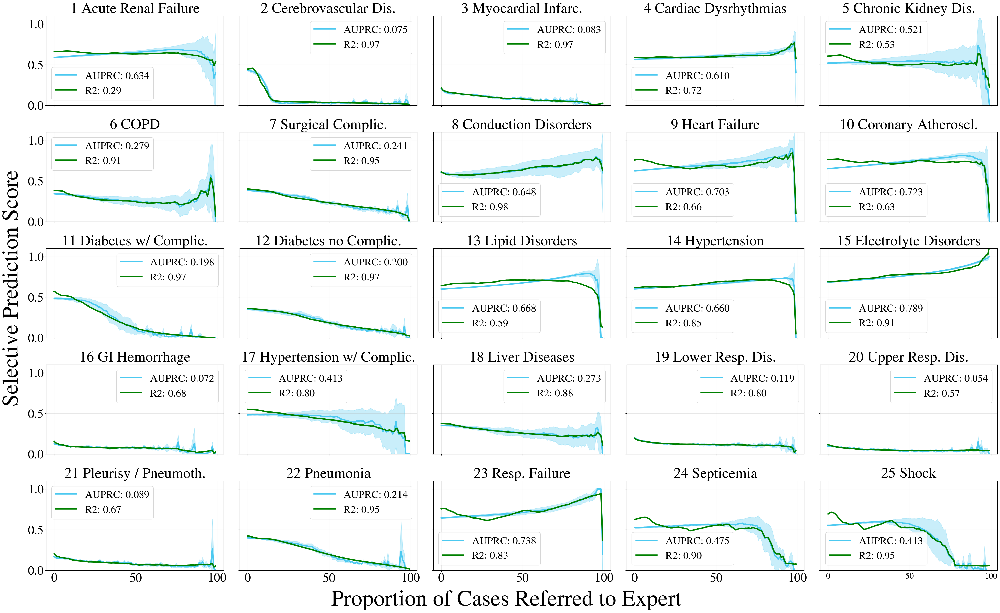

In [43]:
model_i = models.index("medfuse")

rows, cols = 5,5
fig, axs = plt.subplots(rows, cols, figsize=(40, 25), sharex=True, sharey=True)
fig.tight_layout(rect=(0.025, 0.025, 1, 0.95))

axs = axs.flatten()  # Flatten 5x5 array into 1D so we can loop easily

fig.supxlabel("Proportion of Cases Referred to Expert", y=-0.0125, fontsize=64)
fig.supylabel("Selective Prediction Score",  fontsize=64, x=0)


metric_colors_special = {
    "sel_auroc": "#4895EF",
    "sel_auprc": "#4CC9F0",
    "positive_ece": "#F72585",
    "negative_ece": "#B5179E"
}

label = 0
for ax in axs:
    ax.set_title(f"{label+1} {short_titles[label]}", fontsize=42)

    mean_auprc = miscalibration_auprc[:, model_i, :, :].mean(axis=0)[label, :]
    std_auprc = miscalibration_auprc[:, model_i, :, :].std(axis=0)[label, :]
    ax.plot(range(100), mean_auprc, label=f"AUPRC: {mean_auprc.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['sel_auprc']}")
    ax.fill_between(range(100), mean_auprc - std_auprc, mean_auprc + std_auprc, alpha=0.3, color=f"{metric_colors_special['sel_auprc']}")
    
    mean_pos_ece = miscalibration_pos_ece[:, model_i, :, :].mean(axis=0)[label, :]
    std_pos_ece = miscalibration_pos_ece[:, model_i, :, :].std(axis=0)[label, :]

    mean_neg_ece = miscalibration_neg_ece[:, model_i, :, :].mean(axis=0)[label, :]
    std_neg_ece = miscalibration_neg_ece[:, model_i, :, :].std(axis=0)[label, :]


    # Reshape predictors (X) to 2D: [pos_ece, neg_ece]
    X = np.column_stack([mean_pos_ece, mean_neg_ece])
    X = sm.add_constant(X)
    
    # Dependent variable: AUPRC
    y = mean_auprc

    # Fit linear regression
    model = sm.OLS(y, X).fit()  

    ax.plot(range(100), model.predict(X), "g", label=f"R2: {model.rsquared:0.2f}")

    # Get handles/labels only for this subplot
    handles, labels_legend = ax.get_legend_handles_labels()
    
    for h in handles:
        h.set_linewidth(4)
    
    ax.legend(
        handles, labels_legend,
        loc="best",
        fontsize=30,
        ncol=1
    )

    ax.grid(which='major', axis='both', alpha=0.3)
    ax.tick_params(axis='y', labelsize=36)
    ax.tick_params(axis='x', labelsize=36)
    label += 1

plt.ylim([0, 1.1])
plt.tick_params(axis='x', labelsize=24)
fig.subplots_adjust(hspace=0.3)  # Add vertical space for legends


if save_figures:
    plt.savefig("figures/regression_auprc_ece_det.pdf", bbox_inches="tight")
plt.show()


In [44]:
model_i = models.index("medfuse")

count_neg_sig_pos = 0   # slope for pos ECE < 0 and p < 0.05
count_neg_sig_neg = 0   # slope for neg ECE < 0 and p < 0.05
count_neg_sig_either = 0
r2_list = []

for label in range(25):
    mean_auroc   = miscalibration_auroc[:, model_i, :, :].mean(axis=0)[label, :]   # y (per threshold)
    mean_pos_ece = miscalibration_pos_ece[:, model_i, :, :].mean(axis=0)[label, :]
    mean_neg_ece = miscalibration_neg_ece[:, model_i, :, :].mean(axis=0)[label, :]

    # Design matrix: [const, pos_ECE, neg_ECE]
    X = np.column_stack([mean_pos_ece, mean_neg_ece])
    X = sm.add_constant(X)

    model = sm.OLS(mean_auroc, X).fit()
    r2 = model.rsquared
    r2_list.append(r2)

    # Coeffs (order: const, pos, neg)
    b0, b_pos, b_neg = model.params
    p_pos, p_neg = model.pvalues[1], model.pvalues[2]

    # 95% CIs (optional but handy)
    ci = model.conf_int(alpha=0.05)  # shape: (3, 2) -> rows = [const, pos, neg]

    ci_pos_low, ci_pos_high = ci[1, 0], ci[1, 1]
    ci_neg_low, ci_neg_high = ci[2, 0], ci[2, 1]

    # Flags
    pos_neg_sig = (b_pos < 0) and (p_pos < 0.05)
    neg_neg_sig = (b_neg < 0) and (p_neg < 0.05)
    either_neg_sig = pos_neg_sig or neg_neg_sig

    count_neg_sig_pos += int(pos_neg_sig)
    count_neg_sig_neg += int(neg_neg_sig)
    count_neg_sig_either += int(either_neg_sig)

    print(f"*** Label {label+1:02d} {label_titles[label]} ***")
    print(f"R²={r2:.3f}")
    print(f"  pos_ECE: slope={b_pos:+.4f}, p={p_pos:.3e}, CI95=({ci_pos_low:+.4f}, {ci_pos_high:+.4f})"
          f"  -> {'NEG+SIG' if pos_neg_sig else ''}")
    print(f"  neg_ECE: slope={b_neg:+.4f}, p={p_neg:.3e}, CI95=({ci_neg_low:+.4f}, {ci_neg_high:+.4f})"
          f"  -> {'NEG+SIG' if neg_neg_sig else ''}")
    print()

print("===")
print(f"Mean R² across labels: {np.mean(r2_list):.3f}")
print(f"NEGATIVE & SIGNIFICANT (p<0.05) counts:")
print(f"  pos_ECE: {count_neg_sig_pos}/25")
print(f"  neg_ECE: {count_neg_sig_neg}/25")
print(f"  either (pos or neg): {count_neg_sig_either}/25")


*** Label 01 Acute and unspecified renal failure ***
R²=0.430
  pos_ECE: slope=-0.6417, p=7.710e-10, CI95=(-0.8283, -0.4550)  -> NEG+SIG
  neg_ECE: slope=-0.2238, p=3.041e-01, CI95=(-0.6537, +0.2062)  -> 

*** Label 02 Acute cerebrovascular disease ***
R²=0.664
  pos_ECE: slope=-0.1418, p=1.839e-01, CI95=(-0.3520, +0.0685)  -> 
  neg_ECE: slope=+11.5889, p=2.437e-10, CI95=(+8.3339, +14.8438)  -> 

*** Label 03 Acute myocardial infarction ***
R²=0.313
  pos_ECE: slope=-30.6236, p=3.001e-05, CI95=(-44.5001, -16.7472)  -> NEG+SIG
  neg_ECE: slope=-43.9222, p=1.064e-04, CI95=(-65.4913, -22.3530)  -> NEG+SIG

*** Label 04 Cardiac dysrhythmias ***
R²=0.202
  pos_ECE: slope=-0.7507, p=5.294e-06, CI95=(-1.0598, -0.4417)  -> NEG+SIG
  neg_ECE: slope=+0.8854, p=6.237e-04, CI95=(+0.3885, +1.3823)  -> 

*** Label 05 Chronic kidney disease ***
R²=0.347
  pos_ECE: slope=-0.8158, p=1.418e-08, CI95=(-1.0773, -0.5544)  -> NEG+SIG
  neg_ECE: slope=+0.4746, p=1.482e-01, CI95=(-0.1717, +1.1209)  -> 

*** 

In [45]:
model_i = models.index("medfuse")
# AUPRC
count_neg_sig_pos = 0   # slope for pos ECE < 0 and p < 0.05
count_neg_sig_neg = 0   # slope for neg ECE < 0 and p < 0.05
count_neg_sig_either = 0
r2_list = []

for label in range(25):
    mean_auprc   = miscalibration_auprc[:, model_i, :, :].mean(axis=0)[label, :]   # y (per threshold)
    mean_pos_ece = miscalibration_pos_ece[:, model_i, :, :].mean(axis=0)[label, :]
    mean_neg_ece = miscalibration_neg_ece[:, model_i, :, :].mean(axis=0)[label, :]

    # Design matrix: [const, pos_ECE, neg_ECE]
    X = np.column_stack([mean_pos_ece, mean_neg_ece])
    X = sm.add_constant(X)

    model = sm.OLS(mean_auprc, X).fit()
    r2 = model.rsquared
    r2_list.append(r2)

    # Coeffs (order: const, pos, neg)
    b0, b_pos, b_neg = model.params
    p_pos, p_neg = model.pvalues[1], model.pvalues[2]

    # 95% CIs (optional but handy)
    ci = model.conf_int(alpha=0.05)  # shape: (3, 2) -> rows = [const, pos, neg]

    ci_pos_low, ci_pos_high = ci[1, 0], ci[1, 1]
    ci_neg_low, ci_neg_high = ci[2, 0], ci[2, 1]

    # Flags
    pos_neg_sig = (b_pos < 0) and (p_pos < 0.05)
    neg_neg_sig = (b_neg < 0) and (p_neg < 0.05)
    either_neg_sig = pos_neg_sig or neg_neg_sig

    count_neg_sig_pos += int(pos_neg_sig)
    count_neg_sig_neg += int(neg_neg_sig)
    count_neg_sig_either += int(either_neg_sig)

    print(f"*** Label {label+1:02d} {label_titles[label]} ***")
    print(f"R²={r2:.3f}")
    print(f"  pos_ECE: slope={b_pos:+.4f}, p={p_pos:.3e}, CI95=({ci_pos_low:+.4f}, {ci_pos_high:+.4f})"
          f"  -> {'NEG+SIG' if pos_neg_sig else ''}")
    print(f"  neg_ECE: slope={b_neg:+.4f}, p={p_neg:.3e}, CI95=({ci_neg_low:+.4f}, {ci_neg_high:+.4f})"
          f"  -> {'NEG+SIG' if neg_neg_sig else ''}")
    print()

print("===")
print(f"Mean R² across labels: {np.mean(r2_list):.3f}")
print(f"NEGATIVE & SIGNIFICANT (p<0.05) counts:")
print(f"  pos_ECE: {count_neg_sig_pos}/25")
print(f"  neg_ECE: {count_neg_sig_neg}/25")
print(f"  either (pos or neg): {count_neg_sig_either}/25")


*** Label 01 Acute and unspecified renal failure ***
R²=0.295
  pos_ECE: slope=-0.3580, p=6.664e-09, CI95=(-0.4697, -0.2463)  -> NEG+SIG
  neg_ECE: slope=+0.4564, p=6.590e-04, CI95=(+0.1991, +0.7138)  -> 

*** Label 02 Acute cerebrovascular disease ***
R²=0.970
  pos_ECE: slope=-0.8016, p=2.786e-52, CI95=(-0.8527, -0.7505)  -> NEG+SIG
  neg_ECE: slope=+1.1016, p=6.860e-03, CI95=(+0.3102, +1.8930)  -> 

*** Label 03 Acute myocardial infarction ***
R²=0.966
  pos_ECE: slope=-3.5509, p=3.869e-15, CI95=(-4.3067, -2.7950)  -> NEG+SIG
  neg_ECE: slope=-3.5050, p=4.844e-08, CI95=(-4.6799, -2.3302)  -> NEG+SIG

*** Label 04 Cardiac dysrhythmias ***
R²=0.716
  pos_ECE: slope=-0.6978, p=1.286e-23, CI95=(-0.8019, -0.5938)  -> NEG+SIG
  neg_ECE: slope=+1.3190, p=2.724e-28, CI95=(+1.1518, +1.4863)  -> 

*** Label 05 Chronic kidney disease ***
R²=0.533
  pos_ECE: slope=-0.6175, p=9.982e-16, CI95=(-0.7452, -0.4898)  -> NEG+SIG
  neg_ECE: slope=+0.1659, p=2.994e-01, CI95=(-0.1498, +0.4817)  -> 

*** L

## MedCertAIn + GAP

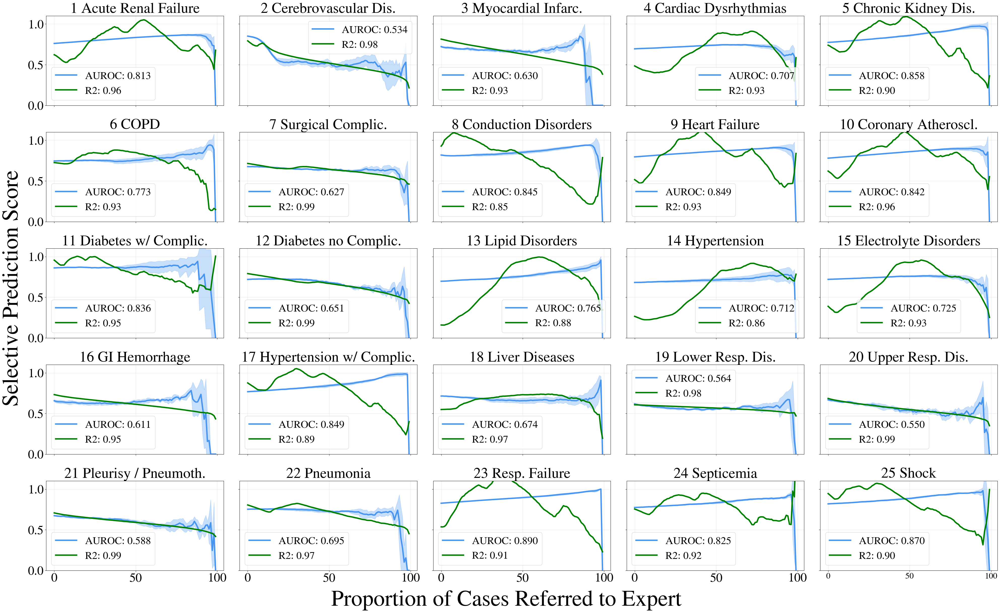

In [46]:
model_i = models.index("medfuse_gap")

rows, cols = 5,5
fig, axs = plt.subplots(rows, cols, figsize=(40, 25), sharex=True, sharey=True)
fig.tight_layout(rect=(0.025, 0.025, 1, 0.95))

axs = axs.flatten()  # Flatten 5x5 array into 1D so we can loop easily

fig.supxlabel("Proportion of Cases Referred to Expert", y=-0.0125, fontsize=64)
fig.supylabel("Selective Prediction Score",  fontsize=64, x=0)

metric_colors_special = {
    "sel_auroc": "#4895EF",
    "sel_auprc": "#4CC9F0",
    "positive_ece": "#F72585",
    "negative_ece": "#B5179E"
}

label = 0
for ax in axs:
    ax.set_title(f"{label+1} {short_titles[label]}", fontsize=42)


    mean_auroc = miscalibration_auroc[:, model_i, :, :].mean(axis=0)[label, :]
    std_auroc = miscalibration_auroc[:, model_i, :, :].std(axis=0)[label, :]
    ax.plot(range(100), mean_auroc, label=f"AUROC: {mean_auroc.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['sel_auroc']}")
    ax.fill_between(range(100), mean_auroc - std_auroc, mean_auroc + std_auroc, alpha=0.3, color=f"{metric_colors_special['sel_auroc']}")
    
    mean_pos_ece = miscalibration_pos_ece[:, model_i, :, :].mean(axis=0)[label, :]
    std_pos_ece = miscalibration_pos_ece[:, model_i, :, :].std(axis=0)[label, :]

    mean_neg_ece = miscalibration_neg_ece[:, model_i, :, :].mean(axis=0)[label, :]
    std_neg_ece = miscalibration_neg_ece[:, model_i, :, :].std(axis=0)[label, :]


    # Reshape predictors (X) to 2D: [pos_ece, neg_ece]
    X = np.column_stack([mean_pos_ece, mean_neg_ece])
    
    # Dependent variable: AUROC
    y = mean_auroc
    
    # Fit linear regression
    model = sm.OLS(y, X).fit()
    r2 = model.rsquared
    
    ax.plot(range(100), model.predict(X), "g", label=f"R2: {r2:0.2f}")
    

    # Get handles/labels only for this subplot
    handles, labels_legend = ax.get_legend_handles_labels()
    
    for h in handles:
        h.set_linewidth(4)
    
    ax.legend(
        handles, labels_legend,
        loc="best",
        fontsize=30,
        ncol=1
    )

    ax.grid(which='major', axis='both', alpha=0.3)
    ax.tick_params(axis='y', labelsize=36)
    ax.tick_params(axis='x', labelsize=36)
    label += 1

plt.ylim([0, 1.1])
plt.tick_params(axis='x', labelsize=24)
fig.subplots_adjust(hspace=0.3)  # Add vertical space for legends


if save_figures:
    plt.savefig("figures/regression_auroc_ece_gap.pdf", bbox_inches="tight")
plt.show()


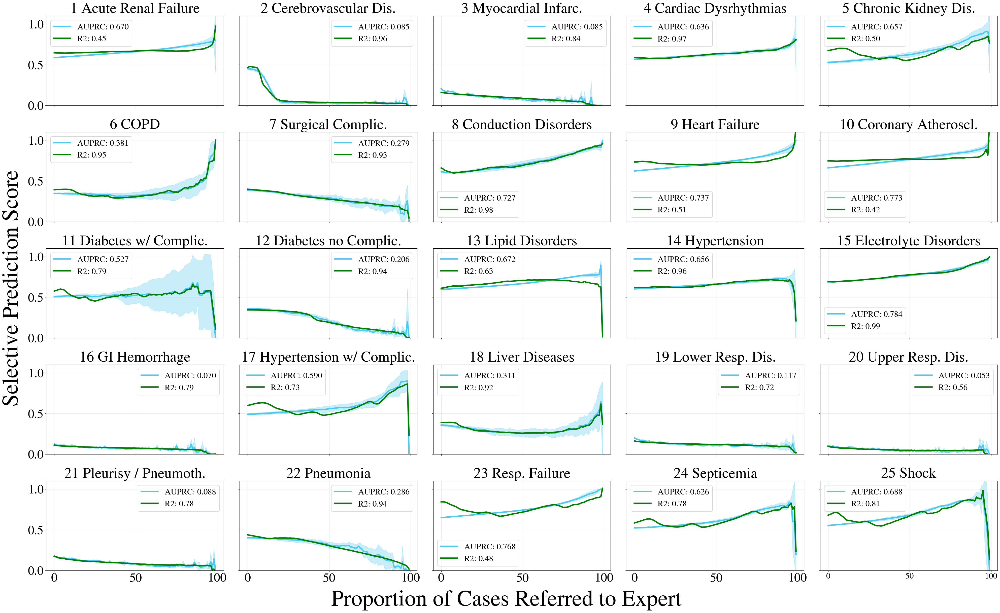

In [47]:
model_i = models.index("medfuse_gap")

rows, cols = 5,5
fig, axs = plt.subplots(rows, cols, figsize=(40, 25), sharex=True, sharey=True)
fig.tight_layout(rect=(0.025, 0.025, 1, 0.95))

axs = axs.flatten()  # Flatten 5x5 array into 1D so we can loop easily

fig.supxlabel("Proportion of Cases Referred to Expert", y=-0.0125, fontsize=64)
fig.supylabel("Selective Prediction Score",  fontsize=64, x=0)


metric_colors_special = {
    "sel_auroc": "#4895EF",
    "sel_auprc": "#4CC9F0",
    "positive_ece": "#F72585",
    "negative_ece": "#B5179E"
}

label = 0
for ax in axs:
    ax.set_title(f"{label+1} {short_titles[label]}", fontsize=42)

    mean_auprc = miscalibration_auprc[:, model_i, :, :].mean(axis=0)[label, :]
    std_auprc = miscalibration_auprc[:, model_i, :, :].std(axis=0)[label, :]
    ax.plot(range(100), mean_auprc, label=f"AUPRC: {mean_auprc.mean():0.3f}", linewidth=2, color=f"{metric_colors_special['sel_auprc']}")
    ax.fill_between(range(100), mean_auprc - std_auprc, mean_auprc + std_auprc, alpha=0.3, color=f"{metric_colors_special['sel_auprc']}")
    
    mean_pos_ece = miscalibration_pos_ece[:, model_i, :, :].mean(axis=0)[label, :]
    std_pos_ece = miscalibration_pos_ece[:, model_i, :, :].std(axis=0)[label, :]

    mean_neg_ece = miscalibration_neg_ece[:, model_i, :, :].mean(axis=0)[label, :]
    std_neg_ece = miscalibration_neg_ece[:, model_i, :, :].std(axis=0)[label, :]


    # Reshape predictors (X) to 2D: [pos_ece, neg_ece]
    X = np.column_stack([mean_pos_ece, mean_neg_ece])
    X = sm.add_constant(X)
    
    # Dependent variable: AUPRC
    y = mean_auprc

    # Fit linear regression
    model = sm.OLS(y, X).fit()  

    ax.plot(range(100), model.predict(X), "g", label=f"R2: {model.rsquared:0.2f}")

    # Get handles/labels only for this subplot
    handles, labels_legend = ax.get_legend_handles_labels()
    
    for h in handles:
        h.set_linewidth(4)
    
    ax.legend(
        handles, labels_legend,
        loc="best",
        fontsize=24,
        ncol=1
    )

    ax.grid(which='major', axis='both', alpha=0.3)
    ax.tick_params(axis='y', labelsize=36)
    ax.tick_params(axis='x', labelsize=36)
    label += 1

plt.ylim([0, 1.1])
plt.tick_params(axis='x', labelsize=24)
fig.subplots_adjust(hspace=0.3)  # Add vertical space for legends

if save_figures:
    plt.savefig("figures/regression_auprc_ece_gap.pdf", bbox_inches="tight")
plt.show()


In [48]:
model_i = models.index("medfuse_gap")

count_neg_sig_pos = 0   # slope for pos ECE < 0 and p < 0.05
count_neg_sig_neg = 0   # slope for neg ECE < 0 and p < 0.05
count_neg_sig_either = 0
r2_list = []

for label in range(25):
    mean_auroc   = miscalibration_auroc[:, model_i, :, :].mean(axis=0)[label, :]   # y (per threshold)
    mean_pos_ece = miscalibration_pos_ece[:, model_i, :, :].mean(axis=0)[label, :]
    mean_neg_ece = miscalibration_neg_ece[:, model_i, :, :].mean(axis=0)[label, :]

    # Design matrix: [const, pos_ECE, neg_ECE]
    X = np.column_stack([mean_pos_ece, mean_neg_ece])
    X = sm.add_constant(X)

    model = sm.OLS(mean_auroc, X).fit()
    r2 = model.rsquared
    r2_list.append(r2)

    # Coeffs (order: const, pos, neg)
    b0, b_pos, b_neg = model.params
    p_pos, p_neg = model.pvalues[1], model.pvalues[2]

    # 95% CIs (optional but handy)
    ci = model.conf_int(alpha=0.05)  # shape: (3, 2) -> rows = [const, pos, neg]

    ci_pos_low, ci_pos_high = ci[1, 0], ci[1, 1]
    ci_neg_low, ci_neg_high = ci[2, 0], ci[2, 1]

    # Flags
    pos_neg_sig = (b_pos < 0) and (p_pos < 0.05)
    neg_neg_sig = (b_neg < 0) and (p_neg < 0.05)
    either_neg_sig = pos_neg_sig or neg_neg_sig

    count_neg_sig_pos += int(pos_neg_sig)
    count_neg_sig_neg += int(neg_neg_sig)
    count_neg_sig_either += int(either_neg_sig)

    print(f"*** Label {label+1:02d} {label_titles[label]} ***")
    print(f"R²={r2:.3f}")
    print(f"  pos_ECE: slope={b_pos:+.4f}, p={p_pos:.3e}, CI95=({ci_pos_low:+.4f}, {ci_pos_high:+.4f})"
          f"  -> {'NEG+SIG' if pos_neg_sig else ''}")
    print(f"  neg_ECE: slope={b_neg:+.4f}, p={p_neg:.3e}, CI95=({ci_neg_low:+.4f}, {ci_neg_high:+.4f})"
          f"  -> {'NEG+SIG' if neg_neg_sig else ''}")
    print()

print("===")
print(f"Mean R² across labels: {np.mean(r2_list):.3f}")
print(f"NEGATIVE & SIGNIFICANT (p<0.05) counts:")
print(f"  pos_ECE: {count_neg_sig_pos}/25")
print(f"  neg_ECE: {count_neg_sig_neg}/25")
print(f"  either (pos or neg): {count_neg_sig_either}/25")


*** Label 01 Acute and unspecified renal failure ***
R²=0.510
  pos_ECE: slope=+0.3592, p=4.811e-03, CI95=(+0.1122, +0.6063)  -> 
  neg_ECE: slope=-0.6300, p=3.101e-16, CI95=(-0.7571, -0.5028)  -> NEG+SIG

*** Label 02 Acute cerebrovascular disease ***
R²=0.822
  pos_ECE: slope=-0.4557, p=2.105e-11, CI95=(-0.5751, -0.3363)  -> NEG+SIG
  neg_ECE: slope=+4.8053, p=5.598e-12, CI95=(+3.5903, +6.0204)  -> 

*** Label 03 Acute myocardial infarction ***
R²=0.913
  pos_ECE: slope=-15.0923, p=1.928e-46, CI95=(-16.2157, -13.9689)  -> NEG+SIG
  neg_ECE: slope=-21.3536, p=2.604e-39, CI95=(-23.2895, -19.4176)  -> NEG+SIG

*** Label 04 Cardiac dysrhythmias ***
R²=0.461
  pos_ECE: slope=+0.5286, p=2.760e-08, CI95=(+0.3551, +0.7021)  -> 
  neg_ECE: slope=-0.3746, p=4.780e-14, CI95=(-0.4589, -0.2902)  -> NEG+SIG

*** Label 05 Chronic kidney disease ***
R²=0.807
  pos_ECE: slope=-0.0357, p=5.117e-01, CI95=(-0.1435, +0.0720)  -> 
  neg_ECE: slope=-1.3129, p=4.816e-35, CI95=(-1.4477, -1.1781)  -> NEG+SIG


In [49]:
model_i = models.index("medfuse_gap")

# AUPRC
count_neg_sig_pos = 0   # slope for pos ECE < 0 and p < 0.05
count_neg_sig_neg = 0   # slope for neg ECE < 0 and p < 0.05
count_neg_sig_either = 0
r2_list = []

for label in range(25):
    mean_auprc   = miscalibration_auprc[:, model_i, :, :].mean(axis=0)[label, :]   # y (per threshold)
    mean_pos_ece = miscalibration_pos_ece[:, model_i, :, :].mean(axis=0)[label, :]
    mean_neg_ece = miscalibration_neg_ece[:, model_i, :, :].mean(axis=0)[label, :]

    # Design matrix: [const, pos_ECE, neg_ECE]
    X = np.column_stack([mean_pos_ece, mean_neg_ece])
    X = sm.add_constant(X)

    model = sm.OLS(mean_auprc, X).fit()
    r2 = model.rsquared
    r2_list.append(r2)

    # Coeffs (order: const, pos, neg)
    b0, b_pos, b_neg = model.params
    p_pos, p_neg = model.pvalues[1], model.pvalues[2]

    # 95% CIs (optional but handy)
    ci = model.conf_int(alpha=0.05)  # shape: (3, 2) -> rows = [const, pos, neg]

    ci_pos_low, ci_pos_high = ci[1, 0], ci[1, 1]
    ci_neg_low, ci_neg_high = ci[2, 0], ci[2, 1]

    # Flags
    pos_neg_sig = (b_pos < 0) and (p_pos < 0.05)
    neg_neg_sig = (b_neg < 0) and (p_neg < 0.05)
    either_neg_sig = pos_neg_sig or neg_neg_sig

    count_neg_sig_pos += int(pos_neg_sig)
    count_neg_sig_neg += int(neg_neg_sig)
    count_neg_sig_either += int(either_neg_sig)

    print(f"*** Label {label+1:02d} {label_titles[label]} ***")
    print(f"R²={r2:.3f}")
    print(f"  pos_ECE: slope={b_pos:+.4f}, p={p_pos:.3e}, CI95=({ci_pos_low:+.4f}, {ci_pos_high:+.4f})"
          f"  -> {'NEG+SIG' if pos_neg_sig else ''}")
    print(f"  neg_ECE: slope={b_neg:+.4f}, p={p_neg:.3e}, CI95=({ci_neg_low:+.4f}, {ci_neg_high:+.4f})"
          f"  -> {'NEG+SIG' if neg_neg_sig else ''}")
    print()

print("===")
print(f"Mean R² across labels: {np.mean(r2_list):.3f}")
print(f"NEGATIVE & SIGNIFICANT (p<0.05) counts:")
print(f"  pos_ECE: {count_neg_sig_pos}/25")
print(f"  neg_ECE: {count_neg_sig_neg}/25")
print(f"  either (pos or neg): {count_neg_sig_either}/25")


*** Label 01 Acute and unspecified renal failure ***
R²=0.448
  pos_ECE: slope=-0.0551, p=5.186e-01, CI95=(-0.2237, +0.1136)  -> 
  neg_ECE: slope=+0.3883, p=3.573e-14, CI95=(+0.3015, +0.4751)  -> 

*** Label 02 Acute cerebrovascular disease ***
R²=0.962
  pos_ECE: slope=-0.8986, p=2.809e-56, CI95=(-0.9503, -0.8470)  -> NEG+SIG
  neg_ECE: slope=-0.3215, p=2.280e-01, CI95=(-0.8475, +0.2045)  -> 

*** Label 03 Acute myocardial infarction ***
R²=0.837
  pos_ECE: slope=-0.5257, p=4.745e-03, CI95=(-0.8866, -0.1647)  -> NEG+SIG
  neg_ECE: slope=+0.7331, p=2.136e-02, CI95=(+0.1112, +1.3551)  -> 

*** Label 04 Cardiac dysrhythmias ***
R²=0.975
  pos_ECE: slope=+0.0062, p=6.203e-01, CI95=(-0.0185, +0.0309)  -> 
  neg_ECE: slope=+0.3284, p=1.981e-74, CI95=(+0.3164, +0.3404)  -> 

*** Label 05 Chronic kidney disease ***
R²=0.501
  pos_ECE: slope=-0.8677, p=6.573e-16, CI95=(-1.0456, -0.6898)  -> NEG+SIG
  neg_ECE: slope=+0.0585, p=6.031e-01, CI95=(-0.1641, +0.2811)  -> 

*** Label 06 Chronic obstr

# ________________________________________________________________________________________________________________________________________________________________________________________

# Tables: Evaluation Metrics (AUROC, AUPRC, Sel AUROC, Sel AUPRC)

## Unimodal CXR

In [50]:
df_dict = {
    "label": list(range(25))
}
selected_model = "unimodal_cxr"
model_i = models.index(selected_model)
print(f"Model idx {model_i} {models[model_i]}")

for seed in seeds:
    npz_data = np.load(f"{data_folder_inference_data}/{selected_model}_phenotyping_seed_{seed}.npz")
        
    preds = npz_data["preds"]
    targets = npz_data["targets"]
    auroc = roc_auc_score(targets, preds, average=None)
    auprc = average_precision_score(targets, preds, average=None)
    df_dict[f"auroc_seed_{seed}"] = auroc
    df_dict[f"auprc_seed_{seed}"] = auprc
    
df_unicxr_evals = pd.DataFrame.from_dict(df_dict)
seeds_list = ["seed_0", "seed_1", "seed_2", "seed_3", "seed_4"]

for seed in seeds:
    df_unicxr_evals[f"sel_auroc_seed_{seed}"] = miscalibration_auroc[seed, model_i, :, :].mean(axis=-1)
    df_unicxr_evals[f"sel_auprc_seed_{seed}"] = miscalibration_auprc[seed, model_i, :, :].mean(axis=-1)

df_unicxr_evals["auroc"] = df_unicxr_evals.apply(lambda x: x[["auroc_" + s for s in seeds_list]].mean(), axis=1)
df_unicxr_evals["auprc"] = df_unicxr_evals.apply(lambda x: x[["auprc_" + s for s in seeds_list]].mean(), axis=1)
df_unicxr_evals["sel_auroc"] = miscalibration_auroc[:, model_i, :, :].mean(axis=(0,2))
df_unicxr_evals["sel_auprc"] = miscalibration_auprc[:, model_i, :, :].mean(axis=(0,2))

df_unicxr_evals["auroc_std"] = df_unicxr_evals.apply(lambda x: x[["auroc_" + s for s in seeds_list]].std(), axis=1)
df_unicxr_evals["auprc_std"] = df_unicxr_evals.apply(lambda x: x[["auprc_" + s for s in seeds_list]].std(), axis=1)
df_unicxr_evals["sel_auroc_std"] = miscalibration_auroc[:, model_i, :, :].std(axis=(0,2))
df_unicxr_evals["sel_auprc_std"] = miscalibration_auprc[:, model_i, :, :].std(axis=(0,2))

# Calculate average for each column and append the row to the dataframe
average_row = df_unicxr_evals.mean(numeric_only=True).to_frame().T
average_row["label"] = "Average"
df_unicxr_evals = pd.concat([df_unicxr_evals, average_row], ignore_index=True)

df_unicxr_evals

Model idx 1 unimodal_cxr


,label,auroc_seed_0,auprc_seed_0,auroc_seed_1,auprc_seed_1,auroc_seed_2,auprc_seed_2,auroc_seed_3,auprc_seed_3,auroc_seed_4,...,sel_auroc_seed_4,sel_auprc_seed_4,auroc,auprc,sel_auroc,sel_auprc,auroc_std,auprc_std,sel_auroc_std,sel_auprc_std
0,0,0.640778,0.441807,0.649357,0.470858,0.642790,0.461782,0.625158,0.437833,0.635866,...,0.685061,0.501091,0.638790,0.453215,0.683592,0.502732,0.009027,0.013709,0.081361,0.074535
1,1,0.646617,0.146565,0.643407,0.124228,0.657046,0.139255,0.662334,0.140297,0.640962,...,0.574214,0.089745,0.650073,0.139387,0.577358,0.084380,0.009197,0.009139,0.120940,0.056583
2,2,0.629798,0.143307,0.660876,0.182593,0.647022,0.149210,0.623453,0.140886,0.640021,...,0.590982,0.093340,0.640234,0.153260,0.566994,0.091816,0.014686,0.016865,0.102058,0.037177
3,3,0.652565,0.547978,0.650179,0.540194,0.652571,0.539583,0.648232,0.528092,0.630796,...,0.669769,0.576894,0.646869,0.534326,0.683407,0.598299,0.009167,0.012561,0.076747,0.077265
4,4,0.642634,0.361835,0.675816,0.381062,0.684217,0.393888,0.637028,0.354731,0.670935,...,0.703022,0.416060,0.662126,0.377633,0.696462,0.408857,0.020993,0.018786,0.084872,0.077923
5,5,0.704866,0.306784,0.683973,0.289381,0.704987,0.278574,0.697287,0.308496,0.717735,...,0.780631,0.397509,0.701770,0.300582,0.676208,0.254660,0.012366,0.016397,0.130452,0.139186
6,6,0.604740,0.306149,0.587921,0.306492,0.615364,0.314774,0.576582,0.294227,0.602204,...,0.557538,0.272436,0.597362,0.307871,0.555118,0.262789,0.015189,0.009159,0.069198,0.066527
7,7,0.810151,0.604307,0.805197,0.608987,0.831904,0.624751,0.814507,0.612448,0.808915,...,0.706368,0.464601,0.814135,0.608017,0.784141,0.597229,0.010475,0.012785,0.130170,0.198332
8,8,0.750224,0.557710,0.746846,0.544166,0.767492,0.588702,0.757766,0.563033,0.752707,...,0.813168,0.661198,0.755007,0.565025,0.808186,0.657550,0.008035,0.016548,0.096949,0.099833
9,9,0.715355,0.572132,0.733446,0.586727,0.735840,0.595474,0.712627,0.557484,0.740294,...,0.794151,0.666612,0.727512,0.583119,0.780320,0.655106,0.012622,0.018509,0.094424,0.092907


## Unimodal EHR

In [51]:
df_dict = {
    "label": list(range(25))
}
selected_model = "unimodal_ehr"
model_i = models.index(selected_model)
print(f"Model idx {model_i} {models[model_i]}")

for seed in seeds:
    npz_data = np.load(f"{data_folder_inference_data}/{selected_model}_phenotyping_seed_{seed}.npz")
        
    preds = npz_data["preds"]
    targets = npz_data["targets"]
    auroc = roc_auc_score(targets, preds, average=None)
    auprc = average_precision_score(targets, preds, average=None)
    df_dict[f"auroc_seed_{seed}"] = auroc
    df_dict[f"auprc_seed_{seed}"] = auprc
    
df_uniehr_evals = pd.DataFrame.from_dict(df_dict)
seeds_list = ["seed_0", "seed_1", "seed_2", "seed_3", "seed_4"]

for seed in seeds:
    df_uniehr_evals[f"sel_auroc_seed_{seed}"] = miscalibration_auroc[seed, model_i, :, :].mean(axis=-1)
    df_uniehr_evals[f"sel_auprc_seed_{seed}"] = miscalibration_auprc[seed, model_i, :, :].mean(axis=-1)
    
df_uniehr_evals["auroc"] = df_uniehr_evals.apply(lambda x: x[["auroc_" + s for s in seeds_list]].mean(), axis=1)
df_uniehr_evals["auprc"] = df_uniehr_evals.apply(lambda x: x[["auprc_" + s for s in seeds_list]].mean(), axis=1)
df_uniehr_evals["sel_auroc"] = miscalibration_auroc[:, model_i, :, :].mean(axis=(0,2))
df_uniehr_evals["sel_auprc"] = miscalibration_auprc[:, model_i, :, :].mean(axis=(0,2))

df_uniehr_evals["auroc_std"] = df_uniehr_evals.apply(lambda x: x[["auroc_" + s for s in seeds_list]].std(), axis=1)
df_uniehr_evals["auprc_std"] = df_uniehr_evals.apply(lambda x: x[["auprc_" + s for s in seeds_list]].std(), axis=1)
df_uniehr_evals["sel_auroc_std"] = miscalibration_auroc[:, model_i, :, :].std(axis=(0,2))
df_uniehr_evals["sel_auprc_std"] = miscalibration_auprc[:, model_i, :, :].std(axis=(0,2))

# Calculate average for each column and append the row to the dataframe
average_row = df_uniehr_evals.mean(numeric_only=True).to_frame().T
average_row["label"] = "Average"
df_uniehr_evals = pd.concat([df_uniehr_evals, average_row], ignore_index=True)

df_uniehr_evals

Model idx 0 unimodal_ehr


,label,auroc_seed_0,auprc_seed_0,auroc_seed_1,auprc_seed_1,auroc_seed_2,auprc_seed_2,auroc_seed_3,auprc_seed_3,auroc_seed_4,...,sel_auroc_seed_4,sel_auprc_seed_4,auroc,auprc,sel_auroc,sel_auprc,auroc_std,auprc_std,sel_auroc_std,sel_auprc_std
0,0,0.727019,0.572285,0.721489,0.559942,0.724721,0.567117,0.724534,0.571403,0.720791,...,0.760886,0.570993,0.723711,0.563933,0.772302,0.627182,0.002555,0.009709,0.099908,0.100499
1,1,0.865251,0.459726,0.871700,0.475396,0.878049,0.452790,0.877181,0.457075,0.871122,...,0.560861,0.083890,0.872661,0.459134,0.569176,0.084651,0.005188,0.009756,0.179671,0.138244
2,2,0.700932,0.183287,0.676518,0.155714,0.682701,0.165978,0.697042,0.173550,0.709632,...,0.622041,0.087706,0.693365,0.174961,0.617458,0.089306,0.013536,0.015627,0.150411,0.069748
3,3,0.598906,0.468894,0.591162,0.440900,0.601026,0.462610,0.599031,0.465614,0.600181,...,0.632981,0.511375,0.598061,0.461772,0.618291,0.490675,0.003954,0.012084,0.069081,0.065265
4,4,0.698645,0.412937,0.690004,0.383869,0.692265,0.402488,0.705185,0.411759,0.693929,...,0.657792,0.242361,0.696006,0.401855,0.641741,0.243769,0.006032,0.011811,0.112824,0.113207
5,5,0.619255,0.212128,0.605334,0.194805,0.615742,0.210149,0.610681,0.200966,0.611436,...,0.575730,0.139616,0.612490,0.203302,0.564141,0.140123,0.005290,0.007515,0.088825,0.044706
6,6,0.649386,0.348506,0.657634,0.380278,0.638048,0.364171,0.651886,0.375191,0.649067,...,0.572805,0.219387,0.649204,0.365339,0.578374,0.221267,0.007120,0.012758,0.098367,0.083256
7,7,0.627277,0.172198,0.618319,0.165866,0.642141,0.184271,0.619336,0.168748,0.628777,...,0.551811,0.106376,0.627170,0.173845,0.558443,0.108512,0.009571,0.007408,0.097802,0.053853
8,8,0.686868,0.461226,0.679158,0.451092,0.688272,0.474677,0.683759,0.454142,0.693048,...,0.702513,0.437922,0.686221,0.463039,0.690333,0.418741,0.005176,0.010978,0.112740,0.128072
9,9,0.702836,0.527600,0.691736,0.513813,0.696294,0.509170,0.694401,0.510941,0.698777,...,0.677714,0.428339,0.696809,0.516835,0.657890,0.411579,0.004242,0.007943,0.096060,0.143741


## MedFuse

In [52]:
df_dict = {
    "label": list(range(25))
}
selected_model = "medfuse"
model_i = models.index(selected_model)
print(f"Model idx {model_i} {models[model_i]}")

for seed in seeds:
    npz_data = np.load(f"{data_folder_inference_data}/{selected_model}_phenotyping_seed_{seed}.npz")
        
    preds = npz_data["preds"]
    targets = npz_data["targets"]
    auroc = roc_auc_score(targets, preds, average=None)
    auprc = average_precision_score(targets, preds, average=None)
    df_dict[f"auroc_seed_{seed}"] = auroc
    df_dict[f"auprc_seed_{seed}"] = auprc
    
df_det_evals = pd.DataFrame.from_dict(df_dict)
seeds_list = ["seed_0", "seed_1", "seed_2", "seed_3", "seed_4"]

for seed in seeds:
    df_det_evals[f"sel_auroc_seed_{seed}"] = miscalibration_auroc[seed, model_i, :, :].mean(axis=-1)
    df_det_evals[f"sel_auprc_seed_{seed}"] = miscalibration_auprc[seed, model_i, :, :].mean(axis=-1)
    
df_det_evals["auroc"] = df_det_evals.apply(lambda x: x[["auroc_" + s for s in seeds_list]].mean(), axis=1)
df_det_evals["auprc"] = df_det_evals.apply(lambda x: x[["auprc_" + s for s in seeds_list]].mean(), axis=1)
df_det_evals["sel_auroc"] = miscalibration_auroc[:, model_i, :, :].mean(axis=(0,2))
df_det_evals["sel_auprc"] = miscalibration_auprc[:, model_i, :, :].mean(axis=(0,2))


df_det_evals["auroc_std"] = df_det_evals.apply(lambda x: x[["auroc_" + s for s in seeds_list]].std(), axis=1)
df_det_evals["auprc_std"] = df_det_evals.apply(lambda x: x[["auprc_" + s for s in seeds_list]].std(), axis=1)
df_det_evals["sel_auroc_std"] = miscalibration_auroc[:, model_i, :, :].std(axis=(0,2))
df_det_evals["sel_auprc_std"] = miscalibration_auprc[:, model_i, :, :].std(axis=(0,2))

# Calculate average for each column and append the row to the dataframe
average_row = df_det_evals.mean(numeric_only=True).to_frame().T
average_row["label"] = "Average"
df_det_evals = pd.concat([df_det_evals, average_row], ignore_index=True)

df_det_evals

Model idx 2 medfuse


,label,auroc_seed_0,auprc_seed_0,auroc_seed_1,auprc_seed_1,auroc_seed_2,auprc_seed_2,auroc_seed_3,auprc_seed_3,auroc_seed_4,...,sel_auroc_seed_4,sel_auprc_seed_4,auroc,auprc,sel_auroc,sel_auprc,auroc_std,auprc_std,sel_auroc_std,sel_auprc_std
0,0,0.756636,0.583264,0.764427,0.595603,0.758077,0.586506,0.756878,0.580651,0.767462,...,0.797966,0.639962,0.760696,0.589239,0.803605,0.633584,0.004940,0.008321,0.111056,0.109000
1,1,0.843978,0.402525,0.860825,0.455229,0.849560,0.428463,0.868505,0.431836,0.855592,...,0.578732,0.080038,0.855692,0.431694,0.559709,0.075204,0.009557,0.019309,0.176063,0.115960
2,2,0.708199,0.223289,0.712957,0.202843,0.716352,0.206279,0.720671,0.215281,0.709124,...,0.641810,0.083243,0.713461,0.209238,0.633304,0.083206,0.005174,0.009987,0.206574,0.048801
3,3,0.701189,0.575666,0.684550,0.550663,0.692779,0.560836,0.693986,0.572530,0.696126,...,0.742859,0.610535,0.693726,0.564812,0.727396,0.610302,0.006054,0.009919,0.079363,0.071015
4,4,0.770543,0.527944,0.767702,0.502204,0.774587,0.519042,0.766813,0.522563,0.770832,...,0.780496,0.511419,0.770095,0.518578,0.786791,0.521487,0.003059,0.009727,0.177168,0.168837
5,5,0.744397,0.342286,0.747757,0.363796,0.737589,0.335977,0.740441,0.339542,0.742032,...,0.718017,0.280729,0.742443,0.345396,0.717349,0.278988,0.003866,0.010854,0.119871,0.126991
6,6,0.674778,0.378836,0.672165,0.384470,0.674558,0.384198,0.672974,0.386161,0.672637,...,0.599887,0.235069,0.673422,0.382754,0.602260,0.241015,0.001175,0.003123,0.093721,0.099715
7,7,0.823723,0.619937,0.829061,0.616067,0.819417,0.596665,0.820113,0.603833,0.825451,...,0.824496,0.635571,0.823553,0.608532,0.825909,0.647924,0.003966,0.009426,0.098804,0.118914
8,8,0.795430,0.623608,0.788679,0.617168,0.787442,0.616795,0.797737,0.633718,0.793056,...,0.855966,0.734235,0.792469,0.624843,0.841773,0.703380,0.004373,0.008206,0.110393,0.123026
9,9,0.772611,0.645238,0.775659,0.651117,0.776190,0.654454,0.779111,0.650686,0.774793,...,0.840252,0.724936,0.775673,0.651290,0.835222,0.723204,0.002358,0.003888,0.109189,0.114775


## MedFuse + GAP

In [53]:
df_dict = {
    "label": list(range(25))
}
selected_model = "medfuse_gap"
model_i = models.index(selected_model)
print(f"Model idx {model_i} {models[model_i]}")

for seed in seeds:
    npz_data = np.load(f"{data_folder_inference_data}/{selected_model}_phenotyping_seed_{seed}.npz")
        
    preds = npz_data["preds"]
    targets = npz_data["targets"]
    auroc = roc_auc_score(targets, preds, average=None)
    auprc = average_precision_score(targets, preds, average=None)
    df_dict[f"auroc_seed_{seed}"] = auroc
    df_dict[f"auprc_seed_{seed}"] = auprc
    
df_medfuse_gap_evals = pd.DataFrame.from_dict(df_dict)
seeds_list = ["seed_0", "seed_1", "seed_2", "seed_3", "seed_4"]

for seed in seeds:
    df_medfuse_gap_evals[f"sel_auroc_seed_{seed}"] = miscalibration_auroc[seed, model_i, :, :].mean(axis=-1)
    df_medfuse_gap_evals[f"sel_auprc_seed_{seed}"] = miscalibration_auprc[seed, model_i, :, :].mean(axis=-1)

df_medfuse_gap_evals["auroc"] = df_medfuse_gap_evals.apply(lambda x: x[["auroc_" + s for s in seeds_list]].mean(), axis=1)
df_medfuse_gap_evals["auprc"] = df_medfuse_gap_evals.apply(lambda x: x[["auprc_" + s for s in seeds_list]].mean(), axis=1)
df_medfuse_gap_evals["sel_auroc"] = miscalibration_auroc[:, model_i, :, :].mean(axis=(0,2))
df_medfuse_gap_evals["sel_auprc"] = miscalibration_auprc[:, model_i, :, :].mean(axis=(0,2))

df_medfuse_gap_evals["auroc_std"] = df_medfuse_gap_evals.apply(lambda x: x[["auroc_" + s for s in seeds_list]].std(), axis=1)
df_medfuse_gap_evals["auprc_std"] = df_medfuse_gap_evals.apply(lambda x: x[["auprc_" + s for s in seeds_list]].std(), axis=1)
df_medfuse_gap_evals["sel_auroc_std"] = miscalibration_auroc[:, model_i, :, :].std(axis=(0,2))
df_medfuse_gap_evals["sel_auprc_std"] = miscalibration_auprc[:, model_i, :, :].std(axis=(0,2))

# Calculate average for each column and append the row to the dataframe
average_row = df_medfuse_gap_evals.mean(numeric_only=True).to_frame().T
average_row["label"] = "Average"
df_medfuse_gap_evals = pd.concat([df_medfuse_gap_evals, average_row], ignore_index=True)

df_medfuse_gap_evals

Model idx 3 medfuse_gap


,label,auroc_seed_0,auprc_seed_0,auroc_seed_1,auprc_seed_1,auroc_seed_2,auprc_seed_2,auroc_seed_3,auprc_seed_3,auroc_seed_4,...,sel_auroc_seed_4,sel_auprc_seed_4,auroc,auprc,sel_auroc,sel_auprc,auroc_std,auprc_std,sel_auroc_std,sel_auprc_std
0,0,0.756505,0.584720,0.769299,0.595700,0.758828,0.581640,0.759420,0.580637,0.762883,...,0.816558,0.689556,0.761387,0.586862,0.813259,0.670147,0.004977,0.006544,0.091257,0.072407
1,1,0.844398,0.427786,0.851330,0.465725,0.850360,0.447110,0.862070,0.443270,0.846455,...,0.522662,0.086942,0.850923,0.450316,0.533678,0.085135,0.006843,0.016634,0.152603,0.127785
2,2,0.716669,0.213356,0.712169,0.189250,0.717221,0.195552,0.742130,0.230882,0.722236,...,0.620162,0.081963,0.722085,0.205387,0.630113,0.084604,0.011760,0.016784,0.214282,0.053658
3,3,0.700765,0.579240,0.688343,0.551955,0.696745,0.568033,0.693361,0.569241,0.696156,...,0.701525,0.638344,0.695074,0.566957,0.707478,0.635517,0.004599,0.009782,0.082883,0.068093
4,4,0.775126,0.540599,0.772259,0.510346,0.780271,0.535477,0.768522,0.517369,0.773596,...,0.865628,0.676948,0.773955,0.527591,0.857958,0.656913,0.004295,0.013005,0.107746,0.122091
5,5,0.748690,0.349611,0.751433,0.358947,0.746925,0.346634,0.738622,0.338386,0.743759,...,0.744388,0.321707,0.745886,0.347588,0.773110,0.381073,0.004925,0.007568,0.100024,0.136627
6,6,0.679858,0.379443,0.671503,0.379354,0.675176,0.387779,0.674726,0.386807,0.680585,...,0.628329,0.273265,0.676370,0.386000,0.627302,0.279313,0.003800,0.007136,0.094395,0.091884
7,7,0.826566,0.627287,0.826092,0.629089,0.811580,0.608297,0.819876,0.610411,0.808878,...,0.829679,0.697847,0.818598,0.613597,0.845451,0.726522,0.008140,0.014951,0.109109,0.106324
8,8,0.792360,0.617537,0.791453,0.615042,0.798331,0.628725,0.800329,0.624674,0.797758,...,0.841546,0.741815,0.796046,0.623193,0.848628,0.737096,0.003911,0.006659,0.100016,0.085280
9,9,0.778802,0.662078,0.777675,0.654729,0.778417,0.664129,0.789952,0.661935,0.777805,...,0.854952,0.787608,0.780530,0.661300,0.841715,0.773188,0.005287,0.003795,0.097012,0.076002


# Tables: ECE Stratification

## Unimodal CXR

In [54]:
standard_ece_array = np.zeros((5, 25))
positive_ece_array = np.zeros((5, 25))
negative_ece_array = np.zeros((5, 25))

selected_model = "unimodal_cxr"

for seed in seeds:
    npz_data = np.load(f"{data_folder_inference_data}/{selected_model}_phenotyping_seed_{seed}.npz")
            
    preds = npz_data["preds"]
    targets = npz_data["targets"]
    
    for label in range(25):
        
        preds_label = preds[:, label]
        targets_label = targets[:, label]
        
        # ECE
        ece_preds = np.column_stack((1-preds_label, preds_label))
        try:
            ece, _ = calibration(targets_label, ece_preds, num_bins=10)
        except Exception as e:
            print(f"    {e} Label {label} threshold {threshold} ECE")
            ece = 1
    
        # Positive samples ECE
        pos_samples = (targets_label == 1)
        try:
            pos_ece, _ = calibration(targets_label[pos_samples], ece_preds[pos_samples], num_bins=10)
        except Exception as e:
            # print(f"    {e} Label {label} threshold {threshold} Pos ECE")
            pos_ece = 1
    
        # Negative samples ECE
        neg_samples = (targets_label == 0)
        try:
            neg_ece, _ = calibration(targets_label[neg_samples], ece_preds[neg_samples], num_bins=10)
        except Exception as e:
            # print(f"    {e} Label {label} threshold {threshold} Neg ECE")
            neg_ece = 1
        
        standard_ece_array[seed, label] = ece
        positive_ece_array[seed, label] = pos_ece
        negative_ece_array[seed, label] = neg_ece


df_dict = dict()
df_dict["label"] = list(range(25))

for seed in seeds:
    df_dict[f"standard_seed_{seed}"] = standard_ece_array[seed, :]
    df_dict[f"positive_seed_{seed}"] = positive_ece_array[seed, :]
    df_dict[f"negative_seed_{seed}"] = negative_ece_array[seed, :]
    
df_dict["standard"] = standard_ece_array.mean(axis=0)*100
df_dict["positive"] = positive_ece_array.mean(axis=0)*100
df_dict["negative"] = negative_ece_array.mean(axis=0)*100

df_dict["standard_std"] = standard_ece_array.std(axis=0)*100
df_dict["positive_std"] = positive_ece_array.std(axis=0)*100
df_dict["negative_std"] = negative_ece_array.std(axis=0)*100

df_unicxr_ece = pd.DataFrame.from_dict(df_dict)

# Calculate average for each column and append the row to the dataframe
average_row = df_unicxr_ece.mean(numeric_only=True).to_frame().T
average_row["label"] = "Average"
df_unicxr_ece = pd.concat([df_unicxr_ece, average_row], ignore_index=True)

df_unicxr_ece

,label,standard_seed_0,positive_seed_0,negative_seed_0,standard_seed_1,positive_seed_1,negative_seed_1,standard_seed_2,positive_seed_2,negative_seed_2,...,negative_seed_3,standard_seed_4,positive_seed_4,negative_seed_4,standard,positive,negative,standard_std,positive_std,negative_std
0,0,0.140213,0.295622,0.066632,0.124293,0.403340,0.013436,0.119411,0.291750,0.037813,...,0.036224,0.116239,0.409223,0.027548,12.767366,35.258290,3.633082,0.978547,5.067076,1.744543
1,1,0.039530,0.817962,0.040710,0.038217,0.832882,0.044491,0.038813,0.797290,0.052474,...,0.039421,0.045954,0.893578,0.029336,3.994694,83.211769,4.128622,0.309766,3.276169,0.751075
2,2,0.048087,0.882730,0.040955,0.045199,0.791580,0.040160,0.040156,0.836203,0.054899,...,0.054055,0.046990,0.813308,0.055339,4.348799,80.589326,4.908136,0.422975,5.853522,0.697663
3,3,0.131042,0.199602,0.098117,0.130262,0.337971,0.021632,0.120565,0.354584,0.029236,...,0.015291,0.123592,0.241947,0.052634,12.501410,29.022906,4.338205,0.479373,5.947147,3.014547
4,4,0.153779,0.420053,0.069232,0.158344,0.435959,0.070196,0.149416,0.440722,0.056921,...,0.053107,0.149580,0.477776,0.046457,15.365193,45.185977,5.918246,0.370743,2.507766,0.923303
5,5,0.060997,0.549909,0.029127,0.083297,0.761616,0.037534,0.089374,0.826619,0.039364,...,0.044953,0.057511,0.435517,0.015181,7.147630,64.687565,3.323185,1.259143,14.123699,1.035550
6,6,0.086830,0.588734,0.059521,0.096466,0.709391,0.082944,0.082931,0.674339,0.091532,...,0.071019,0.092750,0.673067,0.078882,9.145896,66.065897,7.677954,0.579523,3.974273,1.087275
7,7,0.033229,0.320767,0.035970,0.041645,0.471315,0.015240,0.029120,0.370513,0.033418,...,0.032205,0.036589,0.453028,0.021853,3.419002,38.992701,2.773712,0.452946,6.146934,0.788449
8,8,0.153416,0.113150,0.172346,0.120693,0.258404,0.062938,0.103841,0.188552,0.068313,...,0.090764,0.097219,0.267385,0.025852,11.915449,20.384825,8.404265,1.946250,5.589243,4.882928
9,9,0.114578,0.276580,0.042242,0.125674,0.357463,0.011775,0.093241,0.293246,0.020055,...,0.069425,0.111425,0.367669,0.028388,11.151456,30.335423,3.437719,1.044144,5.391124,2.020890


## Unimodal EHR

In [55]:
standard_ece_array = np.zeros((5, 25))
positive_ece_array = np.zeros((5, 25))
negative_ece_array = np.zeros((5, 25))

selected_model = "unimodal_ehr"
for seed in seeds:
    npz_data = np.load(f"{data_folder_inference_data}/{selected_model}_phenotyping_seed_{seed}.npz")
            
    preds = npz_data["preds"]
    targets = npz_data["targets"]
    
    for label in range(25):
        
        preds_label = preds[:, label]
        targets_label = targets[:, label]
        
        # ECE
        ece_preds = np.column_stack((1-preds_label, preds_label))
        try:
            ece, _ = calibration(targets_label, ece_preds, num_bins=10)
        except Exception as e:
            print(f"    {e} Label {label} threshold {threshold} ECE")
            ece = 1
    
        # Positive samples ECE
        pos_samples = (targets_label == 1)
        try:
            pos_ece, _ = calibration(targets_label[pos_samples], ece_preds[pos_samples], num_bins=10)
        except Exception as e:
            # print(f"    {e} Label {label} threshold {threshold} Pos ECE")
            pos_ece = 1
    
        # Negative samples ECE
        neg_samples = (targets_label == 0)
        try:
            neg_ece, _ = calibration(targets_label[neg_samples], ece_preds[neg_samples], num_bins=10)
        except Exception as e:
            # print(f"    {e} Label {label} threshold {threshold} Neg ECE")
            neg_ece = 1
        
        standard_ece_array[seed, label] = ece
        positive_ece_array[seed, label] = pos_ece
        negative_ece_array[seed, label] = neg_ece

df_dict = dict()
df_dict["label"] = list(range(25))

for seed in seeds:
    df_dict[f"standard_seed_{seed}"] = standard_ece_array[seed, :]
    df_dict[f"positive_seed_{seed}"] = positive_ece_array[seed, :]
    df_dict[f"negative_seed_{seed}"] = negative_ece_array[seed, :]
    
df_dict["standard"] = standard_ece_array.mean(axis=0)*100
df_dict["positive"] = positive_ece_array.mean(axis=0)*100
df_dict["negative"] = negative_ece_array.mean(axis=0)*100

df_dict["standard_std"] = standard_ece_array.std(axis=0)*100
df_dict["positive_std"] = positive_ece_array.std(axis=0)*100
df_dict["negative_std"] = negative_ece_array.std(axis=0)*100

df_uniehr_ece = pd.DataFrame.from_dict(df_dict)

# Calculate average for each column and append the row to the dataframe
average_row = df_uniehr_ece.mean(numeric_only=True).to_frame().T
average_row["label"] = "Average"
df_uniehr_ece = pd.concat([df_uniehr_ece, average_row], ignore_index=True)

df_uniehr_ece

,label,standard_seed_0,positive_seed_0,negative_seed_0,standard_seed_1,positive_seed_1,negative_seed_1,standard_seed_2,positive_seed_2,negative_seed_2,...,negative_seed_3,standard_seed_4,positive_seed_4,negative_seed_4,standard,positive,negative,standard_std,positive_std,negative_std
0,0,0.011883,0.278253,0.127158,0.008997,0.317741,0.137483,0.022662,0.305416,0.139586,...,0.152194,0.020754,0.333416,0.159495,1.621729,30.761346,14.318330,0.516468,1.818974,1.139746
1,1,0.009506,0.469992,0.049071,0.012788,0.427924,0.045760,0.010966,0.492527,0.042500,...,0.048815,0.008930,0.478089,0.048078,1.075584,47.761914,4.684474,0.139755,3.003169,0.246638
2,2,0.007678,0.882803,0.081839,0.007599,0.886834,0.082462,0.007865,0.885301,0.081888,...,0.081755,0.005847,0.877216,0.083285,0.732210,88.270553,8.224576,0.074331,0.333772,0.057638
3,3,0.004721,0.482059,0.287223,0.019090,0.516694,0.286960,0.007285,0.492474,0.289461,...,0.281562,0.006339,0.498589,0.301312,1.149809,49.640397,28.930364,0.665104,1.144827,0.654199
4,4,0.013869,0.660937,0.199746,0.024123,0.673849,0.189457,0.018489,0.666800,0.196639,...,0.198791,0.025766,0.683824,0.200815,2.128615,67.119278,19.708956,0.445735,0.763537,0.405708
5,5,0.017669,0.814403,0.159618,0.016693,0.818351,0.159002,0.020436,0.811742,0.159872,...,0.160719,0.016525,0.814298,0.160945,1.872674,81.504164,16.003131,0.227447,0.222184,0.071604
6,6,0.009804,0.736586,0.204571,0.011117,0.681137,0.198949,0.020235,0.709383,0.200539,...,0.201687,0.006966,0.709626,0.203337,1.158598,70.711903,20.181664,0.453208,1.801626,0.198850
7,7,0.009347,0.874978,0.103748,0.013358,0.874463,0.104003,0.008055,0.867604,0.103909,...,0.104782,0.011620,0.869944,0.104648,1.085738,87.197877,10.421819,0.190110,0.280364,0.041615
8,8,0.016975,0.416392,0.181354,0.016347,0.413796,0.158820,0.027240,0.394876,0.177788,...,0.181926,0.010111,0.405053,0.168212,1.814680,41.154176,17.362013,0.557715,1.100945,0.888246
9,9,0.010720,0.387352,0.180349,0.017919,0.375068,0.171101,0.016621,0.380471,0.171095,...,0.165486,0.023280,0.374820,0.186818,1.799096,38.090147,17.496968,0.434640,0.543243,0.760555


## MedFuse

In [56]:
standard_ece_array = np.zeros((5, 25))
positive_ece_array = np.zeros((5, 25))
negative_ece_array = np.zeros((5, 25))


selected_model = "medfuse"
for seed in seeds:
    npz_data = np.load(f"{data_folder_inference_data}/{selected_model}_phenotyping_seed_{seed}.npz")
            
    preds = npz_data["preds"]
    targets = npz_data["targets"]
    
    for label in range(25):
        
        preds_label = preds[:, label]
        targets_label = targets[:, label]
        
        # ECE
        ece_preds = np.column_stack((1-preds_label, preds_label))
        try:
            ece, _ = calibration(targets_label, ece_preds, num_bins=10)
        except Exception as e:
            print(f"    {e} Label {label} threshold {threshold} ECE")
            ece = 1
    
        # Positive samples ECE
        pos_samples = (targets_label == 1)
        try:
            pos_ece, _ = calibration(targets_label[pos_samples], ece_preds[pos_samples], num_bins=10)
        except Exception as e:
            # print(f"    {e} Label {label} threshold {threshold} Pos ECE")
            pos_ece = 1
    
        # Negative samples ECE
        neg_samples = (targets_label == 0)
        try:
            neg_ece, _ = calibration(targets_label[neg_samples], ece_preds[neg_samples], num_bins=10)
        except Exception as e:
            # print(f"    {e} Label {label} threshold {threshold} Neg ECE")
            neg_ece = 1
        
        standard_ece_array[seed, label] = ece
        positive_ece_array[seed, label] = pos_ece
        negative_ece_array[seed, label] = neg_ece

df_dict = dict()
df_dict["label"] = list(range(25))

for seed in seeds:
    df_dict[f"standard_seed_{seed}"] = standard_ece_array[seed, :]
    df_dict[f"positive_seed_{seed}"] = positive_ece_array[seed, :]
    df_dict[f"negative_seed_{seed}"] = negative_ece_array[seed, :]
    
df_dict["standard"] = standard_ece_array.mean(axis=0)*100
df_dict["positive"] = positive_ece_array.mean(axis=0)*100
df_dict["negative"] = negative_ece_array.mean(axis=0)*100

df_dict["standard_std"] = standard_ece_array.std(axis=0)*100
df_dict["positive_std"] = positive_ece_array.std(axis=0)*100
df_dict["negative_std"] = negative_ece_array.std(axis=0)*100

df_det_ece = pd.DataFrame.from_dict(df_dict)

# Calculate average for each column and append the row to the dataframe
average_row = df_det_ece.mean(numeric_only=True).to_frame().T
average_row["label"] = "Average"
df_det_ece = pd.concat([df_det_ece, average_row], ignore_index=True)

df_det_ece

,label,standard_seed_0,positive_seed_0,negative_seed_0,standard_seed_1,positive_seed_1,negative_seed_1,standard_seed_2,positive_seed_2,negative_seed_2,...,negative_seed_3,standard_seed_4,positive_seed_4,negative_seed_4,standard,positive,negative,standard_std,positive_std,negative_std
0,0,0.017829,0.193937,0.080754,0.015277,0.259040,0.112938,0.022876,0.223908,0.104992,...,0.093554,0.017847,0.252736,0.106448,2.313068,24.849468,9.973733,0.966694,3.962908,1.136215
1,1,0.010975,0.553890,0.035561,0.005594,0.468669,0.036022,0.011189,0.521321,0.035608,...,0.032366,0.006154,0.478031,0.038205,0.881637,50.556099,3.555244,0.243256,3.066941,0.186631
2,2,0.005532,0.867037,0.082591,0.006900,0.868965,0.081281,0.008296,0.869943,0.079842,...,0.075968,0.005611,0.871292,0.082940,0.762000,86.933035,8.052446,0.230326,0.138737,0.252619
3,3,0.017821,0.147135,0.101979,0.026249,0.310455,0.147573,0.014988,0.186280,0.106633,...,0.165133,0.013566,0.284976,0.157247,2.609070,26.902483,13.571302,1.646794,9.524561,2.628113
4,4,0.009659,0.289829,0.089223,0.023510,0.443054,0.109703,0.006373,0.345918,0.108703,...,0.089305,0.015055,0.416006,0.113334,2.341599,40.706684,10.205335,2.037582,8.563945,1.055574
5,5,0.020646,0.665248,0.092028,0.018642,0.557755,0.092105,0.019622,0.641426,0.095652,...,0.081420,0.018933,0.578575,0.102457,2.167569,61.341921,9.273233,0.448340,3.974215,0.681121
6,6,0.011872,0.650671,0.190658,0.013992,0.657206,0.198923,0.015050,0.668141,0.189933,...,0.187406,0.011894,0.681742,0.189329,1.460916,66.125820,19.124962,0.306986,1.230794,0.398574
7,7,0.020672,0.408180,0.049345,0.022974,0.424179,0.034671,0.025202,0.404271,0.056517,...,0.033000,0.016796,0.418502,0.045356,2.318393,41.639163,4.377775,0.450579,0.881232,0.888677
8,8,0.033494,0.137306,0.018021,0.041637,0.263759,0.055471,0.043193,0.163928,0.029469,...,0.063954,0.029048,0.245778,0.067423,4.501362,24.125243,4.686761,1.714916,9.066509,1.961282
9,9,0.026479,0.154135,0.038281,0.026990,0.228521,0.082045,0.030335,0.189397,0.065532,...,0.073763,0.031535,0.252436,0.094222,3.520977,22.439728,7.076868,1.289439,4.961600,1.880986


## MedCertAIn + GAP

In [57]:
standard_ece_array = np.zeros((5, 25))
positive_ece_array = np.zeros((5, 25))
negative_ece_array = np.zeros((5, 25))

selected_model = "medfuse_gap"
for seed in seeds:
    npz_data = np.load(f"{data_folder_inference_data}/{selected_model}_phenotyping_seed_{seed}.npz")
            
    preds = npz_data["preds"]
    targets = npz_data["targets"]
    
    for label in range(25):
        
        preds_label = preds[:, label]
        targets_label = targets[:, label]
        
        # ECE
        ece_preds = np.column_stack((1-preds_label, preds_label))
        try:
            ece, _ = calibration(targets_label, ece_preds, num_bins=10)
        except Exception as e:
            print(f"    {e} Label {label} threshold {threshold} ECE")
            ece = 1
    
        # Positive samples ECE
        pos_samples = (targets_label == 1)
        try:
            pos_ece, _ = calibration(targets_label[pos_samples], ece_preds[pos_samples], num_bins=10)
        except Exception as e:
            # print(f"    {e} Label {label} threshold {threshold} Pos ECE")
            pos_ece = 1
    
        # Negative samples ECE
        neg_samples = (targets_label == 0)
        try:
            neg_ece, _ = calibration(targets_label[neg_samples], ece_preds[neg_samples], num_bins=10)
        except Exception as e:
            # print(f"    {e} Label {label} threshold {threshold} Neg ECE")
            neg_ece = 1
        
        standard_ece_array[seed, label] = ece
        positive_ece_array[seed, label] = pos_ece
        negative_ece_array[seed, label] = neg_ece

df_dict = dict()
df_dict["label"] = list(range(25))

for seed in seeds:
    df_dict[f"standard_seed_{seed}"] = standard_ece_array[seed, :]
    df_dict[f"positive_seed_{seed}"] = positive_ece_array[seed, :]
    df_dict[f"negative_seed_{seed}"] = negative_ece_array[seed, :]
    
df_dict["standard"] = standard_ece_array.mean(axis=0)*100
df_dict["positive"] = positive_ece_array.mean(axis=0)*100
df_dict["negative"] = negative_ece_array.mean(axis=0)*100

df_dict["standard_std"] = standard_ece_array.std(axis=0)*100
df_dict["positive_std"] = positive_ece_array.std(axis=0)*100
df_dict["negative_std"] = negative_ece_array.std(axis=0)*100
        
df_medfuse_gap_ece = pd.DataFrame.from_dict(df_dict)

# Calculate average for each column and append the row to the dataframe
average_row = df_medfuse_gap_ece.mean(numeric_only=True).to_frame().T
average_row["label"] = "Average"
df_medfuse_gap_ece = pd.concat([df_medfuse_gap_ece, average_row], ignore_index=True)

df_medfuse_gap_ece

,label,standard_seed_0,positive_seed_0,negative_seed_0,standard_seed_1,positive_seed_1,negative_seed_1,standard_seed_2,positive_seed_2,negative_seed_2,...,negative_seed_3,standard_seed_4,positive_seed_4,negative_seed_4,standard,positive,negative,standard_std,positive_std,negative_std
0,0,0.025919,0.232242,0.139950,0.016781,0.226131,0.129096,0.020641,0.253823,0.127256,...,0.108654,0.022045,0.164433,0.103841,2.149040,20.748837,12.175930,0.293762,3.778769,1.347424
1,1,0.054349,0.438969,0.094226,0.051078,0.448070,0.091012,0.052717,0.432243,0.093816,...,0.092004,0.051710,0.482194,0.087215,5.268060,44.836437,9.165452,0.118726,1.764650,0.251134
2,2,0.054892,0.807824,0.143139,0.036795,0.831892,0.125428,0.047227,0.818694,0.135802,...,0.139325,0.034648,0.831979,0.122767,4.536464,81.852676,13.329226,0.830505,1.215930,0.790302
3,3,0.018035,0.196425,0.148452,0.009821,0.286471,0.164439,0.018299,0.166190,0.124037,...,0.096487,0.010182,0.179441,0.115872,1.672083,19.217862,12.985752,0.641541,5.162250,2.401945
4,4,0.036173,0.285175,0.138206,0.020027,0.385389,0.139320,0.019395,0.342912,0.134434,...,0.107997,0.025441,0.275492,0.108266,2.548266,30.392904,12.564479,0.603156,5.418772,1.439103
5,5,0.046984,0.530450,0.147816,0.037664,0.574133,0.144497,0.039899,0.413670,0.111302,...,0.142534,0.028751,0.602912,0.131690,3.820087,53.675540,13.556779,0.582866,6.577562,1.328250
6,6,0.031719,0.641580,0.222561,0.021540,0.662714,0.221063,0.028396,0.606413,0.213501,...,0.215558,0.011516,0.656803,0.206392,2.425502,63.645295,21.581495,0.717408,2.237534,0.578371
7,7,0.048366,0.344429,0.098537,0.036810,0.364267,0.084703,0.063218,0.358682,0.118019,...,0.097069,0.040750,0.378218,0.092888,4.678451,36.422903,9.824313,0.908296,1.221987,1.099584
8,8,0.010016,0.135771,0.063253,0.015086,0.231588,0.090476,0.019211,0.105752,0.059924,...,0.033069,0.014863,0.123359,0.054702,1.280433,13.260506,6.028495,0.493180,5.473002,1.839742
9,9,0.014798,0.155388,0.101135,0.019629,0.225610,0.121933,0.010793,0.127608,0.079872,...,0.086922,0.010120,0.202218,0.100115,1.487074,16.626870,9.799527,0.397533,4.127891,1.441110


# Wilcoxon Statistical Test

This section computes a 2-paired wilcoxon test of statistical significance. We use it for computing the best performing model across the evaluated architectures and generate tables for the manuscript.

In [58]:
wilcoxon_metrics = [
    "standard",
    "auroc",
    "auprc",
    "sel_auroc",
    "sel_auprc",
]

In [59]:
def compute_wilcoxon_test(models, wilcoxon_metrics, df_metrics):
    results = []
    all_comparisons = list(permutations(models, 2))
    
    for label in range(25):
        # print(f"Label {label}")
        for metric in wilcoxon_metrics:
            for m1, m2 in all_comparisons:
                # Extract values for the given label, metric, and model
                values_m1 = df_metrics[(df_metrics['label'] == label) & (df_metrics['metric'] == metric) & (df_metrics['model'] == m1)]['value'].values
                values_m2 = df_metrics[(df_metrics['label'] == label) & (df_metrics['metric'] == metric) & (df_metrics['model'] == m2)]['value'].values
                
                # Ensure there are the same number of seeds for both models
                if len(values_m1) == len(values_m2) and len(values_m1) > 0:
                    d = values_m1 - values_m2
                    d = np.round(d, 8)  
                    if metric not in ["standard", "positive", "negative", "balanced"]:
                        stat, p_value = wilcoxon(d, alternative="greater")
                    else:
                        stat, p_value = wilcoxon(d, alternative="less")
        
                    # print(f"    Model1: {m1} | Model 2: {m2} | Stat: {stat} | P-value: {p_value}")
                    results.append({
                        'label': label,
                        'metric': metric,
                        'model_1': m1,
                        'model_2': m2,
                        'statistic': stat,
                        'p_value': p_value
                    })
    results_df = pd.DataFrame(results)
    results_df["best"] = results_df.apply(lambda x: x.model_1 if x.p_value < 0.05 else "--", axis=1)
    return results_df

def determine_best_model(df, alpha=0.05):
    best_rows = []

    for (label, metric), group in df.groupby(["label", "metric"]):
        # Count how many statistically significant wins each model has
        win_counts = {}
        for _, row in group.iterrows():
            if row["p_value"] < alpha:
                winner = row["best"]
                if winner != "--":
                    win_counts[winner] = win_counts.get(winner, 0) + 1

        # The best model must have 2 wins (i.e. beat both others)
        if any(v == 2 for v in win_counts.values()):
            best_model = max(win_counts.items(), key=lambda x: x[1])[0]
        else:
            best_model = "--"

        best_rows.append({
            "label": label,
            "metric": metric,
            "statistical_best_model": best_model
        })

    return pd.DataFrame(best_rows)

## Evaluation Metrics (AUROC, AUPRC, Sel AUROC, Sel AUPRC): CXR vs EHR vs MedFuse

In [60]:
df_unimodals_evals_aggregate_dict = {
    "label" : [],
    "metric" : [],
    "model" : [],
    "seed" : [],
    "value" : [],
}

for label in range(25):
    for seed in seeds:
        for model in ["cxr", "ehr", "medfuse"]:
            if model == "cxr":
                eval_row = df_unicxr_evals[df_unicxr_evals["label"] == label]
                ece_row = df_unicxr_ece[df_unicxr_ece["label"] == label]
            elif model == "ehr":
                eval_row = df_uniehr_evals[df_uniehr_evals["label"] == label]
                ece_row = df_uniehr_ece[df_uniehr_ece["label"] == label]
            elif model == "medfuse":
                eval_row = df_det_evals[df_det_evals["label"] == label]
                ece_row = df_det_ece[df_det_ece["label"] == label]

            # Evaluation metrics
            for metric in ["auroc", "auprc", "sel_auroc", "sel_auprc"]:
                eval_value = eval_row[f"{metric}_seed_{seed}"].values[0]
                df_unimodals_evals_aggregate_dict["label"].append(label)
                df_unimodals_evals_aggregate_dict["metric"].append(metric)
                df_unimodals_evals_aggregate_dict["model"].append(model)
                df_unimodals_evals_aggregate_dict["seed"].append(seed)
                df_unimodals_evals_aggregate_dict["value"].append(eval_value)
        
            # ECE Standard value
            ece_value = ece_row[f"standard_seed_{seed}"].values[0]
            df_unimodals_evals_aggregate_dict["label"].append(label)
            df_unimodals_evals_aggregate_dict["metric"].append("standard")
            df_unimodals_evals_aggregate_dict["model"].append(model)
            df_unimodals_evals_aggregate_dict["seed"].append(seed)
            df_unimodals_evals_aggregate_dict["value"].append(ece_value)


df_unimodals_evals_aggregate = pd.DataFrame.from_dict(df_unimodals_evals_aggregate_dict)
df_unimodals_evals_aggregate

,label,metric,model,seed,value
0,0,auroc,cxr,0,0.640778
1,0,auprc,cxr,0,0.441807
2,0,sel_auroc,cxr,0,0.673974
3,0,sel_auprc,cxr,0,0.471066
4,0,standard,cxr,0,0.140213
...,...,...,...,...,...
1870,24,auroc,medfuse,4,0.823897
1871,24,auprc,medfuse,4,0.562203
1872,24,sel_auroc,medfuse,4,0.729364
1873,24,sel_auprc,medfuse,4,0.375365


In [61]:
df_unimodal_evals_wilcoxon = compute_wilcoxon_test(["cxr", "ehr", "medfuse"], ["standard", "auroc", "auprc", "sel_auroc", "sel_auprc"], df_unimodals_evals_aggregate)
df_unimodal_evals_wilcoxon

,label,metric,model_1,model_2,statistic,p_value,best
0,0,standard,cxr,ehr,15.0,1.00000,--
1,0,standard,cxr,medfuse,15.0,1.00000,--
2,0,standard,ehr,cxr,0.0,0.03125,ehr
3,0,standard,ehr,medfuse,2.0,0.09375,--
4,0,standard,medfuse,cxr,0.0,0.03125,medfuse
...,...,...,...,...,...,...,...
745,24,sel_auprc,cxr,medfuse,1.0,0.96875,--
746,24,sel_auprc,ehr,cxr,9.0,0.40625,--
747,24,sel_auprc,ehr,medfuse,0.0,1.00000,--
748,24,sel_auprc,medfuse,cxr,14.0,0.06250,--


In [62]:
unimodals_evals_best_df = determine_best_model(df_unimodal_evals_wilcoxon, alpha=0.05)
unimodals_evals_best_df

,label,metric,statistical_best_model
0,0,auprc,medfuse
1,0,auroc,medfuse
2,0,sel_auprc,--
3,0,sel_auroc,--
4,0,standard,--
...,...,...,...
120,24,auprc,--
121,24,auroc,medfuse
122,24,sel_auprc,--
123,24,sel_auroc,medfuse


## ECE (Standard, Positive, Negative): CXR vs EHR vs MedFuse: 

In [63]:
df_unimodals_ece_aggregate_dict = {
    "label" : [],
    "metric" : [],
    "model" : [],
    "seed" : [],
    "value" : [],
}

for label in range(25):
    for seed in seeds:
        for model in ["cxr", "ehr", "medfuse"]:
            if model == "cxr":
                ece_row = df_unicxr_ece[df_unicxr_ece["label"] == label]
            elif model == "ehr":
                ece_row = df_uniehr_ece[df_uniehr_ece["label"] == label]
            elif model == "medfuse":
                ece_row = df_det_ece[df_det_ece["label"] == label]

            # ECE metrics
            for metric in ["standard", "positive", "negative"]:
                ece_value = ece_row[f"{metric}_seed_{seed}"].values[0]
                df_unimodals_ece_aggregate_dict["label"].append(label)
                df_unimodals_ece_aggregate_dict["metric"].append(metric)
                df_unimodals_ece_aggregate_dict["model"].append(model)
                df_unimodals_ece_aggregate_dict["seed"].append(seed)
                df_unimodals_ece_aggregate_dict["value"].append(ece_value)


df_unimodals_ece_aggregate = pd.DataFrame.from_dict(df_unimodals_ece_aggregate_dict)
df_unimodals_ece_aggregate

,label,metric,model,seed,value
0,0,standard,cxr,0,0.140213
1,0,positive,cxr,0,0.295622
2,0,negative,cxr,0,0.066632
3,0,standard,ehr,0,0.011883
4,0,positive,ehr,0,0.278253
...,...,...,...,...,...
1120,24,positive,ehr,4,0.389200
1121,24,negative,ehr,4,0.091566
1122,24,standard,medfuse,4,0.016439
1123,24,positive,medfuse,4,0.365507


In [64]:
df_unimodal_ece_wilcoxon = compute_wilcoxon_test(["cxr", "ehr", "medfuse"], ["standard", "positive", "negative"], df_unimodals_ece_aggregate)
df_unimodal_ece_wilcoxon

,label,metric,model_1,model_2,statistic,p_value,best
0,0,standard,cxr,ehr,15.0,1.00000,--
1,0,standard,cxr,medfuse,15.0,1.00000,--
2,0,standard,ehr,cxr,0.0,0.03125,ehr
3,0,standard,ehr,medfuse,2.0,0.09375,--
4,0,standard,medfuse,cxr,0.0,0.03125,medfuse
...,...,...,...,...,...,...,...
445,24,negative,cxr,medfuse,0.0,0.03125,cxr
446,24,negative,ehr,cxr,15.0,1.00000,--
447,24,negative,ehr,medfuse,15.0,1.00000,--
448,24,negative,medfuse,cxr,15.0,1.00000,--


In [65]:
unimodals_ece_best_df = determine_best_model(df_unimodal_ece_wilcoxon, alpha=0.05)
unimodals_ece_best_df

,label,metric,statistical_best_model
0,0,negative,cxr
1,0,positive,--
2,0,standard,--
3,1,negative,--
4,1,positive,--
...,...,...,...
70,23,positive,--
71,23,standard,--
72,24,negative,cxr
73,24,positive,--


## Evaluation Metrics (AUROC, AUPRC, Sel AUROC, Sel AUPRC): MedFuse vs MedFuse + GAP

In [66]:
df_multimodals_evals_aggregate_dict = {
    "label" : [],
    "metric" : [],
    "model" : [],
    "seed" : [],
    "value" : [],
}

for label in range(25):
    for seed in seeds:
        for model in ["medfuse", "medfuse_gap"]:
            if model == "medfuse":
                eval_row = df_det_evals[df_det_evals["label"] == label]
                ece_row = df_det_ece[df_det_ece["label"] == label]
            elif model == "medfuse_gap":
                eval_row = df_medfuse_gap_evals[df_medfuse_gap_evals["label"] == label]
                ece_row = df_medfuse_gap_ece[df_medfuse_gap_ece["label"] == label]

            # Evaluation metrics
            for metric in ["auroc", "auprc", "sel_auroc", "sel_auprc"]:
                eval_value = eval_row[f"{metric}_seed_{seed}"].values[0]
                df_multimodals_evals_aggregate_dict["label"].append(label)
                df_multimodals_evals_aggregate_dict["metric"].append(metric)
                df_multimodals_evals_aggregate_dict["model"].append(model)
                df_multimodals_evals_aggregate_dict["seed"].append(seed)
                df_multimodals_evals_aggregate_dict["value"].append(eval_value)
        
            # ECE Standard value
            ece_value = ece_row[f"standard_seed_{seed}"].values[0]
            df_multimodals_evals_aggregate_dict["label"].append(label)
            df_multimodals_evals_aggregate_dict["metric"].append("standard")
            df_multimodals_evals_aggregate_dict["model"].append(model)
            df_multimodals_evals_aggregate_dict["seed"].append(seed)
            df_multimodals_evals_aggregate_dict["value"].append(ece_value)


df_multimodals_evals_aggregate = pd.DataFrame.from_dict(df_multimodals_evals_aggregate_dict)
df_multimodals_evals_aggregate

,label,metric,model,seed,value
0,0,auroc,medfuse,0,0.756636
1,0,auprc,medfuse,0,0.583264
2,0,sel_auroc,medfuse,0,0.823307
3,0,sel_auprc,medfuse,0,0.671278
4,0,standard,medfuse,0,0.017829
...,...,...,...,...,...
1245,24,auroc,medfuse_gap,4,0.825005
1246,24,auprc,medfuse_gap,4,0.563426
1247,24,sel_auroc,medfuse_gap,4,0.864110
1248,24,sel_auprc,medfuse_gap,4,0.689271


In [67]:
df_multimodal_evals_wilcoxon = compute_wilcoxon_test(["medfuse", "medfuse_gap"], ["standard", "auroc", "auprc", "sel_auroc", "sel_auprc"], df_multimodals_evals_aggregate)
df_multimodal_evals_wilcoxon

,label,metric,model_1,model_2,statistic,p_value,best
0,0,standard,medfuse,medfuse_gap,7.0,0.50000,--
1,0,standard,medfuse_gap,medfuse,8.0,0.59375,--
2,0,auroc,medfuse,medfuse_gap,5.0,0.78125,--
3,0,auroc,medfuse_gap,medfuse,10.0,0.31250,--
4,0,auprc,medfuse,medfuse_gap,10.0,0.31250,--
...,...,...,...,...,...,...,...
245,24,auprc,medfuse_gap,medfuse,4.0,0.84375,--
246,24,sel_auroc,medfuse,medfuse_gap,0.0,1.00000,--
247,24,sel_auroc,medfuse_gap,medfuse,15.0,0.03125,medfuse_gap
248,24,sel_auprc,medfuse,medfuse_gap,0.0,1.00000,--


In [68]:
multimodals_evals_best_df = determine_best_model(df_multimodal_evals_wilcoxon, alpha=0.05)
multimodals_evals_best_df

,label,metric,statistical_best_model
0,0,auprc,--
1,0,auroc,--
2,0,sel_auprc,--
3,0,sel_auroc,--
4,0,standard,--
...,...,...,...
120,24,auprc,--
121,24,auroc,--
122,24,sel_auprc,--
123,24,sel_auroc,--


## ECE (Standard, Positive, Negative): MedFuse vs MedFuse + GAP: 

In [69]:
df_multimodals_ece_aggregate_dict = {
    "label" : [],
    "metric" : [],
    "model" : [],
    "seed" : [],
    "value" : [],
}

for label in range(25):
    for seed in seeds:
        for model in ["medfuse", "medfuse_gap"]:
            if model == "medfuse":
                ece_row = df_det_ece[df_det_ece["label"] == label]
            elif model == "medfuse_gap":
                ece_row = df_medfuse_gap_ece[df_medfuse_gap_ece["label"] == label]

            # ECE metrics
            for metric in ["standard", "positive", "negative"]:
                ece_value = ece_row[f"{metric}_seed_{seed}"].values[0]
                df_multimodals_ece_aggregate_dict["label"].append(label)
                df_multimodals_ece_aggregate_dict["metric"].append(metric)
                df_multimodals_ece_aggregate_dict["model"].append(model)
                df_multimodals_ece_aggregate_dict["seed"].append(seed)
                df_multimodals_ece_aggregate_dict["value"].append(ece_value)


df_multimodals_ece_aggregate = pd.DataFrame.from_dict(df_multimodals_ece_aggregate_dict)
df_multimodals_ece_aggregate

,label,metric,model,seed,value
0,0,standard,medfuse,0,0.017829
1,0,positive,medfuse,0,0.193937
2,0,negative,medfuse,0,0.080754
3,0,standard,medfuse_gap,0,0.025919
4,0,positive,medfuse_gap,0,0.232242
...,...,...,...,...,...
745,24,positive,medfuse,4,0.365507
746,24,negative,medfuse,4,0.073134
747,24,standard,medfuse_gap,4,0.038664
748,24,positive,medfuse_gap,4,0.330123


In [70]:
df_multimodal_ece_wilcoxon = compute_wilcoxon_test(["medfuse", "medfuse_gap"], ["standard", "positive", "negative"], df_multimodals_ece_aggregate)
df_multimodal_ece_wilcoxon

,label,metric,model_1,model_2,statistic,p_value,best
0,0,standard,medfuse,medfuse_gap,7.0,0.50000,--
1,0,standard,medfuse_gap,medfuse,8.0,0.59375,--
2,0,positive,medfuse,medfuse_gap,11.0,0.84375,--
3,0,positive,medfuse_gap,medfuse,4.0,0.21875,--
4,0,negative,medfuse,medfuse_gap,1.0,0.06250,--
...,...,...,...,...,...,...,...
145,24,standard,medfuse_gap,medfuse,15.0,1.00000,--
146,24,positive,medfuse,medfuse_gap,15.0,1.00000,--
147,24,positive,medfuse_gap,medfuse,0.0,0.03125,medfuse_gap
148,24,negative,medfuse,medfuse_gap,0.0,0.03125,medfuse


In [71]:
multimodals_ece_best_df = determine_best_model(df_multimodal_ece_wilcoxon, alpha=0.05)
multimodals_ece_best_df

,label,metric,statistical_best_model
0,0,negative,--
1,0,positive,--
2,0,standard,--
3,1,negative,--
4,1,positive,--
...,...,...,...
70,23,positive,--
71,23,standard,--
72,24,negative,--
73,24,positive,--


# ________________________________________________________________________________________________________________________________________________________________________________________

# Overleaf Tables

The following code is used to automatically generate the tables presented in the final manuscript document. We utilize the Wilcoxon test to highlight specific values across the compared models.

In [72]:
def create_overleaf_table_mean_and_wilcoxon(models, metrics, df_metrics, df_best, label_titles, prevalence):
    ece_metrics = ["ece", "standard", "positive", "negative"]
    # ece_metrics = ["ece", "standard", "positive", "negative", "balanced"]
    latex_rows = []

    for i, condition in enumerate(label_titles.values()):
        row_parts = [f"{i+1}"]
        # row_parts = [f"{i+1} & {prevalence[i]*100:0.2f}\\%"]

        # Compute best mean values per metric
        best_mean_indices = {}
        for metric in metrics:
            values = [df_metrics[f"{metric}_{m}"].iloc[i] for m in models]
            if metric in ece_metrics:
                best_mean_indices[metric] = min(range(len(values)), key=lambda k: values[k])
            else:
                best_mean_indices[metric] = max(range(len(values)), key=lambda k: values[k])

        # Construct row
        for m_idx, model in enumerate(models):
            for metric in metrics:
                val = df_metrics[f"{metric}_{model}"].iloc[i]
                std = df_metrics[f"{metric}_std_{model}"].iloc[i]

                if metric not in ece_metrics:
                    base = f"{val:0.3f}\\tiny$\\pm${std:0.3f}"
                else:
                    base = f"{val:0.2f}\\tiny$\\pm${std:0.2f}"

                # Apply Wilcoxon highlight if statistically best
                is_best = df_best.loc[
                    (df_best["label"] == i) &
                    (df_best["metric"] == metric) &
                    (df_best["statistical_best_model"] == model)
                ]

                # Apply formatting
                if m_idx == best_mean_indices[metric] and not is_best.empty:
                    cell = f"\\cellcolor[gray]{{0.85}}\\textbf{{{base}}}"  # bold + dark highlight
                elif m_idx == best_mean_indices[metric]:
                    cell = f"\\cellcolor[gray]{{0.95}}\\textbf{{{base}}}"  # bold + ligh highlight
                    # cell = f"\\textbf{{{base}}}"  # bold only
                elif not is_best.empty:
                    cell = f"\\cellcolor[gray]{{0.8}}{base}"  # highlight only
                else:
                    cell = base  # plain

                row_parts.append(cell)

        latex_rows.append(" & ".join(row_parts) + " \\\\[3pt]")

    latex_rows.append("\\midrule")

    # Average row
    final_row = ["\\textbf{Average}"]
    # final_row = ["\\textbf{Average}", "--"]
    for m_idx, model in enumerate(models):
        for metric in metrics:
            val = df_metrics[f"{metric}_{model}"].iloc[-1]
            std = df_metrics[f"{metric}_std_{model}"].iloc[-1]

            if metric not in ece_metrics:
                cell = f"{val:0.3f}\\tiny$\\pm${std:0.3f}"
            else:
                cell = f"{val:0.2f}\\tiny$\\pm${std:0.2f}"

            final_row.append(cell)

    latex_rows.append(" & ".join(final_row) + " \\\\[3pt]")
    return latex_rows

# Evaluation Metrics Tables

In [73]:
evals_columns = [
    "label",
    "auroc",
    "auprc",
    "sel_auroc",
    "sel_auprc",
    "auroc_std",
    "auprc_std",
    "sel_auroc_std",
    "sel_auprc_std",
]

## Unimodals

In [74]:
df_unimodals_evals = pd.merge(df_unicxr_evals[evals_columns], df_uniehr_evals[evals_columns], on="label", suffixes=('_cxr', '_ehr'))
df_unimodals_evals = pd.merge(df_unimodals_evals, df_det_evals[evals_columns].add_suffix("_det"), left_on="label", right_on="label_det")

df_unimodals_evals["standard_cxr"] = df_unicxr_ece["standard"].values
df_unimodals_evals["standard_std_cxr"] = df_unicxr_ece["standard_std"].values

df_unimodals_evals["standard_ehr"] = df_uniehr_ece["standard"].values
df_unimodals_evals["standard_std_ehr"] = df_uniehr_ece["standard_std"].values

df_unimodals_evals["standard_det"] = df_det_ece["standard"].values
df_unimodals_evals["standard_std_det"] = df_det_ece["standard_std"].values

df_unimodals_evals

,label,auroc_cxr,auprc_cxr,sel_auroc_cxr,sel_auprc_cxr,auroc_std_cxr,auprc_std_cxr,sel_auroc_std_cxr,sel_auprc_std_cxr,auroc_ehr,...,auroc_std_det,auprc_std_det,sel_auroc_std_det,sel_auprc_std_det,standard_cxr,standard_std_cxr,standard_ehr,standard_std_ehr,standard_det,standard_std_det
0,0,0.638790,0.453215,0.683592,0.502732,0.009027,0.013709,0.081361,0.074535,0.723711,...,0.004940,0.008321,0.111056,0.109000,12.767366,0.978547,1.621729,0.516468,2.313068,0.966694
1,1,0.650073,0.139387,0.577358,0.084380,0.009197,0.009139,0.120940,0.056583,0.872661,...,0.009557,0.019309,0.176063,0.115960,3.994694,0.309766,1.075584,0.139755,0.881637,0.243256
2,2,0.640234,0.153260,0.566994,0.091816,0.014686,0.016865,0.102058,0.037177,0.693365,...,0.005174,0.009987,0.206574,0.048801,4.348799,0.422975,0.732210,0.074331,0.762000,0.230326
3,3,0.646869,0.534326,0.683407,0.598299,0.009167,0.012561,0.076747,0.077265,0.598061,...,0.006054,0.009919,0.079363,0.071015,12.501410,0.479373,1.149809,0.665104,2.609070,1.646794
4,4,0.662126,0.377633,0.696462,0.408857,0.020993,0.018786,0.084872,0.077923,0.696006,...,0.003059,0.009727,0.177168,0.168837,15.365193,0.370743,2.128615,0.445735,2.341599,2.037582
5,5,0.701770,0.300582,0.676208,0.254660,0.012366,0.016397,0.130452,0.139186,0.612490,...,0.003866,0.010854,0.119871,0.126991,7.147630,1.259143,1.872674,0.227447,2.167569,0.448340
6,6,0.597362,0.307871,0.555118,0.262789,0.015189,0.009159,0.069198,0.066527,0.649204,...,0.001175,0.003123,0.093721,0.099715,9.145896,0.579523,1.158598,0.453208,1.460916,0.306986
7,7,0.814135,0.608017,0.784141,0.597229,0.010475,0.012785,0.130170,0.198332,0.627170,...,0.003966,0.009426,0.098804,0.118914,3.419002,0.452946,1.085738,0.190110,2.318393,0.450579
8,8,0.755007,0.565025,0.808186,0.657550,0.008035,0.016548,0.096949,0.099833,0.686221,...,0.004373,0.008206,0.110393,0.123026,11.915449,1.946250,1.814680,0.557715,4.501362,1.714916
9,9,0.727512,0.583119,0.780320,0.655106,0.012622,0.018509,0.094424,0.092907,0.696809,...,0.002358,0.003888,0.109189,0.114775,11.151456,1.044144,1.799096,0.434640,3.520977,1.289439


### Tables highlighted on Mean and Wilcoxon

In [75]:
latex_rows = create_overleaf_table_mean_and_wilcoxon(["ehr", "cxr", "det"], ["auroc", "auprc", "sel_auroc", "sel_auprc", "standard"], df_unimodals_evals, unimodals_evals_best_df, label_titles, prevalence)

for row in latex_rows:
    print(f"{row}\n")

1 & 0.724\tiny$\pm$0.003 & 0.564\tiny$\pm$0.010 & 0.772\tiny$\pm$0.100 & 0.627\tiny$\pm$0.100 & \cellcolor[gray]{0.95}\textbf{1.62\tiny$\pm$0.52} & 0.639\tiny$\pm$0.009 & 0.453\tiny$\pm$0.014 & 0.684\tiny$\pm$0.081 & 0.503\tiny$\pm$0.075 & 12.77\tiny$\pm$0.98 & \cellcolor[gray]{0.95}\textbf{0.761\tiny$\pm$0.005} & \cellcolor[gray]{0.95}\textbf{0.589\tiny$\pm$0.008} & \cellcolor[gray]{0.95}\textbf{0.804\tiny$\pm$0.111} & \cellcolor[gray]{0.95}\textbf{0.634\tiny$\pm$0.109} & 2.31\tiny$\pm$0.97 \\[3pt]

2 & \cellcolor[gray]{0.85}\textbf{0.873\tiny$\pm$0.005} & \cellcolor[gray]{0.85}\textbf{0.459\tiny$\pm$0.010} & 0.569\tiny$\pm$0.180 & \cellcolor[gray]{0.95}\textbf{0.085\tiny$\pm$0.138} & 1.08\tiny$\pm$0.14 & 0.650\tiny$\pm$0.009 & 0.139\tiny$\pm$0.009 & \cellcolor[gray]{0.95}\textbf{0.577\tiny$\pm$0.121} & 0.084\tiny$\pm$0.057 & 3.99\tiny$\pm$0.31 & 0.856\tiny$\pm$0.010 & 0.432\tiny$\pm$0.019 & 0.560\tiny$\pm$0.176 & 0.075\tiny$\pm$0.116 & \cellcolor[gray]{0.95}\textbf{0.88\tiny$\pm$0.24

## Multimodals

In [76]:
df_multimodals_evals = pd.merge(df_det_evals[evals_columns], df_medfuse_gap_evals[evals_columns], on="label", suffixes=('_det', '_gap'))

df_multimodals_evals["standard_det"] = df_det_ece["standard"].values
df_multimodals_evals["standard_std_det"] = df_det_ece["standard_std"].values

df_multimodals_evals["standard_gap"] = df_medfuse_gap_ece["standard"].values
df_multimodals_evals["standard_std_gap"] = df_medfuse_gap_ece["standard_std"].values

df_multimodals_evals

,label,auroc_det,auprc_det,sel_auroc_det,sel_auprc_det,auroc_std_det,auprc_std_det,sel_auroc_std_det,sel_auprc_std_det,auroc_gap,...,sel_auroc_gap,sel_auprc_gap,auroc_std_gap,auprc_std_gap,sel_auroc_std_gap,sel_auprc_std_gap,standard_det,standard_std_det,standard_gap,standard_std_gap
0,0,0.760696,0.589239,0.803605,0.633584,0.004940,0.008321,0.111056,0.109000,0.761387,...,0.813259,0.670147,0.004977,0.006544,0.091257,0.072407,2.313068,0.966694,2.149040,0.293762
1,1,0.855692,0.431694,0.559709,0.075204,0.009557,0.019309,0.176063,0.115960,0.850923,...,0.533678,0.085135,0.006843,0.016634,0.152603,0.127785,0.881637,0.243256,5.268060,0.118726
2,2,0.713461,0.209238,0.633304,0.083206,0.005174,0.009987,0.206574,0.048801,0.722085,...,0.630113,0.084604,0.011760,0.016784,0.214282,0.053658,0.762000,0.230326,4.536464,0.830505
3,3,0.693726,0.564812,0.727396,0.610302,0.006054,0.009919,0.079363,0.071015,0.695074,...,0.707478,0.635517,0.004599,0.009782,0.082883,0.068093,2.609070,1.646794,1.672083,0.641541
4,4,0.770095,0.518578,0.786791,0.521487,0.003059,0.009727,0.177168,0.168837,0.773955,...,0.857958,0.656913,0.004295,0.013005,0.107746,0.122091,2.341599,2.037582,2.548266,0.603156
5,5,0.742443,0.345396,0.717349,0.278988,0.003866,0.010854,0.119871,0.126991,0.745886,...,0.773110,0.381073,0.004925,0.007568,0.100024,0.136627,2.167569,0.448340,3.820087,0.582866
6,6,0.673422,0.382754,0.602260,0.241015,0.001175,0.003123,0.093721,0.099715,0.676370,...,0.627302,0.279313,0.003800,0.007136,0.094395,0.091884,1.460916,0.306986,2.425502,0.717408
7,7,0.823553,0.608532,0.825909,0.647924,0.003966,0.009426,0.098804,0.118914,0.818598,...,0.845451,0.726522,0.008140,0.014951,0.109109,0.106324,2.318393,0.450579,4.678451,0.908296
8,8,0.792469,0.624843,0.841773,0.703380,0.004373,0.008206,0.110393,0.123026,0.796046,...,0.848628,0.737096,0.003911,0.006659,0.100016,0.085280,4.501362,1.714916,1.280433,0.493180
9,9,0.775673,0.651290,0.835222,0.723204,0.002358,0.003888,0.109189,0.114775,0.780530,...,0.841715,0.773188,0.005287,0.003795,0.097012,0.076002,3.520977,1.289439,1.487074,0.397533


### Tables highlighted on Mean and Wilcoxon

In [77]:
latex_rows = create_overleaf_table_mean_and_wilcoxon(["det", "gap"], ["standard", "auroc", "auprc", "sel_auroc", "sel_auprc"], df_multimodals_evals, multimodals_evals_best_df, label_titles, prevalence)

for row in latex_rows:
    print(f"{row}\n")

1 & 2.31\tiny$\pm$0.97 & 0.761\tiny$\pm$0.005 & \cellcolor[gray]{0.95}\textbf{0.589\tiny$\pm$0.008} & 0.804\tiny$\pm$0.111 & 0.634\tiny$\pm$0.109 & \cellcolor[gray]{0.95}\textbf{2.15\tiny$\pm$0.29} & \cellcolor[gray]{0.95}\textbf{0.761\tiny$\pm$0.005} & 0.587\tiny$\pm$0.007 & \cellcolor[gray]{0.95}\textbf{0.813\tiny$\pm$0.091} & \cellcolor[gray]{0.95}\textbf{0.670\tiny$\pm$0.072} \\[3pt]

2 & \cellcolor[gray]{0.95}\textbf{0.88\tiny$\pm$0.24} & \cellcolor[gray]{0.95}\textbf{0.856\tiny$\pm$0.010} & 0.432\tiny$\pm$0.019 & \cellcolor[gray]{0.95}\textbf{0.560\tiny$\pm$0.176} & 0.075\tiny$\pm$0.116 & 5.27\tiny$\pm$0.12 & 0.851\tiny$\pm$0.007 & \cellcolor[gray]{0.95}\textbf{0.450\tiny$\pm$0.017} & 0.534\tiny$\pm$0.153 & \cellcolor[gray]{0.95}\textbf{0.085\tiny$\pm$0.128} \\[3pt]

3 & \cellcolor[gray]{0.95}\textbf{0.76\tiny$\pm$0.23} & 0.713\tiny$\pm$0.005 & \cellcolor[gray]{0.95}\textbf{0.209\tiny$\pm$0.010} & \cellcolor[gray]{0.95}\textbf{0.633\tiny$\pm$0.207} & 0.083\tiny$\pm$0.049 & 4.54\t

# Average results table

In [78]:
print(f"Unimodal-CXR & {df_unicxr_ece.iloc[-1].standard:0.2f}\\tiny$\\pm${df_unicxr_ece.iloc[-1].standard_std:0.3f} & {df_unicxr_evals.iloc[-1].auroc:0.3f}\\tiny$\\pm${df_unicxr_evals.iloc[-1].auroc_std:0.3f} & {df_unicxr_evals.iloc[-1].auprc:0.3f}\\tiny$\\pm${df_unicxr_evals.iloc[-1].auprc_std:0.3f} & {df_unicxr_evals.iloc[-1].sel_auroc:0.3f}\\tiny$\\pm${df_unicxr_evals.iloc[-1].sel_auroc_std:0.3f} & {df_unicxr_evals.iloc[-1].sel_auprc:0.3f}\\tiny$\\pm${df_unicxr_evals.iloc[-1].sel_auprc_std:0.3f}DD[3pt]\n")

print(f"Unimodal-EHR & {df_uniehr_ece.iloc[-1].standard:0.2f}\\tiny$\\pm${df_uniehr_ece.iloc[-1].standard_std:0.3f} & {df_uniehr_evals.iloc[-1].auroc:0.3f}\\tiny$\\pm${df_uniehr_evals.iloc[-1].auroc_std:0.3f} & {df_uniehr_evals.iloc[-1].auprc:0.3f}\\tiny$\\pm${df_uniehr_evals.iloc[-1].auprc_std:0.3f} & {df_uniehr_evals.iloc[-1].sel_auroc:0.3f}\\tiny$\\pm${df_uniehr_evals.iloc[-1].sel_auroc_std:0.3f} & {df_uniehr_evals.iloc[-1].sel_auprc:0.3f}\\tiny$\\pm${df_uniehr_evals.iloc[-1].sel_auprc_std:0.3f}DD[3pt]\n")

print("\\midrule \n")

print(f"MedFuse & {df_det_ece.iloc[-1].standard:0.2f}\\tiny$\\pm${df_det_ece.iloc[-1].standard_std:0.3f} & {df_det_evals.iloc[-1].auroc:0.3f}\\tiny$\\pm${df_det_evals.iloc[-1].auroc_std:0.3f} & {df_det_evals.iloc[-1].auprc:0.3f}\\tiny$\\pm${df_det_evals.iloc[-1].auprc_std:0.3f} & {df_det_evals.iloc[-1].sel_auroc:0.3f}\\tiny$\\pm${df_det_evals.iloc[-1].sel_auroc_std:0.3f} & {df_det_evals.iloc[-1].sel_auprc:0.3f}\\tiny$\\pm${df_det_evals.iloc[-1].sel_auprc_std:0.3f}DD[3pt]\n")

print(f"MedCertAIn + GAP & {df_medfuse_gap_ece.iloc[-1].standard:0.2f}\\tiny$\\pm${df_medfuse_gap_ece.iloc[-1].standard_std:0.3f} & {df_medfuse_gap_evals.iloc[-1].auroc:0.3f}\\tiny$\\pm${df_medfuse_gap_evals.iloc[-1].auroc_std:0.3f} & {df_medfuse_gap_evals.iloc[-1].auprc:0.3f}\\tiny$\\pm${df_medfuse_gap_evals.iloc[-1].auprc_std:0.3f} & {df_medfuse_gap_evals.iloc[-1].sel_auroc:0.3f}\\tiny$\\pm${df_medfuse_gap_evals.iloc[-1].sel_auroc_std:0.3f} & {df_medfuse_gap_evals.iloc[-1].sel_auprc:0.3f}\\tiny$\\pm${df_medfuse_gap_evals.iloc[-1].sel_auprc_std:0.3f}DD[3pt]\n")



Unimodal-CXR & 9.41\tiny$\pm$0.826 & 0.654\tiny$\pm$0.013 & 0.350\tiny$\pm$0.012 & 0.643\tiny$\pm$0.095 & 0.342\tiny$\pm$0.077DD[3pt]

Unimodal-EHR & 1.42\tiny$\pm$0.335 & 0.681\tiny$\pm$0.007 & 0.371\tiny$\pm$0.010 & 0.625\tiny$\pm$0.115 & 0.292\tiny$\pm$0.091DD[3pt]

\midrule 

MedFuse & 2.08\tiny$\pm$0.725 & 0.739\tiny$\pm$0.005 & 0.449\tiny$\pm$0.008 & 0.705\tiny$\pm$0.136 & 0.396\tiny$\pm$0.112DD[3pt]

MedCertAIn + GAP & 3.14\tiny$\pm$0.542 & 0.743\tiny$\pm$0.006 & 0.452\tiny$\pm$0.009 & 0.731\tiny$\pm$0.119 & 0.459\tiny$\pm$0.097DD[3pt]



# ECE Metrics Tables 

In [79]:
ece_columns = [
    "label",
    "standard",
    "positive",
    "negative",
    "standard_std",
    "positive_std",
    "negative_std",
]

### Unimodals

In [80]:
df_unimodals_ece = pd.merge(df_unicxr_ece[ece_columns], df_uniehr_ece[ece_columns], on="label", suffixes=('_cxr', '_ehr'))
df_unimodals_ece = pd.merge(df_unimodals_ece, df_det_ece[ece_columns].add_suffix("_det"), left_on="label", right_on="label_det")

df_unimodals_ece

,label,standard_cxr,positive_cxr,negative_cxr,standard_std_cxr,positive_std_cxr,negative_std_cxr,standard_ehr,positive_ehr,negative_ehr,standard_std_ehr,positive_std_ehr,negative_std_ehr,label_det,standard_det,positive_det,negative_det,standard_std_det,positive_std_det,negative_std_det
0,0,12.767366,35.258290,3.633082,0.978547,5.067076,1.744543,1.621729,30.761346,14.318330,0.516468,1.818974,1.139746,0,2.313068,24.849468,9.973733,0.966694,3.962908,1.136215
1,1,3.994694,83.211769,4.128622,0.309766,3.276169,0.751075,1.075584,47.761914,4.684474,0.139755,3.003169,0.246638,1,0.881637,50.556099,3.555244,0.243256,3.066941,0.186631
2,2,4.348799,80.589326,4.908136,0.422975,5.853522,0.697663,0.732210,88.270553,8.224576,0.074331,0.333772,0.057638,2,0.762000,86.933035,8.052446,0.230326,0.138737,0.252619
3,3,12.501410,29.022906,4.338205,0.479373,5.947147,3.014547,1.149809,49.640397,28.930364,0.665104,1.144827,0.654199,3,2.609070,26.902483,13.571302,1.646794,9.524561,2.628113
4,4,15.365193,45.185977,5.918246,0.370743,2.507766,0.923303,2.128615,67.119278,19.708956,0.445735,0.763537,0.405708,4,2.341599,40.706684,10.205335,2.037582,8.563945,1.055574
5,5,7.147630,64.687565,3.323185,1.259143,14.123699,1.035550,1.872674,81.504164,16.003131,0.227447,0.222184,0.071604,5,2.167569,61.341921,9.273233,0.448340,3.974215,0.681121
6,6,9.145896,66.065897,7.677954,0.579523,3.974273,1.087275,1.158598,70.711903,20.181664,0.453208,1.801626,0.198850,6,1.460916,66.125820,19.124962,0.306986,1.230794,0.398574
7,7,3.419002,38.992701,2.773712,0.452946,6.146934,0.788449,1.085738,87.197877,10.421819,0.190110,0.280364,0.041615,7,2.318393,41.639163,4.377775,0.450579,0.881232,0.888677
8,8,11.915449,20.384825,8.404265,1.946250,5.589243,4.882928,1.814680,41.154176,17.362013,0.557715,1.100945,0.888246,8,4.501362,24.125243,4.686761,1.714916,9.066509,1.961282
9,9,11.151456,30.335423,3.437719,1.044144,5.391124,2.020890,1.799096,38.090147,17.496968,0.434640,0.543243,0.760555,9,3.520977,22.439728,7.076868,1.289439,4.961600,1.880986


#### Tables highlighted on Mean + Wilxocon

In [81]:
latex_rows = create_overleaf_table_mean_and_wilcoxon(["ehr", "cxr", "det"], ["standard", "positive", "negative"], df_unimodals_ece, unimodals_ece_best_df, label_titles, prevalence)

for row in latex_rows:
    print(f"{row}\n")

1 & \cellcolor[gray]{0.95}\textbf{1.62\tiny$\pm$0.52} & 30.76\tiny$\pm$1.82 & 14.32\tiny$\pm$1.14 & 12.77\tiny$\pm$0.98 & 35.26\tiny$\pm$5.07 & \cellcolor[gray]{0.85}\textbf{3.63\tiny$\pm$1.74} & 2.31\tiny$\pm$0.97 & \cellcolor[gray]{0.95}\textbf{24.85\tiny$\pm$3.96} & 9.97\tiny$\pm$1.14 \\[3pt]

2 & 1.08\tiny$\pm$0.14 & \cellcolor[gray]{0.95}\textbf{47.76\tiny$\pm$3.00} & 4.68\tiny$\pm$0.25 & 3.99\tiny$\pm$0.31 & 83.21\tiny$\pm$3.28 & 4.13\tiny$\pm$0.75 & \cellcolor[gray]{0.95}\textbf{0.88\tiny$\pm$0.24} & 50.56\tiny$\pm$3.07 & \cellcolor[gray]{0.95}\textbf{3.56\tiny$\pm$0.19} \\[3pt]

3 & \cellcolor[gray]{0.95}\textbf{0.73\tiny$\pm$0.07} & 88.27\tiny$\pm$0.33 & 8.22\tiny$\pm$0.06 & 4.35\tiny$\pm$0.42 & \cellcolor[gray]{0.95}\textbf{80.59\tiny$\pm$5.85} & \cellcolor[gray]{0.85}\textbf{4.91\tiny$\pm$0.70} & 0.76\tiny$\pm$0.23 & 86.93\tiny$\pm$0.14 & 8.05\tiny$\pm$0.25 \\[3pt]

4 & \cellcolor[gray]{0.85}\textbf{1.15\tiny$\pm$0.67} & 49.64\tiny$\pm$1.14 & 28.93\tiny$\pm$0.65 & 12.50\tiny

## Multimodal models

In [82]:
df_multimodals_ece = pd.merge(df_det_ece[ece_columns], df_medfuse_gap_ece[ece_columns], on="label", suffixes=('_det', '_gap'))

df_multimodals_ece

,label,standard_det,positive_det,negative_det,standard_std_det,positive_std_det,negative_std_det,standard_gap,positive_gap,negative_gap,standard_std_gap,positive_std_gap,negative_std_gap
0,0,2.313068,24.849468,9.973733,0.966694,3.962908,1.136215,2.149040,20.748837,12.175930,0.293762,3.778769,1.347424
1,1,0.881637,50.556099,3.555244,0.243256,3.066941,0.186631,5.268060,44.836437,9.165452,0.118726,1.764650,0.251134
2,2,0.762000,86.933035,8.052446,0.230326,0.138737,0.252619,4.536464,81.852676,13.329226,0.830505,1.215930,0.790302
3,3,2.609070,26.902483,13.571302,1.646794,9.524561,2.628113,1.672083,19.217862,12.985752,0.641541,5.162250,2.401945
4,4,2.341599,40.706684,10.205335,2.037582,8.563945,1.055574,2.548266,30.392904,12.564479,0.603156,5.418772,1.439103
5,5,2.167569,61.341921,9.273233,0.448340,3.974215,0.681121,3.820087,53.675540,13.556779,0.582866,6.577562,1.328250
6,6,1.460916,66.125820,19.124962,0.306986,1.230794,0.398574,2.425502,63.645295,21.581495,0.717408,2.237534,0.578371
7,7,2.318393,41.639163,4.377775,0.450579,0.881232,0.888677,4.678451,36.422903,9.824313,0.908296,1.221987,1.099584
8,8,4.501362,24.125243,4.686761,1.714916,9.066509,1.961282,1.280433,13.260506,6.028495,0.493180,5.473002,1.839742
9,9,3.520977,22.439728,7.076868,1.289439,4.961600,1.880986,1.487074,16.626870,9.799527,0.397533,4.127891,1.441110


#### Tables highlighted on Mean + Wilxocon

In [83]:
latex_rows = create_overleaf_table_mean_and_wilcoxon(["det", "gap"], ["standard", "positive", "negative"], df_multimodals_ece, multimodals_ece_best_df, label_titles, prevalence)

for row in latex_rows:
    print(f"{row}\n")

1 & 2.31\tiny$\pm$0.97 & 24.85\tiny$\pm$3.96 & \cellcolor[gray]{0.95}\textbf{9.97\tiny$\pm$1.14} & \cellcolor[gray]{0.95}\textbf{2.15\tiny$\pm$0.29} & \cellcolor[gray]{0.95}\textbf{20.75\tiny$\pm$3.78} & 12.18\tiny$\pm$1.35 \\[3pt]

2 & \cellcolor[gray]{0.95}\textbf{0.88\tiny$\pm$0.24} & 50.56\tiny$\pm$3.07 & \cellcolor[gray]{0.95}\textbf{3.56\tiny$\pm$0.19} & 5.27\tiny$\pm$0.12 & \cellcolor[gray]{0.95}\textbf{44.84\tiny$\pm$1.76} & 9.17\tiny$\pm$0.25 \\[3pt]

3 & \cellcolor[gray]{0.95}\textbf{0.76\tiny$\pm$0.23} & 86.93\tiny$\pm$0.14 & \cellcolor[gray]{0.95}\textbf{8.05\tiny$\pm$0.25} & 4.54\tiny$\pm$0.83 & \cellcolor[gray]{0.95}\textbf{81.85\tiny$\pm$1.22} & 13.33\tiny$\pm$0.79 \\[3pt]

4 & 2.61\tiny$\pm$1.65 & 26.90\tiny$\pm$9.52 & 13.57\tiny$\pm$2.63 & \cellcolor[gray]{0.95}\textbf{1.67\tiny$\pm$0.64} & \cellcolor[gray]{0.95}\textbf{19.22\tiny$\pm$5.16} & \cellcolor[gray]{0.95}\textbf{12.99\tiny$\pm$2.40} \\[3pt]

5 & \cellcolor[gray]{0.95}\textbf{2.34\tiny$\pm$2.04} & 40.71\tiny$\

# Table of Improvement of MedFuse + GAP vs MedFuse (vanilla)

In [84]:
def compute_gap_deltas(df_gap_evals: pd.DataFrame,
                       df_det_evals: pd.DataFrame,
                       seeds_list):
    out = pd.DataFrame()
    out["label"] = df_gap_evals["label"]

    # Per-seed delta columns
    for s in seeds_list:
        # Within GAP: selective - standard
        out[f"delta_auroc_gap_{s}"] = df_gap_evals[f"sel_auroc_{s}"] - df_gap_evals[f"auroc_{s}"]
        out[f"delta_auprc_gap_{s}"] = df_gap_evals[f"sel_auprc_{s}"] - df_gap_evals[f"auprc_{s}"]

        # Improvement vs det: selective (GAP) - selective (det)
        out[f"delta_sel_auroc_gap_vs_det_{s}"] = df_gap_evals[f"sel_auroc_{s}"] - df_det_evals[f"sel_auroc_{s}"]
        out[f"delta_sel_auprc_gap_vs_det_{s}"] = df_gap_evals[f"sel_auprc_{s}"] - df_det_evals[f"sel_auprc_{s}"]

    # Mean across seeds
    out["delta_auroc_gap"]            = out[[f"delta_auroc_gap_{s}" for s in seeds_list]].mean(axis=1)
    out["delta_auprc_gap"]            = out[[f"delta_auprc_gap_{s}" for s in seeds_list]].mean(axis=1)
    out["delta_sel_auroc_gap_vs_det"] = out[[f"delta_sel_auroc_gap_vs_det_{s}" for s in seeds_list]].mean(axis=1)
    out["delta_sel_auprc_gap_vs_det"] = out[[f"delta_sel_auprc_gap_vs_det_{s}" for s in seeds_list]].mean(axis=1)

    # Std across seeds
    out["delta_auroc_gap_std"]            = out[[f"delta_auroc_gap_{s}" for s in seeds_list]].std(axis=1)
    out["delta_auprc_gap_std"]            = out[[f"delta_auprc_gap_{s}" for s in seeds_list]].std(axis=1)
    out["delta_sel_auroc_gap_vs_det_std"] = out[[f"delta_sel_auroc_gap_vs_det_{s}" for s in seeds_list]].std(axis=1)
    out["delta_sel_auprc_gap_vs_det_std"] = out[[f"delta_sel_auprc_gap_vs_det_{s}" for s in seeds_list]].std(axis=1)

    # Reorder to the four summary columns (mean ± std available if you need)
    cols_order = [
        "label",
        "delta_auroc_gap", "delta_auroc_gap_std",
        "delta_auprc_gap", "delta_auprc_gap_std",
        "delta_sel_auroc_gap_vs_det", "delta_sel_auroc_gap_vs_det_std",
        "delta_sel_auprc_gap_vs_det", "delta_sel_auprc_gap_vs_det_std",
    ]
    out = out[cols_order]

    # Append Average row
    avg = out.drop(columns=["label"]).mean(numeric_only=True).to_frame().T
    avg.insert(0, "label", "Average")
    out = pd.concat([out, avg], ignore_index=True)

    return out

In [85]:
def determine_best_model(df, alpha=0.05):
    best_rows = []

    for (label, metric), group in df.groupby(["label", "metric"]):
        # Count how many statistically significant wins each model has
        win_counts = {}
        for _, row in group.iterrows():
            if row["p_value"] < alpha:
                winner = row["best"]
                if winner != "--":
                    win_counts[winner] = win_counts.get(winner, 0) + 1

        # The best model must have 1 win to beat the other
        if any(v == 1 for v in win_counts.values()):
            best_model = max(win_counts.items(), key=lambda x: x[1])[0]
        else:
            best_model = "--"

        best_rows.append({
            "label": label,
            "metric": metric,
            "statistical_best_model": best_model
        })

    return pd.DataFrame(best_rows)

In [86]:
df_uncertainty_evals = pd.merge(df_det_evals[evals_columns], df_medfuse_gap_evals[evals_columns], on="label", suffixes=('_det', '_gap'))

df_uncertainty_evals["standard_det"] = df_det_ece["standard"].values
df_uncertainty_evals["standard_std_det"] = df_det_ece["standard_std"].values

df_uncertainty_evals["standard_gap"] = df_medfuse_gap_ece["standard"].values
df_uncertainty_evals["standard_std_gap"] = df_medfuse_gap_ece["standard_std"].values

df_uncertainty_evals

,label,auroc_det,auprc_det,sel_auroc_det,sel_auprc_det,auroc_std_det,auprc_std_det,sel_auroc_std_det,sel_auprc_std_det,auroc_gap,...,sel_auroc_gap,sel_auprc_gap,auroc_std_gap,auprc_std_gap,sel_auroc_std_gap,sel_auprc_std_gap,standard_det,standard_std_det,standard_gap,standard_std_gap
0,0,0.760696,0.589239,0.803605,0.633584,0.004940,0.008321,0.111056,0.109000,0.761387,...,0.813259,0.670147,0.004977,0.006544,0.091257,0.072407,2.313068,0.966694,2.149040,0.293762
1,1,0.855692,0.431694,0.559709,0.075204,0.009557,0.019309,0.176063,0.115960,0.850923,...,0.533678,0.085135,0.006843,0.016634,0.152603,0.127785,0.881637,0.243256,5.268060,0.118726
2,2,0.713461,0.209238,0.633304,0.083206,0.005174,0.009987,0.206574,0.048801,0.722085,...,0.630113,0.084604,0.011760,0.016784,0.214282,0.053658,0.762000,0.230326,4.536464,0.830505
3,3,0.693726,0.564812,0.727396,0.610302,0.006054,0.009919,0.079363,0.071015,0.695074,...,0.707478,0.635517,0.004599,0.009782,0.082883,0.068093,2.609070,1.646794,1.672083,0.641541
4,4,0.770095,0.518578,0.786791,0.521487,0.003059,0.009727,0.177168,0.168837,0.773955,...,0.857958,0.656913,0.004295,0.013005,0.107746,0.122091,2.341599,2.037582,2.548266,0.603156
5,5,0.742443,0.345396,0.717349,0.278988,0.003866,0.010854,0.119871,0.126991,0.745886,...,0.773110,0.381073,0.004925,0.007568,0.100024,0.136627,2.167569,0.448340,3.820087,0.582866
6,6,0.673422,0.382754,0.602260,0.241015,0.001175,0.003123,0.093721,0.099715,0.676370,...,0.627302,0.279313,0.003800,0.007136,0.094395,0.091884,1.460916,0.306986,2.425502,0.717408
7,7,0.823553,0.608532,0.825909,0.647924,0.003966,0.009426,0.098804,0.118914,0.818598,...,0.845451,0.726522,0.008140,0.014951,0.109109,0.106324,2.318393,0.450579,4.678451,0.908296
8,8,0.792469,0.624843,0.841773,0.703380,0.004373,0.008206,0.110393,0.123026,0.796046,...,0.848628,0.737096,0.003911,0.006659,0.100016,0.085280,4.501362,1.714916,1.280433,0.493180
9,9,0.775673,0.651290,0.835222,0.723204,0.002358,0.003888,0.109189,0.114775,0.780530,...,0.841715,0.773188,0.005287,0.003795,0.097012,0.076002,3.520977,1.289439,1.487074,0.397533


In [87]:
df_uncertainty_evals_aggregate_dict = {
    "label" : [],
    "metric" : [],
    "model" : [],
    "seed" : [],
    "value" : [],
}

for label in range(25):
    for seed in seeds:
        for model in ["medfuse", "medfuse_gap"]:
            if model == "medfuse":
                eval_row = df_det_evals[df_det_evals["label"] == label]
                ece_row = df_det_ece[df_det_ece["label"] == label]
            elif model == "medfuse_gap":
                eval_row = df_medfuse_gap_evals[df_medfuse_gap_evals["label"] == label]
                ece_row = df_medfuse_gap_ece[df_medfuse_gap_ece["label"] == label]

            # Evaluation metrics
            for metric in ["auroc", "auprc", "sel_auroc", "sel_auprc"]:
                eval_value = eval_row[f"{metric}_seed_{seed}"].values[0]
                df_uncertainty_evals_aggregate_dict["label"].append(label)
                df_uncertainty_evals_aggregate_dict["metric"].append(metric)
                df_uncertainty_evals_aggregate_dict["model"].append(model)
                df_uncertainty_evals_aggregate_dict["seed"].append(seed)
                df_uncertainty_evals_aggregate_dict["value"].append(eval_value)
        
            # ECE Standard value
            ece_value = ece_row[f"standard_seed_{seed}"].values[0]
            df_uncertainty_evals_aggregate_dict["label"].append(label)
            df_uncertainty_evals_aggregate_dict["metric"].append("standard")
            df_uncertainty_evals_aggregate_dict["model"].append(model)
            df_uncertainty_evals_aggregate_dict["seed"].append(seed)
            df_uncertainty_evals_aggregate_dict["value"].append(ece_value)


df_uncertainty_evals_aggregate = pd.DataFrame.from_dict(df_uncertainty_evals_aggregate_dict)
df_uncertainty_evals_aggregate

,label,metric,model,seed,value
0,0,auroc,medfuse,0,0.756636
1,0,auprc,medfuse,0,0.583264
2,0,sel_auroc,medfuse,0,0.823307
3,0,sel_auprc,medfuse,0,0.671278
4,0,standard,medfuse,0,0.017829
...,...,...,...,...,...
1245,24,auroc,medfuse_gap,4,0.825005
1246,24,auprc,medfuse_gap,4,0.563426
1247,24,sel_auroc,medfuse_gap,4,0.864110
1248,24,sel_auprc,medfuse_gap,4,0.689271


In [88]:
df_uncertainty_evals_wilcoxon = compute_wilcoxon_test(["medfuse", "medfuse_gap"], ["standard", "auroc", "auprc", "sel_auroc", "sel_auprc"], df_uncertainty_evals_aggregate)

df_uncertainty_evals_wilcoxon

,label,metric,model_1,model_2,statistic,p_value,best
0,0,standard,medfuse,medfuse_gap,7.0,0.50000,--
1,0,standard,medfuse_gap,medfuse,8.0,0.59375,--
2,0,auroc,medfuse,medfuse_gap,5.0,0.78125,--
3,0,auroc,medfuse_gap,medfuse,10.0,0.31250,--
4,0,auprc,medfuse,medfuse_gap,10.0,0.31250,--
...,...,...,...,...,...,...,...
245,24,auprc,medfuse_gap,medfuse,4.0,0.84375,--
246,24,sel_auroc,medfuse,medfuse_gap,0.0,1.00000,--
247,24,sel_auroc,medfuse_gap,medfuse,15.0,0.03125,medfuse_gap
248,24,sel_auprc,medfuse,medfuse_gap,0.0,1.00000,--


In [89]:
uncertainty_evals_best_df = determine_best_model(df_uncertainty_evals_wilcoxon, alpha=0.05)
uncertainty_evals_best_df

,label,metric,statistical_best_model
0,0,auprc,--
1,0,auroc,--
2,0,sel_auprc,--
3,0,sel_auroc,--
4,0,standard,--
...,...,...,...
120,24,auprc,--
121,24,auroc,--
122,24,sel_auprc,medfuse_gap
123,24,sel_auroc,medfuse_gap


In [90]:
seeds_list = ["seed_0","seed_1","seed_2","seed_3","seed_4"]
deltas_df = compute_gap_deltas(df_medfuse_gap_evals, df_det_evals, seeds_list)
deltas_df

,label,delta_auroc_gap,delta_auroc_gap_std,delta_auprc_gap,delta_auprc_gap_std,delta_sel_auroc_gap_vs_det,delta_sel_auroc_gap_vs_det_std,delta_sel_auprc_gap_vs_det,delta_sel_auprc_gap_vs_det_std
0,0,0.051872,0.007934,0.083284,0.013201,0.009654,0.018958,0.036563,0.052393
1,1,-0.317244,0.014908,-0.365181,0.016366,-0.026030,0.019045,0.009931,0.002286
2,2,-0.091972,0.012824,-0.120783,0.017342,-0.003191,0.011127,0.001398,0.002991
3,3,0.012404,0.013083,0.068560,0.007784,-0.019918,0.016235,0.025215,0.017179
4,4,0.084003,0.005654,0.129321,0.014484,0.071167,0.044511,0.135425,0.084399
5,5,0.027224,0.022629,0.033485,0.042311,0.055761,0.046588,0.102085,0.083769
6,6,-0.049068,0.009903,-0.106687,0.034668,0.025041,0.015766,0.038298,0.037789
7,7,0.026852,0.009096,0.112925,0.027781,0.019542,0.036668,0.078598,0.074950
8,8,0.052582,0.013155,0.113903,0.009544,0.006855,0.023054,0.033716,0.043887
9,9,0.061185,0.015377,0.111888,0.010385,0.006494,0.013561,0.049984,0.014065


In [91]:
# Load your files
df_deltas = deltas_df
df_best   = uncertainty_evals_best_df
df_seed   = df_uncertainty_evals_aggregate

# Normalize label column
def to_int_or_none(x):
    try:
        return int(x)
    except Exception:
        return None

df_deltas["_label_int"] = df_deltas["label"].apply(to_int_or_none)
df_best["_label_int"]   = df_best["label"].apply(to_int_or_none)
df_seed["_label_int"]   = df_seed["label"].apply(to_int_or_none)

# --- significance helper for Δ AUROC / Δ AUPRC (within GAP) ---
def sig_delta_within_gap(label_int, base_metric, sel_metric):
    sub = df_seed[df_seed["_label_int"] == label_int]
    gap_only = sub[sub["model"] == "gap"].pivot(index="seed", columns="metric", values="value")
    if sel_metric not in gap_only or base_metric not in gap_only:
        return False
    d = (gap_only[sel_metric] - gap_only[base_metric]).dropna().values
    if d.size == 0:
        return False
    d = np.round(d, 10)
    d = d[np.abs(d) > 0]
    if d.size == 0 or np.median(d) <= 0:
        return False
    _, p = wilcoxon(d, alternative="greater")
    return p < 0.05

# --- helper for best model in selective metrics ---
def is_gap_best(label_int, metric_name):
    hit = df_best[(df_best["_label_int"] == label_int) & (df_best["metric"] == metric_name)]
    if hit.empty:
        return False
    return hit["statistical_best_model"].iloc[0] == "gap"

# --- formatting helpers ---
def fmt_pm(val, std):
    sign = "" if val > 0 else ""
    return f"{sign}{val:.3f}\\tiny$\\pm${std:.3f}"

def bold_dark(cell):
    return f"\\cellcolor[gray]{{0.85}}\\textbf{{{cell}}}"

def light_dark(cell):
    return f"\\cellcolor[gray]{{0.95}}\\textbf{{{cell}}}"

# --- build rows ---
rows = []

# Sort: all integer labels first, "Average" last
df_sorted = pd.concat([
    df_deltas[df_deltas["_label_int"].notnull()].sort_values("_label_int"),
    df_deltas[df_deltas["_label_int"].isnull()]
])

for _, r in df_sorted.iterrows():
    label_int = r["_label_int"]
    is_avg = label_int is None

    # Label col
    if is_avg:
        label_disp = "\\textbf{Average}"
    else:
        try:
            label_disp = int(label_int + 1)
        except:
            label_disp = str(label_int + 1)

    # Format values
    d_auroc     = fmt_pm(r["delta_auroc_gap"], r["delta_auroc_gap_std"])
    d_auprc     = fmt_pm(r["delta_auprc_gap"], r["delta_auprc_gap_std"])
    d_sel_auroc = fmt_pm(r["delta_sel_auroc_gap_vs_det"], r["delta_sel_auroc_gap_vs_det_std"])
    d_sel_auprc = fmt_pm(r["delta_sel_auprc_gap_vs_det"], r["delta_sel_auprc_gap_vs_det_std"])

    # Highlight Δ AUROC / Δ AUPRC if significant increase
    if not is_avg:
        if sig_delta_within_gap(label_int, "auroc", "sel_auroc"):
            d_auroc = light_dark(d_auroc)
        if sig_delta_within_gap(label_int, "auprc", "sel_auprc"):
            d_auprc = light_dark(d_auprc)

    # Highlight Δ Selective AUROC / AUPRC if GAP best
    if not is_avg and is_gap_best(label_int, "sel_auroc"):
        d_sel_auroc = bold_dark(d_sel_auroc)
    if not is_avg and is_gap_best(label_int, "sel_auprc"):
        d_sel_auprc = bold_dark(d_sel_auprc)

    rows.append(f"{label_disp} & {d_auroc} & {d_auprc} & {d_sel_auroc} & {d_sel_auprc} \\\\[3pt]\n")

# Print LaTeX rows
print("\n".join(rows))


1 & 0.052\tiny$\pm$0.008 & 0.083\tiny$\pm$0.013 & 0.010\tiny$\pm$0.019 & 0.037\tiny$\pm$0.052 \\[3pt]

2 & -0.317\tiny$\pm$0.015 & -0.365\tiny$\pm$0.016 & -0.026\tiny$\pm$0.019 & 0.010\tiny$\pm$0.002 \\[3pt]

3 & -0.092\tiny$\pm$0.013 & -0.121\tiny$\pm$0.017 & -0.003\tiny$\pm$0.011 & 0.001\tiny$\pm$0.003 \\[3pt]

4 & 0.012\tiny$\pm$0.013 & 0.069\tiny$\pm$0.008 & -0.020\tiny$\pm$0.016 & 0.025\tiny$\pm$0.017 \\[3pt]

5 & 0.084\tiny$\pm$0.006 & 0.129\tiny$\pm$0.014 & 0.071\tiny$\pm$0.045 & 0.135\tiny$\pm$0.084 \\[3pt]

6 & 0.027\tiny$\pm$0.023 & 0.033\tiny$\pm$0.042 & 0.056\tiny$\pm$0.047 & 0.102\tiny$\pm$0.084 \\[3pt]

7 & -0.049\tiny$\pm$0.010 & -0.107\tiny$\pm$0.035 & 0.025\tiny$\pm$0.016 & 0.038\tiny$\pm$0.038 \\[3pt]

8 & 0.027\tiny$\pm$0.009 & 0.113\tiny$\pm$0.028 & 0.020\tiny$\pm$0.037 & 0.079\tiny$\pm$0.075 \\[3pt]

9 & 0.053\tiny$\pm$0.013 & 0.114\tiny$\pm$0.010 & 0.007\tiny$\pm$0.023 & 0.034\tiny$\pm$0.044 \\[3pt]

10 & 0.061\tiny$\pm$0.015 & 0.112\tiny$\pm$0.010 & 0.006\tiny$\p